### Created by Aslan Satary Dizaji (asataryd@umich.edu), Copyright (c) 2023.

## Table of Contents
* [1. Required Functions for Training](#chapter1)
    * [1.1 Cell Analysis](#section_1_1)
    * [1.2 Data Utils](#section_1_2)
    * [1.3 Model Utils](#section_1_3)
    * [1.4 Plotting Functions](#section_1_4)
    * [1.5 Parameters](#section_1_5)
    * [1.6 Model Subspaces](#section_1_6)
    * [1.7 Run Subspace VAE (Training)](#section_1_7)
    * [1.8 Run Subspace (Training)](#section_1_8)    
* [2. Computing Absolute Weights, Geometry, and Sample Efficient Learning Curves for Deep Networks](#chapter2)
    * [2.1 Linear Factor Data (Factor and Image Dimensions = 4)](#section_2_1)
        * [2.1.1 Reloading the Networks, Inputs, and Images](#section_2_1_1)
        * [2.1.2 Absolute Weights versus the Number of Neurons Per Layer](#section_2_1_2)
        * [2.1.3 Absolute Weights versus the Number of all Neurons](#section_2_1_3)
        * [2.1.4 Geometry Function (Method 1)](#section_2_1_4)
        * [2.1.5 Building Manifolds and Calculating the Dimensionality (Method 1)](#section_2_1_5)
        * [2.1.6 Plotting the Dimensionality across Layers (Method 1)](#section_2_1_6)
        * [2.1.7 Geometry Function (Method 2)](#section_2_1_7)
        * [2.1.8 Building Manifolds and Calculating the Dimensionality (Method 2)](#section_2_1_8)
        * [2.1.9 Plotting the Dimensionality across Layers (Method 2)](#section_2_1_9)
        * [2.1.10 Functions for Computing Sample Efficient Learning Curves](#section_2_1_10)
        * [2.1.11 Calculating of Sample Efficient Learning Curves](#section_2_1_11)
        * [2.1.12 Plotting of Sample Efficient Learning Curves](#section_2_1_12)
    * [2.2 Linear Factor Data (Factor and Image Dimensions = 6)](#section_2_2)
        * [2.2.1 Reloading the Networks, Inputs, and Images](#section_2_2_1)
        * [2.2.2 Absolute Weights versus the Number of Neurons Per Layer](#section_2_2_2)
        * [2.2.3 Absolute Weights versus the Number of all Neurons](#section_2_2_3)
        * [2.2.4 Geometry Function (Method 1)](#section_2_2_4)
        * [2.2.5 Building Manifolds and Calculating the Dimensionality (Method 1)](#section_2_2_5)
        * [2.2.6 Plotting the Dimensionality across Layers (Method 1)](#section_2_2_6)
        * [2.2.7 Geometry Function (Method 2)](#section_2_2_7)
        * [2.2.8 Building Manifolds and Calculating the Dimensionality (Method 2)](#section_2_2_8)
        * [2.2.9 Plotting the Dimensionality across Layers (Method 2)](#section_2_2_9)
        * [2.2.10 Functions for Computing Sample Efficient Learning Curves](#section_2_2_10)
        * [2.2.11 Calculating of Sample Efficient Learning Curves](#section_2_2_11)
        * [2.2.12 Plotting of Sample Efficient Learning Curves](#section_2_2_12)
    * [2.3 Nonlinear Factor Data (Factor and Image Dimensions = 4)](#section_2_3)
        * [2.3.1 Reloading the Networks, Inputs, and Images](#section_2_3_1)
        * [2.3.2 Absolute Weights versus the Number of Neurons Per Layer](#section_2_3_2)
        * [2.3.3 Absolute Weights versus the Number of all Neurons](#section_2_3_3)
        * [2.3.4 Geometry Function (Method 1)](#section_2_3_4)
        * [2.3.5 Building Manifolds and Calculating the Dimensionality (Method 1)](#section_2_3_5)
        * [2.3.6 Plotting the Dimensionality across Layers (Method 1)](#section_2_3_6)
        * [2.3.7 Geometry Function (Method 2)](#section_2_3_7)
        * [2.3.8 Building Manifolds and Calculating the Dimensionality (Method 2)](#section_2_3_8)
        * [2.3.9 Plotting the Dimensionality across Layers (Method 2)](#section_2_3_9)
        * [2.3.10 Functions for Computing Sample Efficient Learning Curves](#section_2_3_10)
        * [2.3.11 Calculating of Sample Efficient Learning Curves](#section_2_3_11)
        * [2.3.12 Plotting of Sample Efficient Learning Curves](#section_2_3_12)
    * [2.4 Nonlinear Factor Data (Factor and Image Dimensions = 6)](#section_2_4)
        * [2.4.1 Reloading the Networks, Inputs, and Images](#section_2_4_1)
        * [2.4.2 Absolute Weights versus the Number of Neurons Per Layer](#section_2_4_2)
        * [2.4.3 Absolute Weights versus the Number of all Neurons](#section_2_4_3)
        * [2.4.4 Geometry Function (Method 1)](#section_2_4_4)
        * [2.4.5 Building Manifolds and Calculating the Dimensionality (Method 1)](#section_2_4_5)
        * [2.4.6 Plotting the Dimensionality across Layers (Method 1)](#section_2_4_6)
        * [2.4.7 Geometry Function (Method 2)](#section_2_4_7)
        * [2.4.8 Building Manifolds and Calculating the Dimensionality (Method 2)](#section_2_4_8)
        * [2.4.9 Plotting the Dimensionality across Layers (Method 2)](#section_2_4_9)
        * [2.4.10 Functions for Computing Sample Efficient Learning Curves](#section_2_4_10)
        * [2.4.11 Calculating of Sample Efficient Learning Curves](#section_2_4_11)
        * [2.4.12 Plotting of Sample Efficient Learning Curves](#section_2_4_12)

# 1. Required Functions for Training <a class="anchor" id="chapter1"></a>

## 1.1 Cell Analyses <a class="anchor" id="section_1_1"></a>

In [1]:
import copy as cp
import numpy as np
import scipy.stats as sts
from sklearn.metrics import mutual_info_score
from sklearn import svm
from sklearn import ensemble


def discrete_mutual_info(mus, ys):
    """Compute discrete mutual information."""
    
    num_codes = mus.shape[0]
    num_factors = ys.shape[0]
    m = np.zeros([num_codes, num_factors])
    for i in range(num_codes):
        for j in range(num_factors):
            m[i, j] = mutual_info_score(ys[j, :], mus[i, :])
    
    return m


def discrete_entropy(ys):
    """Compute discrete entropy."""
    
    num_factors = ys.shape[0]
    h = np.zeros(num_factors)
    for j in range(num_factors):
        h[j] = mutual_info_score(ys[j, :], ys[j, :])
    
    return h


def histogram_discretize(target, num_bins=20):
    """Discretization based on histograms."""
    
    discretized = np.zeros_like(target)
    for i in range(target.shape[0]):
        discretized[i, :] = np.digitize(target[i, :], np.histogram(target[i, :], num_bins)[1][:-1])
    
    return discretized


def modularity(mutual_information):
    """Computes the modularity from mutual information."""
    
    # The mutual information has a shape of [num_codes, num_factors].
    squared_mi = np.square(mutual_information)
    max_squared_mi = np.max(squared_mi, axis=1)
    numerator = np.sum(squared_mi, axis=1) - max_squared_mi
    denominator = max_squared_mi * (squared_mi.shape[1] - 1.)
    delta = numerator / denominator
    modularity_score = 1. - delta
    index = (max_squared_mi == 0.)
    modularity_score[index] = 0.
    
    return np.mean(modularity_score)


def compute_score_matrix(mus, ys, mus_test, ys_test, continuous_factors):   
    num_latents = mus.shape[0]
    num_factors = ys.shape[0]
    score_matrix = np.zeros([num_latents, num_factors])
    for i in range(num_latents):
        for j in range(num_factors):
            mu_i = mus[i, :]
            y_j = ys[j, :]
            if continuous_factors:
                # Attribute is considered continuous...
                cov_mu_i_y_j = np.cov(mu_i, y_j, ddof=1)
                cov_mu_y = cov_mu_i_y_j[0, 1] ** 2
                var_mu = cov_mu_i_y_j[0, 0]
                var_y = cov_mu_i_y_j[1, 1]
                if var_mu > 1e-12:
                    score_matrix[i, j] = cov_mu_y * 1. / (var_mu * var_y)
                else:
                    score_matrix[i, j] = 0.
            else:
                # Attribute is considered discrete...
                mu_i_test = mus_test[i, :]
                y_j_test = ys_test[j, :]
                classifier = svm.LinearSVC(C=0.01, class_weight="balanced")
                classifier.fit(mu_i[:, np.newaxis], y_j)
                pred = classifier.predict(mu_i_test[:, np.newaxis])
                score_matrix[i, j] = np.mean(pred == y_j_test)
    
    return score_matrix


def compute_avg_diff_top_two(matrix):    
    sorted_matrix = np.sort(matrix, axis=0)
    
    return np.mean(sorted_matrix[-1, :] - sorted_matrix[-2, :])


def compute_importance_gbt(x_train, y_train, x_test, y_test):
    """Compute importance based on gradient boosted trees."""
    
    num_factors = y_train.shape[0]
    num_codes = x_train.shape[0]
    importance_matrix = np.zeros(shape=[num_codes, num_factors], dtype=np.float64)
    train_loss = []
    test_loss = []    
    for i in range(num_factors):
        model = ensemble.GradientBoostingClassifier()
        model.fit(x_train.T, y_train[i, :])
        importance_matrix[:, i] = np.abs(model.feature_importances_)
        train_loss.append(np.mean(model.predict(x_train.T) == y_train[i, :]))
        test_loss.append(np.mean(model.predict(x_test.T) == y_test[i, :]))
    
    return importance_matrix, np.mean(train_loss), np.mean(test_loss)


def disentanglement_per_code(importance_matrix):
    """Compute disentanglement score of each code."""

    # The importance_matrix is of the shape of [num_codes, num_factors].
    return 1. - sts.entropy(importance_matrix.T + 1e-11, base=importance_matrix.shape[1])


def disentanglement(importance_matrix):
    """Compute the disentanglement score of the representation."""
    
    per_code = disentanglement_per_code(importance_matrix)
    if importance_matrix.sum() == 0.:
        importance_matrix = np.ones_like(importance_matrix)
    code_importance = importance_matrix.sum(axis=1) / importance_matrix.sum()

    return np.sum(per_code * code_importance)


def completeness_per_factor(importance_matrix):
    """Compute completeness of each factor."""
    
    # The importance_matrix is of the shape of [num_codes, num_factors].
    return 1. - sts.entropy(importance_matrix + 1e-11, base=importance_matrix.shape[0])


def completeness(importance_matrix):
    """"Compute completeness of the representation."""
    
    per_factor = completeness_per_factor(importance_matrix)
    if importance_matrix.sum() == 0.:
        importance_matrix = np.ones_like(importance_matrix)
    factor_importance = importance_matrix.sum(axis=0) / importance_matrix.sum()
    
    return np.sum(per_factor * factor_importance)


def compute_mig(mus_1, fact_1, mus_2, fact_2, num_bins=20, dataset='s', remove_unused=True, compute_dci=False, neuron_used=None):
    """Computes score based on both training and testing codes and fact_1."""
    
    # Extract factors...
    fact_1 = np.stack([val for key, val in fact_1.items() if key not in ['image', 'input']], axis=0)
    fact_2 = np.stack([val for key, val in fact_2.items() if key not in ['image', 'input']], axis=0)

    assert fact_1.shape[0] == fact_2.shape[0]

    num_used_latents = mus_1.shape[0]
    if remove_unused:
        # Remove when mu = zero.
        not_zero = np.mean(mus_1, axis=1) != 0
        if np.sum(not_zero) >= 2:
            mus_1 = mus_1[not_zero, :]
            mus_2 = mus_2[not_zero, :]
            if neuron_used is not None:
                neuron_used = neuron_used[not_zero]

        num_used_latents = mus_1.shape[0]

        if neuron_used is not None:
            # neuron_grads = neuron_grads > 0.001
            num_used_latents = sum(neuron_used)
            if num_used_latents >= 2:
                mus_1 = mus_1[neuron_used, :]
                mus_2 = mus_2[neuron_used, :]

    score_dict = {'num used latents': num_used_latents}
    discretized_mus = histogram_discretize(mus_1, num_bins=num_bins)
    discretized_facts = histogram_discretize(fact_1, num_bins=num_bins)
    m = discrete_mutual_info(discretized_mus, discretized_facts)
    assert m.shape[0] == mus_1.shape[0]
    assert m.shape[1] == fact_1.shape[0]
    # The shape of m is [num_latents, num_factors].

    # Compute mig...
    entropy = discrete_entropy(discretized_facts)
    sorted_m = np.sort(m, axis=0)[::-1]
    score_dict["discrete_mig"] = np.mean(np.divide(sorted_m[0, :] - sorted_m[1, :], entropy[:]))

    # Compute mil (mir)...
    # Find the maximum MI between a single latent and all fact_1, and divide by the total MI between latent and fact_1.
    # Possibly should normalise m by entropy of each factor.
    # m_ = m / entropy[None, :]
    score = np.max(m, axis=1) / np.sum(m, axis=1)
    min_mil = 1.0 / m.shape[1]
    score_dict['discrete_mil'] = (np.mean(score) - min_mil) / (1 - min_mil)

    # Compute modularity...
    score_dict['discrete_mod'] = modularity(m)

    # Compute dci (is slow)...
    if compute_dci:
        """Computes score based on both training and testing codes and factors."""
        
        importance_matrix, train_err, test_err = compute_importance_gbt(mus_1, fact_1, mus_2, fact_2)
        score_dict["informativeness_train"] = train_err
        score_dict["informativeness_test"] = test_err
        score_dict["disentanglement"] = disentanglement(importance_matrix)
        score_dict["completeness"] = completeness(importance_matrix)

    # Compute SAP...
    """Computes score based on both training and testing codes and fact_1."""
    
    continuous_factors = True
    score_matrix = compute_score_matrix(mus_1, fact_1, mus_2, fact_2, continuous_factors)
    # Score matrix should have shape [num_latents, num_factors]...
    assert score_matrix.shape[0] == mus_1.shape[0]
    assert score_matrix.shape[1] == fact_1.shape[0]
    score_dict["SAP_score"] = compute_avg_diff_top_two(score_matrix)

    return score_dict, (m, entropy)

## 1.2 Data Utils <a class="anchor" id="section_1_2"></a>

In [2]:
import copy as cp
import datetime
import glob
import logging
import numpy as np
import os
import shutil
import tensorflow as tf
import tensorflow_datasets as tfds

normalization_layer = tf.keras.layers.Rescaling(1. / 255)


def make_directories(base_path='../Summaries/'):
    """
    Creates directories for storing data during a model training run.
    """

    # Get current date for saving folder...
    date = datetime.datetime.today().strftime('%Y-%m-%d')
    # Initialise the run and dir_check to create a new run folder within the current date...
    run = 0
    dir_check = True
    # Initialise all pahts...
    train_path, model_path, save_path, script_path, run_path = None, None, None, None, None
    # Find the current run: the first run that doesn't exist yet...
    while dir_check:
        # Construct new paths...
        run_path = base_path + date + '/run' + str(run) + '/'
        train_path = run_path + 'train'
        model_path = run_path + 'model'
        save_path = run_path + 'save'
        script_path = run_path + 'script'
        run += 1
        # And once a path doesn't exist yet: create new folders...
        if not os.path.exists(train_path) and not os.path.exists(model_path) and not os.path.exists(save_path):
            try:
                os.makedirs(train_path)
                os.makedirs(model_path)
                os.makedirs(save_path)
                os.makedirs(script_path)
                dir_check = False
            except FileExistsError:
                continue

    # Save all python files in current directory to script directory...
    files = glob.iglob(os.path.join('.', '*.py'))
    for file in files:
        if os.path.isfile(file):
            shutil.copy2(file, os.path.join(script_path, file))

    # Return folders to new path...
    return run_path, train_path, model_path, save_path, script_path


def make_logger(run_path, name):
    """
    Creates logger so output during training can be stored to file in a consistent way.
    """

    # Create new logger...
    logger = logging.getLogger(name)
    logger.setLevel(logging.INFO)
    # Remove only existing handlers so you don't output to old files, or to new files twice.
    # Important when resuming training of existing model.
    logger.handlers = []
    # Create a file handler, but only if the handler does...
    handler = logging.FileHandler(run_path + name + '.log')
    handler.setLevel(logging.INFO)
    # Create a logging format...
    formatter = logging.Formatter('%(asctime)s: %(message)s')
    handler.setFormatter(formatter)
    # Add the handlers to the logger...
    logger.addHandler(handler)
    
    # Return the logger object...
    return logger


def distances(s1, s2, params):
    x1 = s1 % params.width
    x2 = s2 % params.width

    y1 = np.floor(s1 / params.width)
    y2 = np.floor(s2 / params.width)

    dx = x2 - x1
    dy = y2 - y1

    return dx, dy, (dx ** 2 + dy ** 2) ** 0.5


def data_transform(x, weights, nonlinear=True):
    if isinstance(weights, list):
        for i, w in enumerate(weights):
            x = np.dot(x, w)
            if i < len(weights) - 1 and nonlinear:
                x = np.maximum(x, 0.0)
    else:
        x = np.dot(x, weights)
    
    return x


def sigmoid(x, beta=1.0):
    
    return 1.0 / (1.0 + np.exp(-beta * x))


def categorical_to_onehot(data):
    # x is a list of data where each category has unique identifier.
    n_categories = len(np.unique(data))
    categories_sorted = sorted(np.unique(data))
    data_onehot = []
    for x in data:
        x_one_hot = np.zeros(n_categories)
        category = categories_sorted.index(x)
        x_one_hot[category] = 1.0
        data_onehot.append(x_one_hot)

    return np.stack(data_onehot, axis=0)


def data_subspaces(par):
    # Create dataset...
    factor_all = []
    image_all = []
    dataset = None
    if par.dataset == 'dsprites':
        dataset = tfds.load('dsprites', split='train', shuffle_files=True, data_dir='../tensorflow_datasets')
    elif par.dataset == 'shapes3d':
        dataset = tfds.load('shapes3d', split='train', shuffle_files=True, data_dir='../tensorflow_datasets')
    elif par.dataset == 'factors':
        for i in range(par.n_data):
            factor = np.random.uniform(size=par.factor_dim)
            image = data_transform(factor, par.w_true_0, nonlinear=par.nonlinear_data)
            factor_all.append(factor)
            image_all.append(image)
    elif par.dataset == 'categorical':
        factors = np.eye(par.factor_dim)
        for i in range(par.n_data):
            factor = np.random.randint(par.factor_dim)
            factor_all.append(factors[factor])
            image_all.append(par.categorical_images[factor])
    else:
        raise ValueError('Incorrect dataset type')

    if par.dataset in ['factors', 'categorical']:
        factor_all = np.stack(factor_all, axis=0)
        image_all = np.stack(image_all, axis=0)

        if par.norm_synthetic_image:
            # Make images have approx same variance/norm per output variable...
            image_all = image_all * np.sqrt(image_all.shape[1] / np.sum(np.mean(image_all ** 2, axis=0)))

        factors = {'factor' + str(i): factor for i, factor in enumerate(factor_all.T)}

        if par.mix_input:
            input_all = np.matmul(factor_all, par.mix_rotation)
        else:
            input_all = factor_all

        if par.non_linear_activation_input:
            input_all = input_all ** 3

        if par.sigmoid_output:
            image_all = sigmoid(image_all)
            # Normalise between 1 and 0...
            image_all = (image_all - np.min(image_all, axis=0, keepdims=True)) / (np.max(image_all, axis=0, keepdims=True) - np.min(image_all, axis=0, keepdims=True))
            if par.threshold_input:
                image_all[image_all >= 0.5] = 1.0
                image_all[image_all < 1.0] = 0.0

        dataset = tf.data.Dataset.from_tensor_slices({**factors, **{'image': image_all, 'input': input_all}})
    
    elif par.dataset in ['shapes3d']:
        # Normalise data - for sigmoid cross entropy loss...
        dataset = dataset.map(image_norm)

    if not par.graph_mode:
        dataset = dataset.take(par.metric_data_size + par.metric_data_size_2)  # For debugging

    # Shuffle data...
    dataset = dataset.shuffle(dataset.cardinality().numpy())

    dataset_batch = dataset.batch(par.batch_size)

    dataset_metric = [a for a in dataset.take(par.metric_data_size).batch(par.metric_data_size)][0]
    dataset_metric = {
        key: tf.cast(val, tf.float32) if key in ['image', 'input'] else tf.cast(val, tf.float32).numpy() 
        for key, val in dataset_metric.items() if 'value' not in key}

    dataset_ = dataset.skip(par.metric_data_size)
    dataset_metric_2 = [a for a in dataset_.take(par.metric_data_size_2).batch(par.metric_data_size_2)][0]
    dataset_metric_2 = {
        key: tf.cast(val, tf.float32) if key in ['image', 'input'] else tf.cast(val, tf.float32).numpy() 
        for key, val in dataset_metric_2.items() if 'value' not in key}

    return dataset_batch, (dataset_metric, dataset_metric_2)


def image_norm(x):
    x['image'] = normalization_layer(x['image'])
    
    return x

## 1.3 Model Utils <a class="anchor" id="section_1_3"></a>

In [3]:
import functools
import tensorflow as tf
import scipy.stats as sts
import numpy as np


class DotDict(dict):
    # dot.notation is used to access to dictionary attributes.

    def __getattr__(*args):
        try:
            val = dict.__getitem__(*args)
            return DotDict(val) if type(val) is dict else val
        except KeyError:
            raise AttributeError()

    __setattr__ = dict.__setitem__
    __delattr__ = dict.__delitem__

    @staticmethod
    def to_dict(data):
        """
        Recursively transforms a dict to a dotted dictionary.      
        """
        if isinstance(data, dict):
            for k, v in data.items():
                if isinstance(v, DotDict):
                    data[k] = dict(v)
                    DotDict.to_dict(data[k])
                elif isinstance(v, list):
                    data[k] = [DotDict.to_dict(i) for i in v]
        elif isinstance(data, list):
            return [DotDict.to_dict(i) for i in data]
        else:
            return data

        return dict(data)


def define_scope(func):
    """Creates a name_scope that contains all ops created by the function.
    The scope will default to the provided name or to the name of the function
    in CamelCase. If the function is a class constructor, it will default to
    the class name. It can also be specified with name='Name' at call time.
    It is helpful for debugging!
    """

    name_func = func.__name__
    if name_func == '__init__':
        name_func = func.__class__.__name__
    name_func = camel_case(name_func)

    @functools.wraps(func)
    def _wrapper(*args, **kwargs):
        # Local, mutable copy of `name`.
        name_to_use = name_func

        with tf.name_scope(name_to_use):
            return func(*args, **kwargs)

    return _wrapper


def camel_case(name):
    """Converts the given name in snake_case or lowerCamelCase to CamelCase."""
    
    words = name.split('_')
    
    return ''.join(word.capitalize() for word in words)


def embeddings_tf_data(coordinates_train, coordinates_test):
    
    return tf.data.Dataset.from_tensor_slices(coordinates_train), tf.data.Dataset.from_tensor_slices(coordinates_test)


def threshold(x, thresh_min, thresh_max, thresh_slope=0.01):
    between_thresh = tf.minimum(tf.maximum(x, thresh_min), thresh_max)
    above_thresh = tf.maximum(x, thresh_max) - thresh_max
    below_thresh = tf.minimum(x, thresh_min) - thresh_min

    return between_thresh + thresh_slope * (above_thresh + below_thresh)


def is_alive(g, n_loc_min=0.0):
    alive = tf.cast(tf.reduce_sum(g ** 2, axis=2, keepdims=True) > 0, dtype=tf.float32)
    num_active_locs = tf.reduce_sum(alive, axis=1, keepdims=True)
    # Threshold number of alive locations.
    num_active_locs = tf.maximum(tf.squeeze(num_active_locs), n_loc_min)
    
    return tf.stop_gradient(alive), tf.stop_gradient(num_active_locs)


def get_mask_num_locs(g, inputs, final=True, n_loc_min=0.0):
    if final:
        num_active_locs = tf.reduce_sum(inputs['masks'], axis=(1, 2))
        masks = inputs['masks']
    else:
        alive, num_active_locs = is_alive(g, n_loc_min=n_loc_min)
        masks = alive

    return masks, num_active_locs


def inputs2tf(inputs):
    tf_inputs = {'masks': tf.constant(inputs['masks'], dtype=tf.float32),
                 'start_states': tf.constant(inputs['start_states'], dtype=tf.int32),
                 'action_map': tf.constant(inputs['action_map'], dtype=tf.float32),
                 'object_map': [tf.constant(x, tf.float32) for x in inputs['object_map']],
                 'loss_scale_map': tf.constant(inputs['loss_scale_map'], dtype=tf.float32),
                }

    return tf_inputs


def make_summaries(gs, inputs, losses, model, par):
    summaries = {}
    g = gs[-1]
    g_stacked = tf.stack(gs)

    # Losses...
    for key, val in losses.items():
        summaries['losses/' + key] = val
        summaries['losses_scaled/' + key] = par.beta_loss[key] * val

    # Accuracies...
    if 'decode' in par.losses:
        summaries['accuracy/decode'] = model.decode_module.accuracy(g, inputs)
    if 'action' in par.losses:
        summaries['accuracy/action'] = model.action_module.accuracy(g, inputs)
    if 'object' in par.losses:
        summaries['accuracy/object'] = model.object_module.accuracy(g, inputs)

    # Properties of trainable variables...
    if par.summary_weights:
        summaries = trainable_weight_summaries(summaries, model.trainable_variables)

        # Properties of final g...
        summaries['variables/g_mean'] = tf.reduce_mean(g).numpy()
        summaries['variables/g_sq'] = tf.reduce_mean(g ** 2).numpy()
        summaries['variables/g_var'] = summaries['variables/g_sq'] - summaries['variables/g_mean'] ** 2

        # Properties of pattern forming...
        summaries['variables/g_seq_max'] = tf.reduce_max(g_stacked).numpy()
        summaries['variables/g_seq_min'] = tf.reduce_min(g_stacked).numpy()
        summaries['variables/g_fin_sq_sub_init_sq'] = tf.reduce_mean(gs[-1] ** 2).numpy() - tf.reduce_mean(gs[0] ** 2).numpy()
        summaries['variables/g_fin_sub_init_sq'] = tf.reduce_mean((gs[-1] - gs[0]) ** 2).numpy()
        summaries['variables/g_fin_init_var'] = tf.math.reduce_variance(tf.reduce_mean(g_stacked ** 2, axis=(1, 2, 3)).numpy())

    # Metrics for 'factorisation'...
    abs_decode, abs_action = None, None
    if 'decode' in par.losses:
        abs_decode = tf.math.abs(model.decode_module.weight)
        prob_decode = abs_decode / tf.reduce_sum(abs_decode, axis=0, keepdims=True)
        decode_entropy = tf.reduce_mean(tf.reduce_sum(-prob_decode * tf.math.log(prob_decode), axis=0))
        summaries['metrics/decode_entropy'] = decode_entropy.numpy()
    
    if 'action' in par.losses:
        abs_action = tf.math.abs(model.action_module.weight)
        prob_action = abs_action / tf.reduce_sum(abs_action, axis=0, keepdims=True)
        action_entropy = tf.reduce_mean(tf.reduce_sum(-prob_action * tf.math.log(prob_action), axis=0))
        summaries['metrics/action_entropy'] = action_entropy.numpy()
    
    if 'decode' in par.losses and 'action' in par.losses:
        abs_cell_decode = tf.reduce_sum(abs_decode, axis=1)
        prob_cell_decode = abs_cell_decode / tf.reduce_sum(abs_cell_decode)
        abs_cell_action = tf.reduce_sum(abs_action, axis=1)
        prob_cell_action = abs_cell_action / tf.reduce_sum(abs_cell_action)
        l_ness = 1.0 - tf.reduce_mean(tf.cast(tf.logical_and(prob_cell_action > tf.reduce_mean(prob_cell_action),
                                                             prob_cell_decode > tf.reduce_mean(prob_cell_decode)),
                                              tf.float32))
        summaries['metrics/l_ness'] = l_ness.numpy()
        rho, pval = sts.spearmanr(tf.argsort(prob_cell_decode).numpy(), tf.argsort(prob_cell_action).numpy())
        summaries['metrics/rank_corr'] = rho
        cosine = tf.reduce_sum(abs_cell_decode * abs_cell_action) / tf.sqrt(tf.reduce_sum(abs_cell_decode ** 2) * tf.reduce_sum(abs_cell_action ** 2))
        summaries['metrics/cosine'] = cosine.numpy()

    return summaries


def reparameterize(inputs):
    z_mean, z_log_var = inputs
    batch = tf.shape(z_mean)[0]
    dim = tf.shape(z_mean)[1]
    epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
    
    return z_mean + tf.exp(0.5 * z_log_var) * epsilon


def reconstruction_loss(true, pred, binary=False):
    if binary:
        loss = tf.reduce_sum(tf.nn.sigmoid_cross_entropy_with_logits(labels=true, logits=pred), axis=1)
    else:
        loss = tf.reduce_sum(0.5 * (true - pred) ** 2, axis=1)

    return tf.reduce_mean(loss, axis=0)


def ent_reg(hidden):
    ent_reg_ = [tf.reduce_mean(tf.reduce_sum(0.5 * hid ** 2, axis=1), axis=0) for hid in hidden]
    
    return tf.add_n(ent_reg_)


def nonneg_reg(hidden):
    nonneg_reg_ = [tf.reduce_mean(tf.reduce_sum(tf.nn.relu(-hid), axis=1), axis=0) for hid in hidden]
    
    return tf.add_n(nonneg_reg_)


def sparse_reg(hidden):
    sparse_reg_ = [tf.reduce_mean(tf.reduce_sum(tf.math.abs(hid), axis=1), axis=0) for hid in hidden]
    
    return tf.add_n(sparse_reg_)


def weight_reg(weights, exclude=('abcdefghijklmnopqrstuvwxyz',)):
    exclude_ = ('bias',) + exclude
    weight_reg = [tf.reduce_sum(tf.math.square(w)) for w in weights if np.all([y not in w.name for y in exclude_])]
    
    return tf.add_n(weight_reg)


def weight_reg_l1(weights, exclude=('abcdefghijklmnopqrstuvwxyz',)):
    exclude_ = ('bias',) + exclude
    weight_reg_l1 = [tf.reduce_sum(tf.math.abs(w)) for w in weights if np.all([y not in w.name for y in exclude_])]
    
    return tf.add_n(weight_reg_l1)


def log_normal_pdf(sample, mean, logvar):
    log2pi = tf.math.log(2. * np.pi)
    
    return -.5 * ((sample - mean) ** 2. * tf.exp(-logvar) + logvar + log2pi)


def make_summaries_subspaces(gradient_time, summary_time, step_time, losses, metrics, model, betas, data, rec, par):
    data = tf.reshape(data, (data.shape[0], -1))
    rec = tf.reshape(rec, (rec.shape[0], -1))
    summaries = {'extras/gradient_time': gradient_time,
                 'extras/summary_time': summary_time,
                 'extras/step_time': step_time,
                 'accuracies/r2': 1.0 - tf.reduce_mean(tf.reduce_sum((data - rec) ** 2, axis=1) / tf.reduce_sum(
                     (data - tf.reduce_mean(data, axis=1, keepdims=True)) ** 2, axis=1)).numpy(),
                 }

    # losses
    for key, val in losses.items():
        summaries['losses/' + key] = val
        summaries['losses_scaled/' + key] = betas[key] * val

    if isinstance(metrics, list):
        for i, m in enumerate(metrics):
            for key, val in m.items():
                summaries['metrics/' + key + '_' + str(i)] = val
    else:
        for key, val in metrics.items():
            summaries['metrics/' + key] = val

    if par.summary_weights:
        summaries = trainable_weight_summaries(summaries, model.trainable_variables)

    return summaries


def neuron_loss_importance(model, hidden, loss_orig, target, start=1):
    # Find which cells have an impact on final loss...
    loss_change_all = []
    for j, hid in enumerate(hidden):
        loss_change = []
        for i in range(hid.shape[-1]):
            hid_lesion = tf.identity(hid)
            col_to_zero = [i]  # <-- Column numbers you want to be zeroed out.
            tnsr_shape = tf.shape(hid_lesion)
            mask = [tf.one_hot(col_num * tf.ones((tnsr_shape[0],), dtype=tf.int32), tnsr_shape[-1]) for col_num in col_to_zero]
            mask = tf.reduce_sum(mask, axis=0)
            mask = tf.cast(tf.logical_not(tf.cast(mask, tf.bool)), tf.float32)

            hid_lesion = hid_lesion * mask
            activities_lesion, _ = model(hid_lesion, index=j + start)
            loss_new = reconstruction_loss(target, activities_lesion[-1])
            loss_change.append(loss_new / (loss_orig + 1e-8))

        loss_change = tf.stack(loss_change)
        loss_change_all.append(loss_change.numpy())

    return loss_change_all


def important_neuroms(model, inputs, targets, pars, begin_layer=1):
    # BY NEURON EFFECT ON RECONSTRUCTION (by approx gradient)...
    with tf.GradientTape() as tape:
        try:
            xs_, logits = model(inputs, training=False)
            loss_value, losses_ = model.get_losses(targets, xs_, pars.betas, logits)
        except ValueError:
            xs_ = model(inputs, training=False)
            loss_value, losses_ = model.get_losses(targets, xs_, pars.betas)
    
    gradients = tape.gradient(losses_['rec'], model.trainable_variables)
    neuron_grads = [tf.reduce_sum(tf.math.abs(x), axis=1).numpy() for x in gradients[begin_layer:] if len(x.shape) > 1]
    thresh_div = 4.5
    neuron_importances_gradient = [x > np.mean(np.sort(x)[::-1][:pars.factor_dim]) / thresh_div for x in neuron_grads]

    # BY NEURON OUTPUT WEIGHT...
    thresh_div = 4.5
    weights = [tf.math.abs(x) for x in model.trainable_variables if 'weight' in x.name][begin_layer:]
    neuron_weights = [np.sum(tf.math.abs(x).numpy(), axis=1) for x in weights]
    neuron_importances_weight = [x > np.mean(np.sort(x)[::-1][:pars.factor_dim]) / thresh_div for x in neuron_weights]

    return [np.logical_and(n_i_w, n_i_g) for n_i_w, n_i_g in zip(neuron_importances_weight, neuron_importances_gradient)]


def trainable_weight_summaries(summaries, trainable_variables):
    for x in trainable_variables:
        summaries['weights/' + x.name + '_mean'] = tf.reduce_mean(x).numpy()
        summaries['weights/' + x.name + '_sq'] = tf.reduce_mean(x ** 2).numpy()
        summaries['weights/' + x.name + '_var'] = summaries['weights/' + x.name + '_sq'] - summaries['weights/' + x.name + '_mean'] ** 2

    return summaries


class GECO:
    def __init__(self, geco_pars, beta):
        super(GECO, self).__init__()

        self.threshold = geco_pars['threshold']
        self.alpha = geco_pars['alpha']
        self.gamma = geco_pars['gamma']
        self.moving_average = 0.0
        self.batch_index = 0
        self.beta = beta

    def update(self, loss):
        constraint = loss - self.threshold
        if self.batch_index == 0:
            self.moving_average = constraint
        else:
            self.moving_average = self.alpha * self.moving_average + (1 - self.alpha) * constraint
        constraint = constraint + tf.stop_gradient(self.moving_average - constraint)

        # Update beta params...
        self.beta = self.beta * tf.exp(self.gamma * constraint)
        self.batch_index += 1

        return self.beta

## 1.4 Plotting Functions <a class="anchor" id="section_1_4"></a>

In [4]:
import copy as cp
import gzip
import importlib
import matplotlib.pyplot as plt
import numpy as np
import os
import os.path as osp
import pandas as pd
import pdb
import tensorflow as tf

try:
    from tbparse import SummaryReader
except ModuleNotFoundError:
    pass

interpolation_method = 'None'

COLOR = "black"
plt.rcParams["text.color"] = COLOR
plt.rcParams["axes.labelcolor"] = COLOR
plt.rcParams["xtick.color"] = COLOR
plt.rcParams["ytick.color"] = COLOR

fontsize = 15
linewidth = 3
labelsize = 15
legendsize = 12
legend_loc = (0.05, 0.15)
legend_ncol = 2
window_len = 10
dpi = 300
cs = ['white', 'pink']


def get_model(model_path, script_path, save_path, model_type='invar', use_old_scripts=True):
    """
    Load a trained model from a previous training run and save outputs.
    """
    
    # Make sure there is a trained model for the requested index (training iteration)...
    if os.path.isfile(model_path + '.index'):
        if model_type == 'invar':
            model_name = 'model_invariant'
            model_script_path = '/model_invariant.py'
        elif model_type == 'subspaces':
            model_name = 'subspaces'
            model_script_path = '/model_subspaces.py'
        elif model_type == 'subspaces_vae':
            model_name = 'subspaces_vae'
            model_script_path = '/model_subspaces.py'
        else:
            raise ValueError('incorrect model type given')

        # Load model module from stored scripts of trained model...
        spec_model = importlib.util.spec_from_file_location(model_name, script_path + model_script_path) \
            if use_old_scripts else importlib.util.spec_from_file_location(model_name, model_script_path)
        stored = importlib.util.module_from_spec(spec_model)
        spec_model.loader.exec_module(stored)
        # Load data_utils from stored scripts of trained model...
        spec_data_utils = importlib.util.spec_from_file_location("data_utils", script_path + '/data_utils.py') \
            if use_old_scripts else importlib.util.spec_from_file_location("data_utils", 'data_utils.py')
        stored_data_utils = importlib.util.module_from_spec(spec_data_utils)
        spec_data_utils.loader.exec_module(stored_data_utils)
        # Load model_utils from stored scripts of trained model...
        spec_model_utils = importlib.util.spec_from_file_location("model_utils", script_path + '/model_utils.py') \
            if use_old_scripts else importlib.util.spec_from_file_location("model_utils", 'model_utils.py')
        stored_model_utils = importlib.util.module_from_spec(spec_model_utils)
        spec_model_utils.loader.exec_module(stored_model_utils)
        # Load the parameters of the model...
        params = stored_model_utils.DotDict(np.load(save_path + '/params.npy', allow_pickle=True).item())
        # Create a new  model with the loaded parameters...
        if model_type == 'invar':
            try:
                model = stored.PathIntegrator(params)
            except:
                model = stored.PatternLearner(params)
        elif model_type == 'subspaces':
            model = stored.SubspaceNet(params)
        elif model_type == 'subspaces_vae':
            model = stored.SubspaceVAE(params)
        else:
            raise ValueError('incorrect model type given')
        
        # Load the model weights after training...
        model.load_weights(model_path)
    else:
        print('Error: no trained model found for ' + model_path)
        # Return None to indicate error...
        model, params = None, None
        stored_data_utils, stored_model_utils = None, None
    
    # Return loaded and trained model...
    return model, params, stored_model_utils, stored_data_utils


def set_directories(date, run, base_path='../Summaries/'):
    """
    Returns directories for storing data during a model training run from a given previous training run.
    """

    # Initialise all paths
    run_path = base_path + date + '/run' + str(run) + '/'
    train_path = run_path + 'train'
    model_path = run_path + 'model'
    save_path = run_path + 'save'
    script_path = run_path + 'script'
    
    # Return folders to new path
    return run_path, train_path, model_path, save_path, script_path


def load_numpy_gz(file_name):    
    try:
        return np.load(file_name, allow_pickle=True)
    except FileNotFoundError:
        f = gzip.GzipFile(file_name + '.gz', "r")
        return np.load(f, allow_pickle=True)


def get_tensorboard_df(data, path, min_steps=300):
    data['dfs'] = None
    info = data['info']
    labels = []
    dfs_all = []
    cutoff = 99999
    reader = None
    for key, value in info.items():
        labels.append(key)
        dfs = []
        for date, runs in value.items():
            for run in runs:               
                try:
                    log_dir = path + date + "/run" + str(run)
                    reader = SummaryReader(log_dir, pivot=True)
                except ValueError:
                    pass

                if reader != None:
                    if len(reader.tensors) >= min_steps:
                        dfs.append(reader.tensors)
                        print(key + ", date: " + date + ", run: " + str(run) + ', steps: ' + str(len(reader.tensors)))
                        cutoff = np.minimum(cutoff, len(reader.tensors))
                    else:
                        print(key + ", date: " + date + ", run: " + str(run) + ', steps: VOID (' + str(len(reader.tensors)) + ')')
        
        dfs_all.append(dfs)
    
    dfs_all_, labels_ = [], []
    for dfs, lab in zip(dfs_all, labels):
        if len(dfs) > 0:
            dfs_all_.append(dfs)
            labels_.append(lab)

    data['dfs'] = dfs_all_
    data['labels'] = labels_
    data['cutoff'] = cutoff

    return data


def show_df_names(df, to_print=True):
    names = []
    for col in df[0][0]:
        if "weights" not in col:
            if to_print:
                print(col)
            names.append(col)
    
    return names


def plot_train_curve(data__, metric_id, metric_label, save_path, label_keep=-1, ylim=(0, 1), cutoff=None, legend_loc_=None, figsize=None, legend_ncol_=None):
    final_values = []
    
    if legend_ncol_ is None:
        legend_ncol_ = legend_ncol
    if figsize:
        plt.figure(figsize=figsize)

    step = data__['dfs'][0][0]['step'][:data__['cutoff']]
    dfs_all_acc = [[a[metric_id][:data__['cutoff']] for a in x] for x in data__['dfs']]
    dfs_all_acc_mean = [pd.concat(a, axis=1).mean(axis=1).rolling(window=window_len, min_periods=0).mean() for a in dfs_all_acc]
    dfs_all_acc_sem = [pd.concat(a, axis=1).sem(axis=1).rolling(window=window_len, min_periods=0).mean() for a in dfs_all_acc]

    for mean, sem, label in zip(dfs_all_acc_mean, dfs_all_acc_sem, data__['labels']):
        plt.plot(step, mean, label=label[:label_keep], linewidth=linewidth)
        plt.fill_between(step, mean - sem, mean + sem, alpha=0.3)
        
        final_values.append(mean[-1:])
    
    plt.legend(loc='center left', bbox_to_anchor=legend_loc_ if legend_loc_ else legend_loc, fontsize=legendsize, ncol=legend_ncol_)
    plt.xlabel('Gradient Step', fontsize=fontsize)
    plt.ylabel(metric_label, fontsize=fontsize)
    plt.xlim(0, cutoff if cutoff else step.iloc[data__['cutoff'] - 1])
    plt.ylim(ylim)
    plt.savefig(save_path + ".png", dpi=300, bbox_inches='tight')
    plt.show()
    
    return np.array(final_values).squeeze(1)


def plot_training_curves_layers(data__, metric_id, metric_label, save_path, label_keep=-1, ylim=(0, 1), legend_ncol_=None, legend_loc_=None):
    if legend_ncol_ is None:
        legend_ncol_ = legend_ncol
    names = show_df_names(data__['dfs'], to_print=False)
    step = data__['dfs'][0][0]['step'][:data__['cutoff']]

    final_values = []
    
    for name in names:
        if metric_id not in name:
            continue
        elif metric_id == 'losses/total':
            label = 'Loss'
        else:
            label = 'Layer ' + str(name[-1:])

        dfs_all_acc = [[a[name][:data__['cutoff']] for a in x] for x in data__['dfs']]
        dfs_all_acc_mean = [pd.concat(a, axis=1).mean(axis=1).rolling(window=window_len, min_periods=0).mean() for a in dfs_all_acc]
        dfs_all_acc_sem = [pd.concat(a, axis=1).sem(axis=1).rolling(window=window_len, min_periods=0).mean() for a in dfs_all_acc]

        for i, (mean, sem, label_) in enumerate(zip(dfs_all_acc_mean, dfs_all_acc_sem, data__['labels'])):
            plt.figure(i)
            plt.plot(step, mean, label=label[:label_keep], linewidth=linewidth)
            plt.fill_between(step, mean - sem, mean + sem, alpha=0.3)
            
            final_values.append(mean[-1:])

            plt.legend(loc='center left', bbox_to_anchor=legend_loc_ if legend_loc_ else legend_loc, fontsize=legendsize, ncol=legend_ncol_)
            plt.xlabel('Gradient Step', fontsize=fontsize)
            plt.ylabel(metric_label, fontsize=fontsize)
            plt.xlim(0, step.iloc[data__['cutoff'] - 1])
            plt.ylim(ylim)

            plt.savefig(save_path + label_[-7:] + "_.png", dpi=300, bbox_inches='tight')
    
    plt.show()
    
    return np.array(final_values).squeeze(1)

## 1.5 Parameters <a class="anchor" id="section_1_5"></a>

In [5]:
import numpy as np
import os
from scipy.stats import ortho_group


def default_params_subspaces_net(experiment_type=None):
    params = DotDict()
    params.graph_mode = True
    params.summary_interval = 1000
    params.save_interval = 20000
    params.summary_weights = False

    # Synthetic data...
    params.n_data = 200000
    params.experiment_type = 'shallow_lin_factors' if experiment_type is None else experiment_type
    params.sigmoid_output = False
    params.mix_input = True
    params.threshold_input = False
    params.norm_synthetic_image = False
    params.sigma = 0.01
    params.hidden_mult = 30   # 5, 10, 15, 20, 25, 30, 35, 40, 45, 50
    if params.experiment_type == 'shallow_lin_factors':
        params.dataset = 'factors'   # 'factors', 'dsprites', 'shapes3d'
        params.factor_dim = 6   # input dim
        params.image_dim = 6   # output dim
        params.net_type = 'shallow'
        params.nonlinear_data = False
        params.non_linear_activation_input = False
    elif params.experiment_type == 'deep_lin_factors':
        params.dataset = 'factors'   # 'factors', 'dsprites', 'shapes3d'
        params.factor_dim = 6   # input dim
        params.image_dim = 6   # output dim
        params.net_type = 'deep'   # 'shallow', 'medium'
        params.nonlinear_data = False
        params.non_linear_activation_input = False   
    elif params.experiment_type == 'deep_nonlin_factors':
        params.dataset = 'factors'   # 'factors', 'dsprites', 'shapes3d'
        params.factor_dim = 6   # input dim
        params.image_dim = 6   # output dim
        params.net_type = 'deep'   # 'shallow', 'medium'
        params.nonlinear_data = True
        params.non_linear_activation_input = True
    else:
        raise ValueError('Incorrect Experiment type given')

    # For factors and 2_subspaces synthetic data
    params.input_dim = params.factor_dim
    params.output_dim = params.image_dim
    params.mix_rotation = ortho_group.rvs(dim=params.input_dim) if params.mix_input else np.eye(params.input_dim)
    gen_dims = [params.factor_dim, params.image_dim]  # int((params.factor_dim + params.image_dim) / 2)
    params.w_true_0 = [np.random.randn(x, y) for x, y in zip(gen_dims, gen_dims[1:])]
    params.w_true_1 = [np.random.randn(x, y) for x, y in zip(gen_dims, gen_dims[1:])]

    # Training
    params.num_epochs = 4001
    params.grad_steps = 100000   # 300000
    params.batch_size = 128
    params.metric_data_size = 10000
    params.metric_data_size_2 = 5000

    # Model
    params.hidden_dim = params.hidden_mult * params.input_dim   # (10x or 20x works)
    if params.net_type == 'deep':
        params.network_size = [params.input_dim, params.hidden_dim + 8, params.hidden_dim + 6, params.hidden_dim + 4, params.hidden_dim + 2, params.hidden_dim, params.output_dim]
    elif params.net_type == 'shallow':
        params.network_size = [params.input_dim, params.hidden_dim + 8, params.output_dim]
    elif params.net_type == 'medium':
        params.network_size = [params.input_dim, params.hidden_dim + 8, params.hidden_dim + 6, params.hidden_dim + 4, params.output_dim]
    else:
        raise ValueError('Incorrec Network size')
    params.use_relu = True

    # Losses...
    # params.losses_apply_layer = [True for i, x in enumerate(params.network_size[1:-1])]
    params.losses = ['rec', 'ent', 'weight', 'nonneg']
    params.betas = {'total': 1.0,        # hack to make summaries easier
                    'rec': 1.0,          # 1.0
                    'ent': 1e-3,         # 0, 1e-3
                    'weight': 1e-4,      # 0, 1e-4
                    'weight_l1': 1e-1,
                    'nonneg': 2.0,       # 0, 2.0
                    'sparse': 1e-1,
                   }

    # Optimiser
    params.learning_rate = 3e-3
    params.geco = False
    params.geco = {'threshold': 0.02,
                   'alpha': 0.9,
                   'gamma': 2e-4,
                  }

    return params


def default_params_subspaces_vae(experiment_type=None):
    params = DotDict()
    params.graph_mode = True
    params.summary_interval = 1000
    params.save_interval = 20000
    params.summary_weights = False

    """ DATASET CONFIG """

    # For synthetic data...
    params.image_dim = 50   

    params.experiment_type = 'ae_nonlinear_factors' if experiment_type is None else experiment_type

    if params.experiment_type == 'ae_linear_factors':
        params.dataset = 'factors'   # 'dsprites', 'shapes3d', 'categorical', 'factors'
        params.n_data = 200000
        params.factor_dim = 6   
        params.nonlinear_data = True
        params.net_type = 'deep'   # 'shallow', 'deep', 'deep_shallow'
    elif params.experiment_type == 'ae_nonlinear_factors':
        params.dataset = 'factors'   # 'dsprites', 'shapes3d', 'categorical', 'factors'
        params.n_data = 200000
        params.factor_dim = 6   
        params.nonlinear_data = True
        params.net_type = 'deep'   # 'shallow', 'deep', 'deep_shallow'
    elif params.experiment_type == 'ae_categorical':
        params.dataset = 'categorical'   # 'dsprites', 'shapes3d', 'categorical', 'factors' 
        params.n_data = 20000
        params.factor_dim = 6   
        params.nonlinear_data = True
        params.net_type = 'deep_shallow'   # 'shallow', 'deep', 'deep_shallow'
        params.categorical_images = [np.random.uniform(size=params.image_dim) for _ in range(params.factor_dim)]
    elif params.experiment_type == 'vae_shapes3d':
        params.dataset = 'shapes3d'   
    elif params.experiment_type == 'vae_dsprites':
        params.dataset = 'dsprites'
    else:
        raise ValueError('Incorrect Experiment type given')

    params.factor_dim__ = params.factor_dim
    params.image_dim__ = params.image_dim
    params.image_shape = (64, 64, 1) if params.dataset == 'dsprites' else (64, 64, 3)

    # Important for VAE
    params.norm_synthetic_image = True
    params.sigmoid_output = True

    # Unimportant for VAE
    params.mix_input = False
    params.mix_rotation = ortho_group.rvs(dim=params.factor_dim__) if params.mix_input else np.eye(params.factor_dim__)
    params.non_linear_activation_input = False
    params.threshold_input = False

    gen_dims = [params.factor_dim, int((params.factor_dim + params.image_dim) / 2), params.image_dim]
    params.w_true_0 = [np.random.randn(x, y) for x, y in zip(gen_dims, gen_dims[1:])]
    params.w_true_1 = [np.random.randn(x, y) for x, y in zip(gen_dims, gen_dims[1:])]

    """ MODEL CONFIG """

    params.latent_dim = 10    # 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15
    
    if params.net_type == 'shallow':
        params.encoder_size = []
        params.decoder_size = []
    elif params.net_type == 'deep':
        params.encoder_size = [10 * params.image_dim__, 5 * (params.image_dim__ + params.latent_dim), 10 * params.latent_dim]  # [10 * params.image_dim, 10 * params.latent_dim]
        params.decoder_size = [10 * params.latent_dim, 5 * (params.image_dim__ + params.latent_dim), 10 * params.image_dim__]  # [10 * params.latent_dim, 10 * params.image_dim]
    elif params.net_type == 'deep_shallow':
        params.encoder_size = [10 * params.image_dim__, 5 * (params.image_dim__ + params.latent_dim), 10 * params.latent_dim]  # [10 * params.image_dim, 10 * params.latent_dim]
        params.decoder_size = []
    else:
        raise ValueError('Incorrect Experiment type given')

    if params.dataset in ['dsprites', 'shapes3d']:
        params.sigmoid_output = True
        params.encoder = 'conv'  # 'conv', 'mlp'
        params.decoder = 'deconv'  # 'deconv', 'mlp'
    else:
        params.encoder = 'mlp'
        params.decoder = 'mlp'

    """ LOSSES CONFIG """
    params.relu_latent_mu = False
    params.losses = ['rec', 'ent', 'weight', 'nonneg']
    if params.dataset in ['factors', 'categorical']:
        params.betas = {'total': 1.0,        # hack to make summaries easier
                        'rec': 1.0,
                        'kl': 5e-4,
                        'ent': 5e-3,         # 0, 5e-3
                        'weight': 1e-3,      # 0, 1e-3
                        'weight_l1': 1e-4,
                        'nonneg': 5e-1,      # 0, 5e-1
                        'sparse': 5e-1,
                        }
    elif params.dataset in ['dsprites', 'shapes3d']:
        params.betas = {'total': 1.0,        # hack to make summaries easier
                        'rec': 1.0,
                        'kl': 1.0,           # [1, 2, 4, 6, 8, 16]
                        'ent': 1.0,          # 0, 1.0
                        'weight': 0.03,      # 0, 0.03
                        'nonneg': 100.0,     # 0, 100.0
                        'sparse': 1e-1,
                        }
    else:
        raise ValueError('Incorrect dataset type for VAE')
        
    params.exclude_weight_reg = ('conv', 'enc')   # 'abcdefghijklmnopqrstuvwxyz', 'enc', 'dec'
    params.sample = True if 'kl' in params.losses and params.betas['kl'] > 0 else False

    """ TRAINING CONFIG """

    params.num_epochs = 4001
    params.grad_steps = 100000
    params.batch_size = 64
    params.metric_data_size = 10000
    params.metric_data_size_2 = 5000

    """ OPTIMIZER CONFIG """

    params.learning_rate = 0.0001
    params.adam_beta_1 = 0.9
    params.adam_beta_2 = 0.999
    params.adam_epsilon = 1e-08

    params.geco = False
    params.geco = {'threshold': 0.02,
                   'alpha': 0.9,
                   'gamma': 2e-4,
                  }

    return params

## 1.6 Model Subspaces <a class="anchor" id="section_1_6"></a>

In [6]:
import tensorflow as tf
import tensorflow.keras.layers as layers

initializer_orthog = tf.keras.initializers.Orthogonal()
initializer_zeros = tf.keras.initializers.Zeros()
initializer_glorot_uniform = tf.keras.initializers.GlorotUniform()


class SubspaceNet(tf.keras.Model):
    def __init__(self, par):
        super(SubspaceNet, self).__init__()

        self.par = par
        
        self.network_size = par.network_size

        self.weights_ = [tf.Variable(par.sigma * initializer_glorot_uniform(shape=(in_dim, out_dim)), trainable=True, name='weight_' + str(i))
                         for i, (in_dim, out_dim) in enumerate(zip(par.network_size[:-1], par.network_size[1:]))]
        self.biases_ = [tf.Variable(initializer_zeros(shape=out_dim), trainable=True, name='bias_' + str(i))
                        for i, out_dim in enumerate(par.network_size[1:])]

    def call(self, x, training=None, index=0):
        xs = [x]
        num = len(self.weights_[index:])
        for i, (weight, bias) in enumerate(zip(self.weights_[index:], self.biases_[index:])):
            x = tf.matmul(x, weight) + bias
            if i < num - 1 and self.par.use_relu:
                x = tf.nn.relu(x)
            xs.append(x)

        logits = xs[-1]
        if self.par.sigmoid_output:
            xs[-1] = tf.nn.sigmoid(logits)

        return xs, logits

    def get_losses(self, true, xs, betas, logits):
        losses = {}
        hidden = xs[1:-1]
        if 'rec' in self.par.losses:
            losses['rec'] = reconstruction_loss(true, logits, binary=self.par.sigmoid_output)
        if 'ent' in self.par.losses:
            losses['ent'] = ent_reg(hidden)
        if 'nonneg' in self.par.losses:
            losses['nonneg'] = nonneg_reg(hidden)
        if 'sparse' in self.par.losses:
            losses['sparse'] = sparse_reg(hidden)
        if 'weight' in self.par.losses:
            losses['weight'] = weight_reg(self.trainable_weights)
        if 'weight_l1' in self.par.losses:
            losses['weight_l1'] = weight_reg_l1(self.trainable_weights)

        loss_total = tf.add_n([losses[key] * betas[key] for key in self.par.losses])

        losses['total'] = loss_total

        return loss_total, losses


class SubspaceVAE(tf.keras.Model):
    def __init__(self, par):
        super(SubspaceVAE, self).__init__()

        self.par = par

        if self.par.encoder == 'mlp':
            self.encoder = MLPEncoder(par)
        elif self.par.encoder == 'conv':
            self.encoder = ConvEncoder(par.image_shape, par.latent_dim)
        else:
            self.encoder = None
            raise ValueError('Not implemented yet')

        if self.par.decoder == 'mlp':
            self.decoder = MLPDecoder(par)
        elif self.par.decoder == 'deconv':
            self.decoder = DeconvDecoder(par.image_shape, par.latent_dim)
        else:
            self.decoder = None
            raise ValueError('Not implemented yet')

        self.optimizer = tf.keras.optimizers.Adam(learning_rate=par.learning_rate, beta_1=par.adam_beta_1, beta_2=par.adam_beta_2, epsilon=par.adam_epsilon)

    def call(self, x, training=None):
        mu, logvar = self.encode(x)
        z = reparameterize((mu, logvar)) if self.par.sample else mu
        logits, probs = self.decode(z, apply_sigmoid=self.par.sigmoid_output)

        return (logits, probs), (z, mu, logvar)

    @tf.function
    def sample(self, n_samples=100, eps=None):
        if eps is None:
            eps = tf.random.normal(shape=(n_samples, self.par.latent_dim))
        
        return self.decode(eps, apply_sigmoid=self.par.sigmoid_output)

    def encode(self, x):
        mu, logvar = tf.split(self.encoder(x), num_or_size_splits=2, axis=1)
        if self.par.relu_latent_mu:
            mu = tf.nn.relu(mu)
        
        return mu, logvar

    def decode(self, z, apply_sigmoid=False):
        logits = self.decoder(z)
        if apply_sigmoid:
            probs = tf.sigmoid(logits)
        else:
            probs = logits
        
        return logits, probs

    def get_losses(self, x, decoded, latents, betas):
        logits, probs = decoded
        z, mu, logvar = latents

        if self.par.sigmoid_output:
            reconstruction_loss = tf.nn.sigmoid_cross_entropy_with_logits(logits=logits, labels=x)
        else:
            reconstruction_loss = 0.5 * (x - probs) ** 2

        if self.par.dataset in ['factors', 'categorical']:
            reconstruction_loss = -tf.reduce_sum(reconstruction_loss, axis=1)
        else:
            # Reduce more if image...
            reconstruction_loss = -tf.reduce_sum(reconstruction_loss, axis=[1, 2, 3])

        reconstruction_loss = -tf.reduce_mean(reconstruction_loss)
        # kl
        kl_loss = - 0.5 * (1 + logvar - tf.square(mu) - tf.exp(logvar))
        kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))

        losses = {}
        if 'rec' in self.par.losses:
            losses['rec'] = reconstruction_loss
        if 'kl' in self.par.losses:
            losses['kl'] = kl_loss
        if 'ent' in self.par.losses:
            losses['ent'] = ent_reg([mu])
        if 'nonneg' in self.par.losses:
            losses['nonneg'] = nonneg_reg([mu])
        if 'sparse' in self.par.losses:
            losses['sparse'] = sparse_reg([mu])
        if 'weight' in self.par.losses:
            losses['weight'] = weight_reg(self.trainable_weights, exclude=self.par.exclude_weight_reg)
        if 'weight_l1' in self.par.losses:
            losses['weight_l1'] = weight_reg_l1(self.trainable_weights, exclude=self.par.exclude_weight_reg)

        loss_total = tf.add_n([losses[key] * betas[key] for key in self.par.losses])
        losses['total'] = loss_total

        return loss_total, losses


class MLPEncoder(tf.keras.Model):
    def __init__(self, par):
        super(MLPEncoder, self).__init__()

        self.mlp_encoder = tf.keras.Sequential(
            [tf.keras.layers.Dense(e_s, activation=tf.nn.relu) for e_s in par.encoder_size] + [tf.keras.layers.Dense(par.latent_dim * 2)])

    def call(self, x):
        
        return self.mlp_encoder(x)


class MLPDecoder(tf.keras.Model):
    def __init__(self, par):
        super(MLPDecoder, self).__init__()

        self.mlp_decoder = tf.keras.Sequential(
            [tf.keras.layers.Dense(d_s, activation=tf.nn.relu) for d_s in par.decoder_size] + [tf.keras.layers.Dense(par.image_dim__)])

    def call(self, x):
        
        return self.mlp_decoder(x)


class ConvEncoder(tf.keras.Model):
    def __init__(self, input_shape, latent_dim):
        super(ConvEncoder, self).__init__()

        encoder_inputs = tf.keras.Input(shape=input_shape)
        x0 = layers.Conv2D(32, 4, activation="relu", strides=2, padding="same", name='enc0_conv')
        x1 = layers.Conv2D(32, 4, activation="relu", strides=2, padding="same", name='enc1_conv')
        x2 = layers.Conv2D(64, 4, activation="relu", strides=2, padding="same", name='enc2_conv')
        x3 = layers.Conv2D(64, 4, activation="relu", strides=2, padding="same", name='enc3_conv')
        x4 = layers.Flatten()
        x5 = layers.Dense(256, activation="relu", name='enc4_dense')
        x6 = layers.Dense(2 * latent_dim, activation=None, name='enc5_dense')
        self.conv_encoder = tf.keras.Sequential([encoder_inputs, x0, x1, x2, x3, x4, x5, x6])

    def call(self, x):
        
        return self.conv_encoder(x)


class DeconvDecoder(tf.keras.Model):
    def __init__(self, image_shape, latent_dim):
        super(DeconvDecoder, self).__init__()

        self.image_shape = image_shape

        latent_inputs = tf.keras.Input(shape=(latent_dim,))
        x0 = layers.Dense(256, activation=tf.nn.relu, name='dec0_dense')
        x1 = layers.Dense(1024, activation=tf.nn.relu, name='dec1_dense')
        x2 = layers.Reshape((4, 4, 64))
        x3 = layers.Conv2DTranspose(64, 4, activation="relu", strides=2, padding="same", name='dec2_conv')
        x4 = layers.Conv2DTranspose(32, 4, activation="relu", strides=2, padding="same", name='dec3_conv')
        x5 = layers.Conv2DTranspose(32, 4, activation="relu", strides=2, padding="same", name='dec4_conv')
        x6 = layers.Conv2DTranspose(image_shape[2], 4, activation=None, strides=2, padding="same", name='dec5_conv')
        self.deconv_decoder = tf.keras.Sequential([latent_inputs, x0, x1, x2, x3, x4, x5, x6])

    def call(self, x):
        
        return tf.reshape(self.deconv_decoder(x), [-1] + list(self.image_shape))

## 1.7 Run Subspace VAE (Training) <a class="anchor" id="section_1_7"></a>

In [ ]:
import numpy as np
import os
import pdb
import sys
import tensorflow as tf
import time

experiment_type_array = ['ae_linear_factors', 'ae_nonlinear_factors', 'ae_categorical']

factor_dim_array = [4, 6]
image_dim_array = [40, 60]

latent_dim_array = [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

losses_array = [['rec'], ['rec', 'ent', 'weight', 'nonneg']]


@tf.function  # (experimental_compile=True)
def train_step(model_, inputs, betas, reset_opt_state_=False):
    with tf.GradientTape() as tape:
        decoded, latents_ = model_(inputs, training=True)
        loss_value, losses_ = model_.get_losses(inputs, decoded, latents_, betas)
    gradients = tape.gradient(loss_value, model_.trainable_variables)
    # Do this after getting metrics, so model is 'fresh' for metrics...
    if reset_opt_state_:
        # Ideally we want zero weight update. But will just get an update in momentum's direction. So probably it is OK!
        # Should reset weights after this update, but can't figure it out how...
        # Really should work out how to better load in both model weights and optimizer states, over my hacks...
        model_.optimizer.apply_gradients(zip([tf.zeros_like(x) for x in gradients], model_.trainable_variables))
    else:
        model_.optimizer.apply_gradients(zip(gradients, model_.trainable_variables))

    return losses_, (decoded, latents_)


@tf.function  # (experimental_compile=True)
def test_step(model_, inputs):
    decoded, latents_ = model_(inputs, training=False)
    
    return decoded, latents_


for i in experiment_type_array:
    # Params
    params = default_params_subspaces_vae(experiment_type=i)
    
    counter = -1
    for j in factor_dim_array:
        counter = counter + 1
        
        params.factor_dim = factor_dim_array[counter]
        params.image_dim = image_dim_array[counter]
        
        for k in latent_dim_array:
            params.latent_dim = k
            
            params.factor_dim__ = params.factor_dim
            params.image_dim__ = params.image_dim
            params.image_shape = (64, 64, 1) if params.dataset == 'dsprites' else (64, 64, 3)

            params.mix_rotation = ortho_group.rvs(dim=params.factor_dim__) if params.mix_input else np.eye(params.factor_dim__)

            gen_dims = [params.factor_dim, int((params.factor_dim + params.image_dim) / 2), params.image_dim]
            params.w_true_0 = [np.random.randn(x, y) for x, y in zip(gen_dims, gen_dims[1:])]
            params.w_true_1 = [np.random.randn(x, y) for x, y in zip(gen_dims, gen_dims[1:])]

            """ MODEL CONFIG """
    
            if params.net_type == 'shallow':
                params.encoder_size = []
                params.decoder_size = []
            elif params.net_type == 'deep':
                params.encoder_size = [10 * params.image_dim__, 5 * (params.image_dim__ + params.latent_dim), 10 * params.latent_dim]  # [10 * params.image_dim, 10 * params.latent_dim]
                params.decoder_size = [10 * params.latent_dim, 5 * (params.image_dim__ + params.latent_dim), 10 * params.image_dim__]  # [10 * params.latent_dim, 10 * params.image_dim]
            elif params.net_type == 'deep_shallow':
                params.encoder_size = [10 * params.image_dim__, 5 * (params.image_dim__ + params.latent_dim), 10 * params.latent_dim]  # [10 * params.image_dim, 10 * params.latent_dim]
                params.decoder_size = []
            else:
                raise ValueError('Incorrect Experiment type given')
            
            for l in losses_array:    
                params.losses = l
                
                # Create directories for storing all information about the current run...
                run_path, train_path, model_path, save_path, script_path = make_directories('../Summaries_subspaces_vae/')
                # Create a logger to write log output to file...
                logger_sums = make_logger(run_path, 'summaries')
                # Create a tensor board to stay updated on training progress. Start tensorboard with tensorboard --logdir=runs...
                summary_writer = tf.summary.create_file_writer(train_path)
                
                # Save parameters...
                np.save(os.path.join(save_path, 'params'), dict(params))
                
                # Initialise the Model & Optimiser...
                model = SubspaceVAE(params)
                grad_step, reset_opt_state, old_optimizer_state = 0, False, None
                tf.config.run_functions_eagerly(True)

                # Collect data...
                ds_batch, (ds_metric, ds_metric_2) = data_subspaces(params)

                # Train...
                epoch_loss_avg, epoch, grad_step_time = None, 0, 0
                break_inner = False
                aa = time.time()

                for epoch in range(params.num_epochs):
                    msg = 'Epoch: {:03d}'.format(epoch)
                    logger_sums.info(msg)
                    for i, data in enumerate(ds_batch):
                        # Parse data...
                        image = tf.cast(data['image'], tf.float32)
                        
                        # Optimize the model...
                        bb = time.time()
                        losses, xs = train_step(model, image, params.betas, reset_opt_state_=reset_opt_state)
                        if reset_opt_state:
                            model.optimizer.set_weights(old_optimizer_state)
                            reset_opt_state = False
                        grad_step_time += time.time() - bb

                        if grad_step % params.summary_interval == 0:
                            cc = time.time()
                            step_time = (time.time() - aa) if grad_step == 0 else (time.time() - aa) / params.summary_interval

                            # Calculate disentangling metrics...
                            (_, probs), latents = test_step(model, ds_metric['image'])
                            (_, mu, logvar) = [x.numpy().T for x in latents]
                            neuron_used = np.mean(np.exp(logvar), axis=1) <= 0.5 if params.sample else None
                            (_, probs_2), latents_2 = test_step(model, ds_metric_2['image'])
                            (_, mu_2, logvar_2) = [x.numpy().T for x in latents_2]

                            metrics, _ = compute_mig(mu, ds_metric, mu_2, ds_metric_2, dataset=params.dataset, neuron_used=neuron_used)

                            # Times for gradients and summaries...
                            summary_time = time.time() - cc
                            gradient_time = grad_step_time if grad_step == 0 else grad_step_time / params.summary_interval

                            # Save to tensorboard...
                            summaries = make_summaries_subspaces(gradient_time, summary_time, step_time, losses, metrics, model, params.betas, ds_metric['image'], probs, params)
                            for key_, val_ in summaries.items():
                                with summary_writer.as_default():
                                    tf.summary.scalar(key_, val_, step=grad_step)
                            summary_writer.flush()

                            # Log summaries...
                            msg = ('Step: {:06d}, Gradient Time: {:.4f}, Summary Time: {:.4f}, ' + 'Step Time: {:.4f}').format(grad_step, gradient_time, summary_time, step_time)
                            logger_sums.info(msg)
                            msg = 'Losses: ' + ''.join([key + '={' + key + ':.4f}, ' for key in losses.keys()]).format(**losses)
                            logger_sums.info(msg)
                            msg = 'Metrics: ' + ''.join([key + '={' + key + ':.3f}, ' for key in metrics.keys()]).format(**metrics)
                            logger_sums.info(msg)

                            aa = time.time()
                            grad_step_time = 0.0

                        # Save model parameters which can be loaded later to analyse model...
                        if grad_step % params.save_interval == 0:
                            dd = time.time()
                            # Save model checkpoint...
                            model.save_weights(model_path + '/subspaces_' + str(grad_step))
                            # Save full model (no index as only want latest copy)...
                            model.save(model_path + '/subspaces_full_model')
                            logger_sums.info('Step: {:06d}, save data time {:.2f}'.format(grad_step, time.time() - dd))

                        if grad_step >= params.grad_steps:
                            break_inner = True
                            break
                        grad_step += 1
    
                    if break_inner:
                        break

                model.save_weights(model_path + '/subspaces_' + str(grad_step))
                model.save(model_path + '/subspaces_full_model')
                print('finished')

## 1.8 Run Subspace (Training) <a class="anchor" id="section_1_8"></a>

In [ ]:
import numpy as np
import os
import pdb
import tensorflow as tf
import time

experiment_type_array = ['shallow_lin_factors', 'deep_lin_factors', 'deep_nonlin_factors']

factor_dim_array = [4, 6]
image_dim_array = [4, 6]

hidden_mult_array = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]    

losses_array = [['rec'], ['rec', 'ent', 'weight', 'nonneg']]


@tf.function  # (experimental_compile=True)
def train_step(model_, inputs, images, betas):
    with tf.GradientTape() as tape:
        xs_, logits = model_(inputs, training=True)
        loss_value, losses_ = model_.get_losses(images, xs_, betas, logits)
    gradients = tape.gradient(loss_value, model_.trainable_variables)
    # Do this after getting metrics, so model is 'fresh' for metrics...
    optimizer.apply_gradients(zip(gradients, model_.trainable_variables))

    return losses_, xs_


@tf.function  # (experimental_compile=True)
def test_step(model_, inputs):
    xs_, _ = model_(inputs, training=False)
    
    return xs_


for i in experiment_type_array:
    # Params
    params = default_params_subspaces_net(experiment_type=i)
    
    for j in factor_dim_array:
        params.factor_dim = j
        params.image_dim = j
        
        for k in hidden_mult_array:
            params.hidden_mult = k
            
            # For factors and 2_subspaces synthetic data
            params.input_dim = params.factor_dim
            params.output_dim = params.image_dim
            params.mix_rotation = ortho_group.rvs(dim=params.input_dim) if params.mix_input else np.eye(params.input_dim)
            gen_dims = [params.factor_dim, params.image_dim]  # int((params.factor_dim + params.image_dim) / 2)
            params.w_true_0 = [np.random.randn(x, y) for x, y in zip(gen_dims, gen_dims[1:])]
            params.w_true_1 = [np.random.randn(x, y) for x, y in zip(gen_dims, gen_dims[1:])]

            # Model
            params.hidden_dim = params.hidden_mult * params.input_dim   # (10x or 20x works)
            if params.net_type == 'deep':
                params.network_size = [params.input_dim, params.hidden_dim + 8, params.hidden_dim + 6, params.hidden_dim + 4, params.hidden_dim + 2, params.hidden_dim, params.output_dim]
            elif params.net_type == 'shallow':
                params.network_size = [params.input_dim, params.hidden_dim + 8, params.output_dim]
            elif params.net_type == 'medium':
                params.network_size = [params.input_dim, params.hidden_dim + 8, params.hidden_dim + 6, params.hidden_dim + 4, params.output_dim]
            else:
                raise ValueError('Incorrec Network size')
            
            for l in losses_array:
                params.losses = l
                         
                # Create directories for storing all information about the current run...
                run_path, train_path, model_path, save_path, script_path = make_directories('../Summaries_subspaces/')
                # Create a logger to write log output to file...
                logger_sums = make_logger(run_path, 'summaries')
                # Create a tensor board to stay updated on training progress. Start tensorboard with tensorboard --logdir=runs...
                summary_writer = tf.summary.create_file_writer(train_path)
                
                # Save parameters...
                np.save(os.path.join(save_path, 'params'), dict(params))

                # Initialise the Model & Optimiser...
                model = SubspaceNet(params)
                optimizer = tf.keras.optimizers.Adam(learning_rate=params.learning_rate)
                geco_reconstruction = GECO(params.geco, params.betas['rec'])
                tf.config.run_functions_eagerly(True)

                # Collect data...
                input_data = []
                image_data = []                
                ds_batch, (ds_metric, ds_metric_2) = data_subspaces(params)

                # Train...
                epoch_loss_avg, epoch, grad_step, grad_step_time = None, 0, 0, 0
                break_inner = False
                aa = time.time()

                for epoch in range(params.num_epochs):
                    msg = 'Epoch: {:03d}'.format(epoch)
                    logger_sums.info(msg)
                    for i, data in enumerate(ds_batch):
                        # Parse data...
                        input_data.append(np.array(data['input']))
                        image_data.append(np.array(data['image']))                       
                        input_ = tf.cast(data['input'], tf.float32)
                        image_ = tf.cast(data['image'], tf.float32)

                        # Optimize the model...
                        bb = time.time()
                        losses, xs = train_step(model, input_, image_, params.betas)
                        grad_step_time += time.time() - bb

                        # Geco update...
                        if params.geco:
                            params.betas['ent'] = geco_reconstruction.update(losses['rec'])

                        if grad_step % params.summary_interval == 0:
                            cc = time.time()
                            step_time = (time.time() - aa) if grad_step == 0 else (time.time() - aa) / params.summary_interval

                            # Calculate disentangling metrics...
                            xs = test_step(model, ds_metric['input'])
                            prob = xs[-1].numpy()
                            xs = [x.numpy().T for x in xs]
                            xs_2 = test_step(model, ds_metric_2['input'])
                            xs_2 = [x.numpy().T for x in xs_2]

                            begin_layer = 1
                            neuron_used = important_neuroms(model, ds_metric['input'], ds_metric['image'], params, begin_layer=1)
                            metrics = [compute_mig(x, ds_metric, x_2, ds_metric_2, dataset=params.dataset, neuron_used=n_u)[0]
                                       for (x, x_2, n_u) in zip(xs[begin_layer:], xs_2[begin_layer:], neuron_used)]
                            # Just to check that the neuron used is ok...
                            metrics_without = [compute_mig(x, ds_metric, x_2, ds_metric_2, dataset=params.dataset)[0]
                                               for (x, x_2) in zip(xs[begin_layer:], xs_2[begin_layer:])]
                            metrics = [{**m, **{'wo_' + key: value for key, value in m_w.items()}} for m, m_w
                                       in zip(metrics, metrics_without)]
                            # Times for gradients and summaries...
                            summary_time = time.time() - cc
                            gradient_time = grad_step_time if grad_step == 0 else grad_step_time / params.summary_interval

                            # Save to tensorboard...
                            summaries = make_summaries_subspaces(gradient_time, summary_time, step_time, losses, metrics, model, params.betas, ds_metric['image'], prob, params)
                            for key_, val_ in summaries.items():
                                with summary_writer.as_default():
                                    tf.summary.scalar(key_, val_, step=grad_step)
                            summary_writer.flush()

                            # Log summaries...
                            msg = ('Step: {:06d}, Gradient Time: {:.4f}, Summary Time: {:.4f}, ' + 'Step Time: {:.4f}').format(grad_step, gradient_time, summary_time, step_time)
                            logger_sums.info(msg)
                            msg = 'Losses: ' + ''.join([key + '={' + key + ':.4f}, ' for key in losses.keys()]).format(**losses)
                            logger_sums.info(msg)
                            msg = 'Metrics: ' + ''.join([key[8:] + '={' + key + ':.4f}, ' for key in summaries.keys() if 'metric' in key]).format(**summaries)
                            logger_sums.info(msg)

                            aa = time.time()
                            grad_step_time = 0.0

                        # Save model parameters which can be loaded later to analyse model...
                        if grad_step % params.save_interval == 0:
                            dd = time.time()
                            # Save model checkpoint...
                            model.save_weights(model_path + '/subspaces_' + str(grad_step))
                            # Save full model (no index as only want latest copy)...
                            model.save(model_path + '/subspaces_full_model')
                            logger_sums.info('Step: {:06d}, save data time {:.2f}'.format(grad_step, time.time() - dd))

                        if grad_step >= params.grad_steps:
                            break_inner = True
                            break
                        grad_step += 1
        
                    if break_inner:
                        break

                np.save(os.path.join(save_path, 'inputs'), np.array(input_data))
                np.save(os.path.join(save_path, 'images'), np.array(image_data))
                model.save_weights(model_path + '/subspaces_' + str(grad_step))
                model.save(model_path + '/subspaces_full_model')
                print('finished')

# 2. Computing Absolute Weights, Geometry, and Sample Efficient Learning Curves for Deep Networks <a class="anchor" id="chapter2"></a>

In [7]:
import numpy as np
import os.path as osp
import pdb
import scipy.io
import seaborn as sns 
import tensorflow as tf
import time
from tqdm import tqdm_notebook as tqdm

sns.set_style('darkgrid')
sns.set(font_scale = 1.3, rc = {"lines.linewidth": 2.5})

## 2.1 Linear Factor Data (Factor and Image Dimensions = 4) <a class="anchor" id="section_2_1"></a>

### 2.1.1 Reloading the Networks, Inputs, and Images <a class="anchor" id="section_2_1_1"></a>

In [8]:
date = '2023-05-01'
print('deep_lin_factors >>> factor dimension = 4')

weights_without_disentanglement = []
inputs_without_disentanglement = []
images_without_disentanglement = []

weights_with_disentanglement = []
inputs_with_disentanglement = []
images_with_disentanglement = []

for run in range(20):
    base_path = osp.dirname(osp.abspath("./")) + '/Summaries_subspaces/'
    run_path, train_path, model_path, save_path, script_path = set_directories(date, run, base_path=base_path)

    index = max([int(x.split('subspaces_')[1].split('.index')[0]) for x in os.listdir(model_path) if 'index' in x])
    grad_step = index + 1

    # Load previous packages
    model, params, m_u, d_u = get_model(model_path + '/subspaces_' + str(index), script_path, save_path,
                                        use_old_scripts=True, model_type='subspaces')

    # load full model - contains old optimizer state
    model_full = tf.keras.models.load_model(model_path + '/subspaces_full_model')
    
    if run % 2 == 0:
        print('RELOADING RUN: Without Disentanglement ', date, run)
        weights_without_disentanglement.append(model_full.get_weights())
        inputs_without_disentanglement.append(np.load(os.path.join(save_path, 'inputs.npy'), allow_pickle=True))
        images_without_disentanglement.append(np.load(os.path.join(save_path, 'images.npy'), allow_pickle=True))
    elif run % 2 == 1:
        print('RELOADING RUN: With Disentanglement ', date, run)
        weights_with_disentanglement.append(model_full.get_weights())
        inputs_with_disentanglement.append(np.load(os.path.join(save_path, 'inputs.npy'), allow_pickle=True))
        images_with_disentanglement.append(np.load(os.path.join(save_path, 'images.npy'), allow_pickle=True))

deep_lin_factors >>> factor dimension = 4


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-01 0


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-01 1


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-01 2


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-01 3


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-01 4


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-01 5


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-01 6


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-01 7


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-01 8


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-01 9


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-01 10


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-01 11


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-01 12


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-01 13


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-01 14


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-01 15


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-01 16


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-01 17


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-01 18


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-01 19


### 2.1.2 Absolute Weights versus the Number of Neurons Per Layer <a class="anchor" id="section_2_1_2"></a>

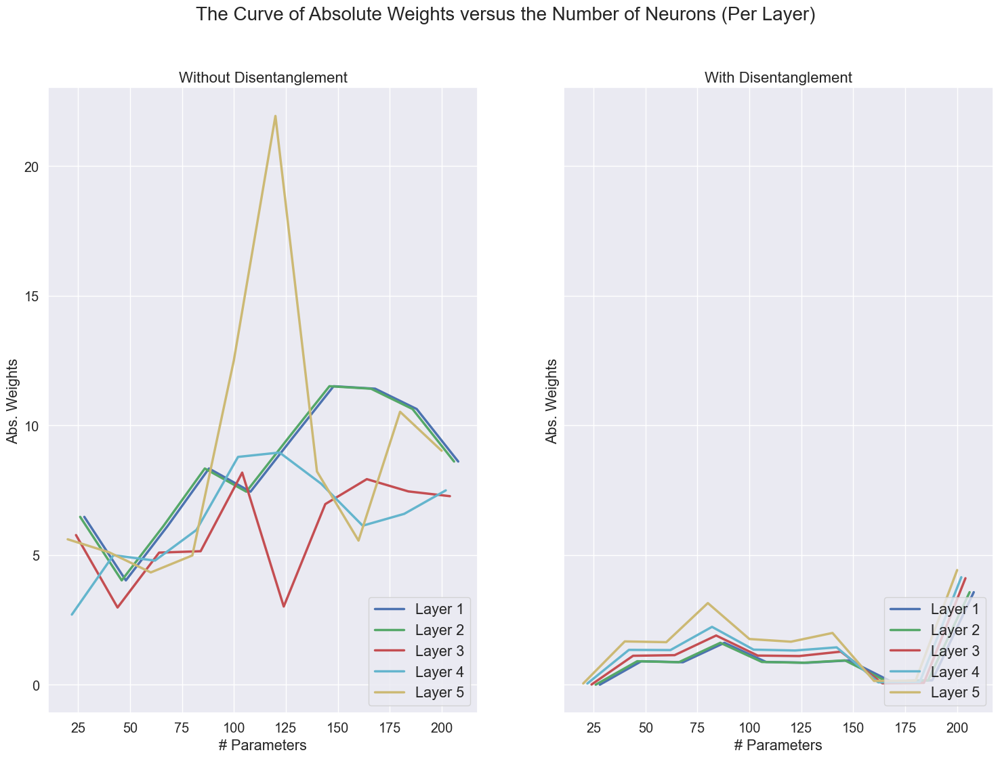

In [9]:
neurons_without_disentanglement = np.zeros((10, 5))
neurons_with_disentanglement = np.zeros((10, 5))

abs_weights_without_disentanglement = np.zeros((10, 5))
abs_weights_with_disentanglement = np.zeros((10, 5))

for i in range(10):
    for j in range(1, 6):
        abs_weights_without_disentanglement[i, j - 1] = np.power(np.sum(np.power(weights_without_disentanglement[i][j - 1], 2)) + np.sum(np.power(weights_without_disentanglement[i][j + 5], 2)), 0.5)
        neurons_without_disentanglement[i, j - 1] = len(weights_without_disentanglement[i][j])
        
        abs_weights_with_disentanglement[i, j - 1] = np.power(np.sum(np.power(weights_with_disentanglement[i][j - 1], 2)) + np.sum(np.power(weights_with_disentanglement[i][j + 5], 2)), 0.5)
        neurons_with_disentanglement[i, j - 1] = len(weights_without_disentanglement[i][j])
        
fig, axs = plt.subplots(1, 2, figsize = (18, 2 * 6), sharex = "row", sharey = "row")
fig.suptitle('The Curve of Absolute Weights versus the Number of Neurons (Per Layer)', fontsize = 20)

ax = axs[0]

ax.set_title('Without Disentanglement', fontsize = 16)

ax.set_xlabel('# Parameters')
ax.set_ylabel('Abs. Weights')

ax.plot(neurons_without_disentanglement[:, 0], abs_weights_without_disentanglement[:, 1], "-b", label = "Layer 1")
ax.plot(neurons_without_disentanglement[:, 1], abs_weights_without_disentanglement[:, 1], "-g", label = "Layer 2")
ax.plot(neurons_without_disentanglement[:, 2], abs_weights_without_disentanglement[:, 2], "-r", label = "Layer 3")
ax.plot(neurons_without_disentanglement[:, 3], abs_weights_without_disentanglement[:, 3], "-c", label = "Layer 4")
ax.plot(neurons_without_disentanglement[:, 4], abs_weights_without_disentanglement[:, 4], "-y", label = "Layer 5")

ax.legend(loc = 'lower right', fontsize = 'medium')

ax = axs[1]

ax.set_title('With Disentanglement', fontsize = 16)

ax.set_xlabel('# Parameters')
ax.set_ylabel('Abs. Weights')

ax.plot(neurons_with_disentanglement[:, 0], abs_weights_with_disentanglement[:, 1], "-b", label = "Layer 1")
ax.plot(neurons_with_disentanglement[:, 1], abs_weights_with_disentanglement[:, 1], "-g", label = "Layer 2")
ax.plot(neurons_with_disentanglement[:, 2], abs_weights_with_disentanglement[:, 2], "-r", label = "Layer 3")
ax.plot(neurons_with_disentanglement[:, 3], abs_weights_with_disentanglement[:, 3], "-c", label = "Layer 4")
ax.plot(neurons_with_disentanglement[:, 4], abs_weights_with_disentanglement[:, 4], "-y", label = "Layer 5")

ax.legend(loc = 'lower right', fontsize = 'medium')

fig.savefig('Figures/Subspace_Net/The Curve of Absolute Weights versus the Number of Neurons_Per Layer_Linear_4.png', dpi=300, bbox_inches='tight')

### 2.1.3 Absolute Weights versus the Number of all Neurons <a class="anchor" id="section_2_1_3"></a>

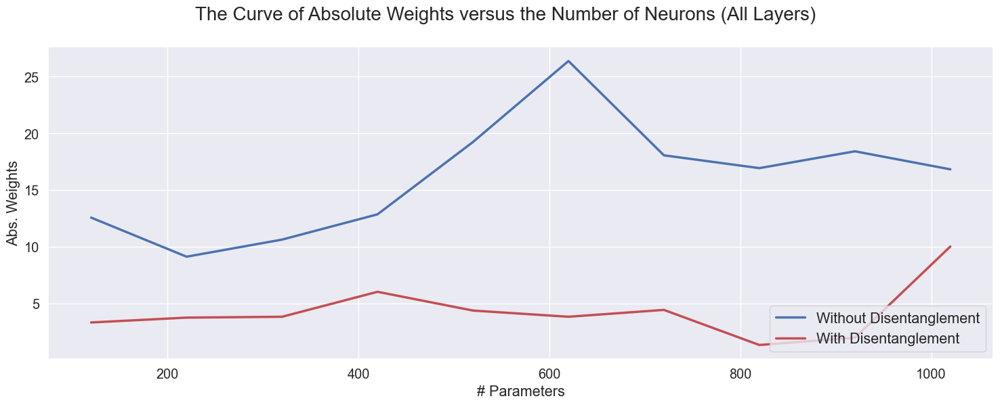

In [10]:
neurons_without_disentanglement = np.zeros(10)
neurons_with_disentanglement = np.zeros(10)

abs_weights_without_disentanglement = np.zeros(10)
abs_weights_with_disentanglement = np.zeros(10)

for i in range(10):
    for j in range(12):
        abs_weights_without_disentanglement[i] = abs_weights_without_disentanglement[i] + np.sum(np.power(weights_without_disentanglement[i][j], 2))  
        abs_weights_with_disentanglement[i] = abs_weights_with_disentanglement[i] + np.sum(np.power(weights_with_disentanglement[i][j], 2))
                                                                                                   
    abs_weights_without_disentanglement[i] = np.power(abs_weights_without_disentanglement[i], 0.5)
    abs_weights_with_disentanglement[i] = np.power(abs_weights_with_disentanglement[i], 0.5)
    
for i in range(10):
    for j in range(1, 6):
        neurons_without_disentanglement[i] = neurons_without_disentanglement[i] + len(weights_without_disentanglement[i][j])
        neurons_with_disentanglement[i] = neurons_with_disentanglement[i] + len(weights_with_disentanglement[i][j])
        
fig, axs = plt.subplots(1, 1, figsize = (18, 6))
fig.suptitle('The Curve of Absolute Weights versus the Number of Neurons (All Layers)', fontsize = 20)

ax = axs

ax.set_xlabel('# Parameters')
ax.set_ylabel('Abs. Weights')

ax.plot(neurons_without_disentanglement, abs_weights_without_disentanglement, "-b", label = "Without Disentanglement")
ax.plot(neurons_with_disentanglement, abs_weights_with_disentanglement, "-r", label = "With Disentanglement")

ax.legend(loc = 'lower right', fontsize = 'medium')

fig.savefig('Figures/Subspace_Net/The Curve of Absolute Weights versus the Number of Neurons_All Layers_Linear_4.png', dpi=300, bbox_inches='tight')

### 2.1.4 Geometry Function (Method 1) <a class="anchor" id="section_2_1_4"></a>

In [11]:
P = 20

def compute_geometry(manifolds):
    # Radius, centers, subspaces
    Rs = []
    centers = []
    Us = []
    
    for manifold in tqdm(manifolds, leave=False):
        center = manifold.mean(0)
        centers.append(center)
        _, R, U = np.linalg.svd(manifold - center)
        Rs.append(R[:P])
        Us.append(U[:P])
    
    Rs = np.stack(Rs)
    centers = np.stack(centers)
    Us = np.stack(Us)
    
    # Overlaps
    K = len(manifolds)
    ss = []
    csa = []
    csb = []
    
    for a in tqdm(range(K), leave = False):
        for b in range(K):
            if a != b:
                # Center-subspace
                dx0 = centers[a] - centers[b]
                dx0hat = dx0 / np.linalg.norm(dx0)
                costheta_a = Us[a] @ dx0hat
                csa.append((costheta_a ** 2 * Rs[a] ** 2).sum() / (Rs[a] ** 2).sum())
                costheta_b = Us[b] @ dx0hat
                csb.append((costheta_b ** 2 * Rs[b] ** 2).sum() / (Rs[a] ** 2).sum())

                # Subspace-subspace
                cosphi = Us[a] @ Us[b].T
                ss_overlap = (cosphi ** 2 * Rs[a][:, None] ** 2 * Rs[b] ** 2).sum() / (Rs[a] ** 2).sum() ** 2
                ss.append(ss_overlap)
            
            else:
                csa.append(np.nan)
                csb.append(np.nan)
                ss.append(np.nan)
                
    csa = np.stack(csa).reshape(K, K)
    csb = np.stack(csb).reshape(K, K)
    ss = np.stack(ss).reshape(K, K)
    
    return Rs, Us, centers, csa, csb, ss

### 2.1.5 Building Manifolds and Calculating the Dimensionality (Method 1) <a class="anchor" id="section_2_1_5"></a>

In [12]:
import copy


for i in range(10):
    inputs_labels_without_disentanglement = np.zeros((1000, len(inputs_without_disentanglement[i][0])))
    inputs_labels_with_disentanglement = np.zeros((1000, len(inputs_without_disentanglement[i][0])))

    for j in range(1000):
        for k in range(len(inputs_without_disentanglement[i][j])):
            inputs_labels_without_disentanglement[j][k] = np.round(10 * inputs_without_disentanglement[i][j][k][0])
            inputs_labels_with_disentanglement[j][k] = np.round(10 * inputs_with_disentanglement[i][j][k][0])
            
    images_labels_without_disentanglement = []
    images_labels_with_disentanglement = []
    
    for j in range(-10, 10):
        images_labels_without_disentanglement_temp = []
        images_labels_with_disentanglement_temp = []
        
        for k in range(1000):
            for l in range(len(inputs_without_disentanglement[i][j])):
                if inputs_labels_without_disentanglement[k][l] == j:
                    images_labels_without_disentanglement_temp.append(images_without_disentanglement[i][k][l])
                    
                if inputs_labels_with_disentanglement[k][l] == j: 
                    images_labels_with_disentanglement_temp.append(images_with_disentanglement[i][k][l])
        
        images_labels_without_disentanglement.append(images_labels_without_disentanglement_temp)
        images_labels_with_disentanglement.append(images_labels_with_disentanglement_temp)
    
    training_manifolds_without_disentanglement_1 = []
    training_manifolds_without_disentanglement_2 = []
    training_manifolds_without_disentanglement_3 = []
    training_manifolds_without_disentanglement_4 = []
    training_manifolds_without_disentanglement_5 = []
    
    for j in range(len(images_labels_without_disentanglement)):
        training_manifolds_without_disentanglement_1_temp = []
        training_manifolds_without_disentanglement_2_temp = []
        training_manifolds_without_disentanglement_3_temp = []
        training_manifolds_without_disentanglement_4_temp = []
        training_manifolds_without_disentanglement_5_temp = []
    
        for k in range(len(images_labels_without_disentanglement[j])):            
            training_manifold_1 = images_labels_without_disentanglement[j][k]           
            
            for l in range(5):
                training_manifold_2 = 0
                
                for m in range(len(weights_without_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_without_disentanglement[i][l][m] + weights_without_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_without_disentanglement_1_temp.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_without_disentanglement_2_temp.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_without_disentanglement_3_temp.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_without_disentanglement_4_temp.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_without_disentanglement_5_temp.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
        
        if len(images_labels_without_disentanglement[j]) >= 20:
            training_manifolds_without_disentanglement_1.append(np.array(training_manifolds_without_disentanglement_1_temp)[:20])
            training_manifolds_without_disentanglement_2.append(np.array(training_manifolds_without_disentanglement_2_temp)[:20])
            training_manifolds_without_disentanglement_3.append(np.array(training_manifolds_without_disentanglement_3_temp)[:20])
            training_manifolds_without_disentanglement_4.append(np.array(training_manifolds_without_disentanglement_4_temp)[:20])
            training_manifolds_without_disentanglement_5.append(np.array(training_manifolds_without_disentanglement_5_temp)[:20])
        
    training_manifolds_with_disentanglement_1 = []
    training_manifolds_with_disentanglement_2 = []
    training_manifolds_with_disentanglement_3 = []
    training_manifolds_with_disentanglement_4 = []
    training_manifolds_with_disentanglement_5 = []
    
    for j in range(len(images_labels_with_disentanglement)):
        training_manifolds_with_disentanglement_1_temp = []
        training_manifolds_with_disentanglement_2_temp = []
        training_manifolds_with_disentanglement_3_temp = []
        training_manifolds_with_disentanglement_4_temp = []
        training_manifolds_with_disentanglement_5_temp = []
    
        for k in range(len(images_labels_with_disentanglement[j])):            
            training_manifold_1 = images_labels_with_disentanglement[j][k]           
            
            for l in range(5):
                training_manifold_2 = 0
                
                for m in range(len(weights_with_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_with_disentanglement[i][l][m] + weights_with_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_with_disentanglement_1_temp.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_with_disentanglement_2_temp.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_with_disentanglement_3_temp.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_with_disentanglement_4_temp.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_with_disentanglement_5_temp.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
                
        if len(images_labels_with_disentanglement[j]) >= 20:
            training_manifolds_with_disentanglement_1.append(np.array(training_manifolds_with_disentanglement_1_temp)[:20])
            training_manifolds_with_disentanglement_2.append(np.array(training_manifolds_with_disentanglement_2_temp)[:20])
            training_manifolds_with_disentanglement_3.append(np.array(training_manifolds_with_disentanglement_3_temp)[:20])
            training_manifolds_with_disentanglement_4.append(np.array(training_manifolds_with_disentanglement_4_temp)[:20])
            training_manifolds_with_disentanglement_5.append(np.array(training_manifolds_with_disentanglement_5_temp)[:20])
            
    for j in range(len(training_manifolds_without_disentanglement_1)):
        training_manifolds_without_disentanglement_1[j] = training_manifolds_without_disentanglement_1[j].T
        training_manifolds_without_disentanglement_2[j] = training_manifolds_without_disentanglement_2[j].T
        training_manifolds_without_disentanglement_3[j] = training_manifolds_without_disentanglement_3[j].T
        training_manifolds_without_disentanglement_4[j] = training_manifolds_without_disentanglement_4[j].T
        training_manifolds_without_disentanglement_5[j] = training_manifolds_without_disentanglement_5[j].T
    
    training_manifolds_without_disentanglement_1 = np.array(training_manifolds_without_disentanglement_1)
    training_manifolds_without_disentanglement_2 = np.array(training_manifolds_without_disentanglement_2)
    training_manifolds_without_disentanglement_3 = np.array(training_manifolds_without_disentanglement_3)
    training_manifolds_without_disentanglement_4 = np.array(training_manifolds_without_disentanglement_4)
    training_manifolds_without_disentanglement_5 = np.array(training_manifolds_without_disentanglement_5)

    for j in range(len(training_manifolds_with_disentanglement_1)):
        training_manifolds_with_disentanglement_1[j] = training_manifolds_with_disentanglement_1[j].T
        training_manifolds_with_disentanglement_2[j] = training_manifolds_with_disentanglement_2[j].T
        training_manifolds_with_disentanglement_3[j] = training_manifolds_with_disentanglement_3[j].T
        training_manifolds_with_disentanglement_4[j] = training_manifolds_with_disentanglement_4[j].T
        training_manifolds_with_disentanglement_5[j] = training_manifolds_with_disentanglement_5[j].T
    
    training_manifolds_with_disentanglement_1 = np.array(training_manifolds_with_disentanglement_1)
    training_manifolds_with_disentanglement_2 = np.array(training_manifolds_with_disentanglement_2)
    training_manifolds_with_disentanglement_3 = np.array(training_manifolds_with_disentanglement_3)
    training_manifolds_with_disentanglement_4 = np.array(training_manifolds_with_disentanglement_4)
    training_manifolds_with_disentanglement_5 = np.array(training_manifolds_with_disentanglement_5)
    
    training_manifolds_without_disentanglement_final = []
    training_manifolds_with_disentanglement_final = []

    training_manifolds_without_disentanglement_final.append(training_manifolds_without_disentanglement_1)
    training_manifolds_without_disentanglement_final.append(training_manifolds_without_disentanglement_2)
    training_manifolds_without_disentanglement_final.append(training_manifolds_without_disentanglement_3)
    training_manifolds_without_disentanglement_final.append(training_manifolds_without_disentanglement_4)
    training_manifolds_without_disentanglement_final.append(training_manifolds_without_disentanglement_5)

    training_manifolds_with_disentanglement_final.append(training_manifolds_with_disentanglement_1)
    training_manifolds_with_disentanglement_final.append(training_manifolds_with_disentanglement_2)
    training_manifolds_with_disentanglement_final.append(training_manifolds_with_disentanglement_3)
    training_manifolds_with_disentanglement_final.append(training_manifolds_with_disentanglement_4)
    training_manifolds_with_disentanglement_final.append(training_manifolds_with_disentanglement_5)
    
    Rs_all_without_disentanglement = []
    Us_all_without_disentanglement = [] 
    centers_all_without_disentanglement = []
    csa_all_without_disentanglement = []
    csb_all_without_disentanglement = []
    ss_all_without_disentanglement = []
        
    for j in range(5):
        manifolds = training_manifolds_without_disentanglement_final[j]
        Rs, Us, centers, csa, csb, ss = compute_geometry(manifolds)
            
        Rs_all_without_disentanglement.append(Rs)
        Us_all_without_disentanglement.append(Us)
        centers_all_without_disentanglement.append(centers)
        csa_all_without_disentanglement.append(csa)
        csb_all_without_disentanglement.append(csb)
        ss_all_without_disentanglement.append(ss)
    
    Rs_all_without_disentanglement = np.stack(Rs_all_without_disentanglement)
    Ds_without_disentanglement = (Rs_all_without_disentanglement ** 2).sum(-1) ** 2 / (Rs_all_without_disentanglement ** 4).sum(-1)              

    scipy.io.savemat('Figures/Subspace_Net/Ds_without_disentanglement_deep_linear_factor_4_method1_' + str(i) + '.mat', mdict = {'Ds': Ds_without_disentanglement})
        
    Rs_all_with_disentanglement = []
    Us_all_with_disentanglement = [] 
    centers_all_with_disentanglement = []
    csa_all_with_disentanglement = []
    csb_all_with_disentanglement = []
    ss_all_with_disentanglement = []
        
    for j in range(5):
        manifolds = training_manifolds_with_disentanglement_final[j]
        Rs, Us, centers, csa, csb, ss = compute_geometry(manifolds)
            
        Rs_all_with_disentanglement.append(Rs)
        Us_all_with_disentanglement.append(Us)
        centers_all_with_disentanglement.append(centers)
        csa_all_with_disentanglement.append(csa)
        csb_all_with_disentanglement.append(csb)
        ss_all_with_disentanglement.append(ss)
    
    Rs_all_with_disentanglement = np.stack(Rs_all_with_disentanglement)
    Ds_with_disentanglement = (Rs_all_with_disentanglement ** 2).sum(-1) ** 2 / (Rs_all_with_disentanglement ** 4).sum(-1)              

    scipy.io.savemat('Figures/Subspace_Net/Ds_with_disentanglement_deep_linear_factor_4_method1_' + str(i) + '.mat', mdict = {'Ds': Ds_with_disentanglement})

C:\Users\Lion\AppData\Local\Temp\ipykernel_4932\3676571061.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for manifold in tqdm(manifolds, leave=False):


  0%|          | 0/16 [00:00<?, ?it/s]

C:\Users\Lion\AppData\Local\Temp\ipykernel_4932\3676571061.py:26: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for a in tqdm(range(K), leave = False):


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

C:\Users\Lion\AppData\Local\Temp\ipykernel_4932\3676571061.py:31: RuntimeWarning: invalid value encountered in divide
  dx0hat = dx0 / np.linalg.norm(dx0)


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

### 2.1.6 Plotting the Dimensionality across Layers (Method 1) <a class="anchor" id="section_2_1_6"></a>

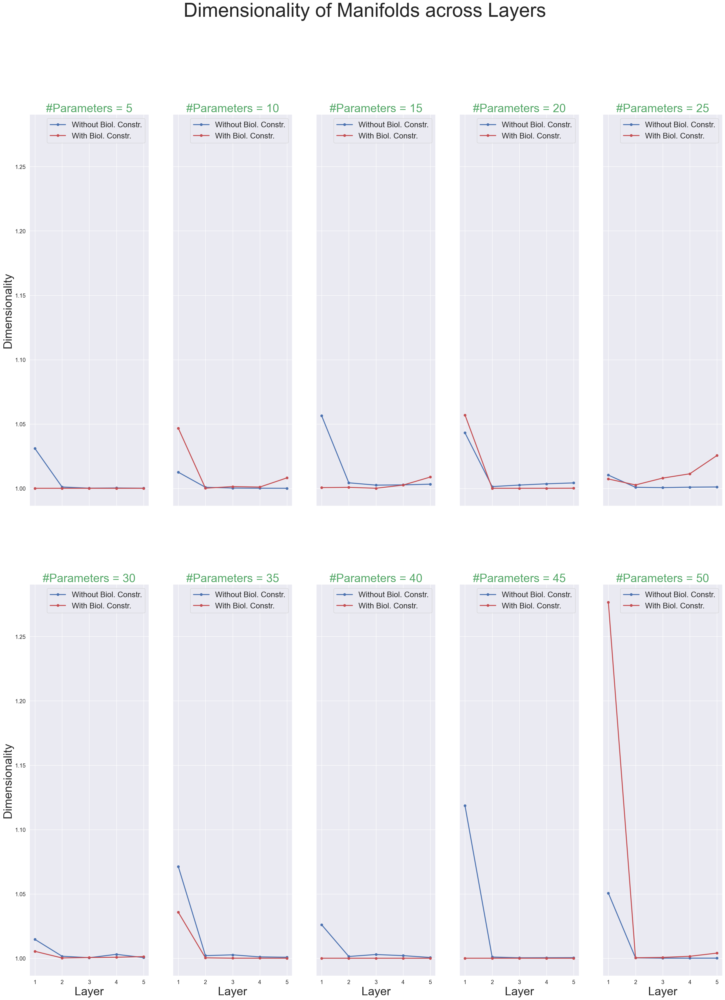

In [16]:
fig, axs = plt.subplots(2, 5, figsize = (2 * 16, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('Dimensionality of Manifolds across Layers', fontsize = 50)

parameters = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

for i in range(10):
    if i < 5:
        ax = axs[0, i]
    elif i >= 5:
        ax = axs[1, i - 5]
        ax.set_xlabel('Layer', fontsize = 30)
        
    if i == 0 or i == 5:
        ax.set_ylabel('Dimensionality', fontsize = 30)
        
    ax.set_title('#Parameters = ' + str(parameters[i]), fontsize = 30, color = 'g')
    
    Ds_without_disentanglement = scipy.io.loadmat('Figures/Subspace_Net/Ds_without_disentanglement_deep_linear_factor_4_method1_' + str(i) + '.mat')['Ds']
    Ds_with_disentanglement = scipy.io.loadmat('Figures/Subspace_Net/Ds_with_disentanglement_deep_linear_factor_4_method1_' + str(i) + '.mat')['Ds']

    ax.plot(range(1, 6), Ds_without_disentanglement.mean(-1), "-ob", label = "Without Biol. Constr.")
    ax.plot(range(1, 6), Ds_with_disentanglement.mean(-1), "-or", label = "With Biol. Constr.")
    
    ax.legend(loc = 'upper right', fontsize = 20)
                        
fig.savefig('Figures/Subspace_Net/Dimensionality of Manifolds across Layers_Linear_4_Method1.png')

### 2.1.7 Geometry Function (Method 2) <a class="anchor" id="section_2_1_7"></a>

In [17]:
import numpy as np
from scipy.stats import pearsonr
from sklearn import linear_model

                     
def intrinsic_dimension(X, fraction = 0.9, verbose = False):    
    """
        Estimates the intrinsic dimension of a system of points from the matrix of their distances X
        
        Args:
        X: 2-D Matrix X (n, n) where n is the number of points
        fraction: fraction of the data considered for the dimensionality estimation (default: fraction = 0.9)
        
        Returns:            
        x: log(mu)    (*)
        y: - (1 - F(mu)) (*)
        reg: linear regression y ~ x structure obtained with scipy.stats.linregress
        (reg.slope is the intrinsic dimension estimate)
        r: determination coefficient of y ~ x
        pval: p-value of y ~ x
            
        (*) See cited paper for description
        
        Usage:
        _, _, reg, r, pval = estimate(X, fraction = 0.85)
            
        The technique is described in:          
        "Estimating the intrinsic dimension of datasets by a minimal neighborhood information"       
        Authors: Elena Facco, Maria d’Errico, Alex Rodriguez & Alessandro Laio        
        Scientific Reports 7, Article number: 12140 (2017)
        doi:10.1038/s41598-017-11873-y  
    """             
     
    # Sort distance matrix
    Y = np.sort(X, axis = 1, kind = 'quicksort')

    # Clean data
    k1 = Y[:, 1]
    k2 = Y[:, 2]

    zeros = np.where(k1 == 0)[0]
    
    if verbose:
        print('Found n. {} elements for which r1 = 0'.format(zeros.shape[0]))
        print(zeros)

    degeneracies = np.where(k1 == k2)[0]
    
    if verbose:
        print('Found n. {} elements for which r1 = r2'.format(degeneracies.shape[0]))
        print(degeneracies)

    good = np.setdiff1d(np.arange(Y.shape[0]), np.array(zeros))
    good = np.setdiff1d(good, np.array(degeneracies))
    
    if verbose:
        print('Fraction good points: {}'.format(good.shape[0] / Y.shape[0]))
    
    k1 = k1[good]
    k2 = k2[good]    
    
    # Number of points to consider for the linear regression
    npoints = int(np.floor(good.shape[0] * fraction))

    # Define mu and Femp
    N = good.shape[0]
    mu = np.sort(np.divide(k2, k1), axis = None, kind = 'quicksort')
    Femp = (np.arange(1, N + 1, dtype = np.float64)) / N
    
    # Take logs (leave out the last element because 1 - Femp is zero there)
    x = np.log(mu[:-2])
    y = - np.log(1 - Femp[:-2])

    # Regression
    regr = linear_model.LinearRegression(fit_intercept = False)
    
    if x.shape[0] > 0:
        regr.fit(x[0:npoints, np.newaxis], y[0:npoints, np.newaxis]) 
        r, pval = pearsonr(x[0:npoints], y[0:npoints])        
        return x, y, regr.coef_[0][0], r, pval 
    
    elif x.shape[0] == 0:
        return x, y, 0.0, 0.0, 0.0  

### 2.1.8 Building Manifolds and Calculating the Dimensionality (Method 2) <a class="anchor" id="section_2_1_8"></a>

In [18]:
import copy
from scipy.spatial.distance import pdist, squareform


for i in range(10):
    training_manifolds_without_disentanglement_1 = []
    training_manifolds_without_disentanglement_2 = []
    training_manifolds_without_disentanglement_3 = []
    training_manifolds_without_disentanglement_4 = []
    training_manifolds_without_disentanglement_5 = []
    
    for j in range(10):
        for k in range(len(images_without_disentanglement[i][j])):

            training_manifold_1 = images_without_disentanglement[i][j][k]           
            
            for l in range(5):
                training_manifold_2 = 0
                
                for m in range(len(weights_without_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_without_disentanglement[i][l][m] + weights_without_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_without_disentanglement_1.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_without_disentanglement_2.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_without_disentanglement_3.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_without_disentanglement_4.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_without_disentanglement_5.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
                
    training_manifolds_with_disentanglement_1 = []
    training_manifolds_with_disentanglement_2 = []
    training_manifolds_with_disentanglement_3 = []
    training_manifolds_with_disentanglement_4 = []
    training_manifolds_with_disentanglement_5 = []
    
    for j in range(10):
        for k in range(len(images_with_disentanglement[i][j])):

            training_manifold_1 = images_with_disentanglement[i][j][k]           
            
            for l in range(5):
                training_manifold_2 = 0
                
                for m in range(len(weights_with_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_with_disentanglement[i][l][m] + weights_with_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_with_disentanglement_1.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_with_disentanglement_2.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_with_disentanglement_3.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_with_disentanglement_4.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_with_disentanglement_5.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
    
    training_manifolds_without_disentanglement_1_final = np.array(training_manifolds_without_disentanglement_1)
    training_manifolds_without_disentanglement_2_final = np.array(training_manifolds_without_disentanglement_2)
    training_manifolds_without_disentanglement_3_final = np.array(training_manifolds_without_disentanglement_3)
    training_manifolds_without_disentanglement_4_final = np.array(training_manifolds_without_disentanglement_4)
    training_manifolds_without_disentanglement_5_final = np.array(training_manifolds_without_disentanglement_5)
    
    training_manifolds_with_disentanglement_1_final = np.array(training_manifolds_with_disentanglement_1)
    training_manifolds_with_disentanglement_2_final = np.array(training_manifolds_with_disentanglement_2)
    training_manifolds_with_disentanglement_3_final = np.array(training_manifolds_with_disentanglement_3)
    training_manifolds_with_disentanglement_4_final = np.array(training_manifolds_with_disentanglement_4)
    training_manifolds_with_disentanglement_5_final = np.array(training_manifolds_with_disentanglement_5)
                    
    intrinsic_dimension_without_disentanglement = []
    intrinsic_dimension_with_disentanglement = [] 
    
    intrinsic_dimension_without_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_without_disentanglement_1_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_without_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_without_disentanglement_2_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_without_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_without_disentanglement_3_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_without_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_without_disentanglement_4_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_without_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_without_disentanglement_5_final), 'euclidean'), fraction = 1.0)[2])
    
    intrinsic_dimension_without_disentanglement = np.array(intrinsic_dimension_without_disentanglement)
    
    scipy.io.savemat('Figures/Subspace_Net/Ds_without_disentanglement_deep_linear_factor_4_method2_' + str(i) + '.mat', mdict = {'Ds': intrinsic_dimension_without_disentanglement})
    
    intrinsic_dimension_with_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_with_disentanglement_1_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_with_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_with_disentanglement_2_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_with_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_with_disentanglement_3_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_with_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_with_disentanglement_4_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_with_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_with_disentanglement_5_final), 'euclidean'), fraction = 1.0)[2])
    
    intrinsic_dimension_with_disentanglement = np.array(intrinsic_dimension_with_disentanglement)
    
    scipy.io.savemat('Figures/Subspace_Net/Ds_with_disentanglement_deep_linear_factor_4_method2_' + str(i) + '.mat', mdict = {'Ds': intrinsic_dimension_with_disentanglement})

### 2.1.9 Plotting the Dimensionality across Layers (Method 2) <a class="anchor" id="section_2_1_9"></a>

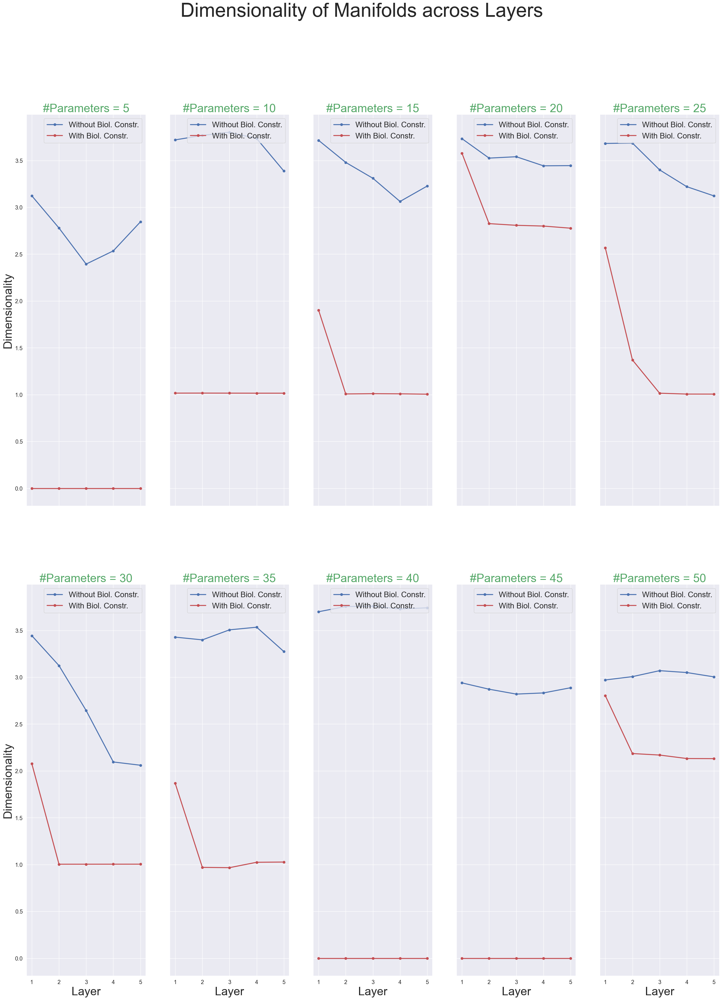

In [19]:
fig, axs = plt.subplots(2, 5, figsize = (2 * 16, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('Dimensionality of Manifolds across Layers', fontsize = 50)

parameters = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

for i in range(10):
    if i < 5:
        ax = axs[0, i]
    elif i >= 5:
        ax = axs[1, i - 5]
        ax.set_xlabel('Layer', fontsize = 30)
        
    if i == 0 or i == 5:
        ax.set_ylabel('Dimensionality', fontsize = 30)
        
    ax.set_title('#Parameters = ' + str(parameters[i]), fontsize = 30, color = 'g')
    
    Ds_without_disentanglement = scipy.io.loadmat('Figures/Subspace_Net/Ds_without_disentanglement_deep_linear_factor_4_method2_' + str(i) + '.mat')['Ds']
    Ds_with_disentanglement = scipy.io.loadmat('Figures/Subspace_Net/Ds_with_disentanglement_deep_linear_factor_4_method2_' + str(i) + '.mat')['Ds']

    ax.plot(range(1, 6), Ds_without_disentanglement.squeeze(0), "-ob", label = "Without Biol. Constr.")
    ax.plot(range(1, 6), Ds_with_disentanglement.squeeze(0), "-or", label = "With Biol. Constr.")
    
    ax.legend(loc = 'upper right', fontsize = 20)
                        
fig.savefig('Figures/Subspace_Net/Dimensionality of Manifolds across Layers_Linear_4_Method2.png')

### 2.1.10 Functions for Computing Sample Efficient Learning Curves <a class="anchor" id="section_2_1_10"></a>

In [20]:
from cycler import cycler
import matplotlib as mpl
import pdb
import scipy as sp
import scipy.io
import scipy.optimize
from scipy.sparse.linalg import eigsh
import scipy.stats as stats
import skimage
from skimage import filters as filt
from skimage import transform
from sklearn.decomposition import PCA
import time

mpl.rcParams['axes.prop_cycle'] = cycler(color = 'bgrcmyk')

# import decoder
myfont = 6
myaxis_font = 8
plt.rcParams.update({'font.size': myfont})
line_width = 1


def f(z, *args):
    p, spectrum, lamb = args
    
    return z - lamb - z * np.sum(spectrum / (p * spectrum + z))


def fp(z, *args):
    p, spectrum, lamb = args
    
    return 1 - np.sum( spectrum / (p * spectrum + z)) + np.sum(spectrum / (p * spectrum + z) ** 2)


def solve_implicit(pvals, spectrum, lamb):
    zvals = np.zeros(len(pvals))
    
    for i, p in enumerate(pvals):
        args = (p, spectrum, lamb)
        zvals[i] = sp.optimize.root_scalar(f = f, method = 'newton', fprime = fp, x0 = 2 * np.sum(spectrum) + 2 * lamb, args = args).root
    
    return zvals


def gamma_fn(pvals, zvals, spectrum):
    all_vals = np.zeros(len(pvals))
    
    for i, p in enumerate(pvals):
        all_vals[i] = p * np.sum(spectrum ** 2 / (spectrum * p + zvals[i]) ** 2)
    
    return all_vals


def mode_errs(pvals, spectrum, teacher, lamb):
    zvals = solve_implicit(pvals, spectrum, lamb)
    gamma = gamma_fn(pvals, zvals, spectrum)
    err = np.zeros((len(spectrum), len(pvals)))
    
    for j in range(len(spectrum)):    
        lamb_j = spectrum[j]
        teacher_weights_j = teacher[j]
        err[j, :] = zvals ** 2 / (1 - gamma) * teacher_weights_j / (lamb_j * pvals + zvals) ** 2
        
        # if j == len(spectrum) - 1:
            # plt.loglog(pvals[0:10], err[0:10])
            # plt.show()
    
    return err


def sorted_spectral_decomp(resp, imgs = None):
    K = 1 / resp.shape[1] * resp @ resp.T
    s, v = np.linalg.eigh(K)
    indsort = np.argsort(s)[::-1]
    s = s[indsort]
    v = v[:, indsort]
    
    return K, s, v


def compute_learning_curves(K, y, pvals, lamb):
    # coeffs = 1 / K.shape[0] * (u.T @ y) ** 2
    # theory_lc = mode_errs(pvals, s, coeffs, lamb).sum(axis = 0)
    
    num_repeats = 5
    err_expt = np.zeros((len(pvals), num_repeats))
    
    for n in range(num_repeats):
        for i, p in enumerate(pvals):
            inds = np.random.choice(K.shape[0], p, replace = True)
            # test_i = permed[p:permed.shape[0]]
            
            Ki = K[inds, :]
            Kii = Ki[:, inds]
            # K_test = Ki[:, test_i]
            
            print(Ki.shape)
            yi = y[inds, :]
            yhat = Ki.T @ np.linalg.solve(Kii + 1 / K.shape[0] * lamb * np.eye(p), yi)
            err_expt[i, n] = np.sum((y - yhat) ** 2)
    
    return err_expt, yhat


def get_all_task_info(resp, y, pvals, ptheory):
    # K = 1 / resp.shape[1] * resp @ resp.T
    K, s, vec = sorted_spectral_decomp(resp)
    lamb = np.trace(K)
    teacher = np.sum((vec.T @ y) ** 2, axis = 1)
    err_expt, yhat = compute_learning_curves(K, y, pvals, lamb)
    theory = mode_errs(ptheory, s, teacher, lamb)
    
    return err_expt, theory, s, teacher, yhat

### 2.1.11 Calculating of Sample Efficient Learning Curves <a class="anchor" id="section_2_1_11"></a>

In [21]:
import copy


for i in range(10):
    training_manifolds_without_disentanglement_0 = []
    training_manifolds_without_disentanglement_1 = []
    training_manifolds_without_disentanglement_2 = []
    training_manifolds_without_disentanglement_3 = []
    training_manifolds_without_disentanglement_4 = []
    training_manifolds_without_disentanglement_5 = []
    
    for j in range(10):
        for k in range(len(images_without_disentanglement[i][j])):
            training_manifolds_without_disentanglement_0.append(images_without_disentanglement[i][j][k])
            training_manifold_1 = images_without_disentanglement[i][j][k]           
            
            for l in range(5):
                training_manifold_2 = 0
                
                for m in range(len(weights_without_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_without_disentanglement[i][l][m] + weights_without_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_without_disentanglement_1.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_without_disentanglement_2.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_without_disentanglement_3.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_without_disentanglement_4.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_without_disentanglement_5.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
                
    training_manifolds_with_disentanglement_0 = []
    training_manifolds_with_disentanglement_1 = []
    training_manifolds_with_disentanglement_2 = []
    training_manifolds_with_disentanglement_3 = []
    training_manifolds_with_disentanglement_4 = []
    training_manifolds_with_disentanglement_5 = []
    
    for j in range(10):
        for k in range(len(images_with_disentanglement[i][j])):
            training_manifolds_with_disentanglement_0.append(images_with_disentanglement[i][j][k])
            training_manifold_1 = images_with_disentanglement[i][j][k]           
            
            for l in range(5):
                training_manifold_2 = 0
                
                for m in range(len(weights_with_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_with_disentanglement[i][l][m] + weights_with_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_with_disentanglement_1.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_with_disentanglement_2.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_with_disentanglement_3.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_with_disentanglement_4.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_with_disentanglement_5.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
    
    training_manifolds_without_disentanglement_0_final = np.array(training_manifolds_without_disentanglement_0)
    training_manifolds_without_disentanglement_1_final = np.array(training_manifolds_without_disentanglement_1)
    training_manifolds_without_disentanglement_2_final = np.array(training_manifolds_without_disentanglement_2)
    training_manifolds_without_disentanglement_3_final = np.array(training_manifolds_without_disentanglement_3)
    training_manifolds_without_disentanglement_4_final = np.array(training_manifolds_without_disentanglement_4)
    training_manifolds_without_disentanglement_5_final = np.array(training_manifolds_without_disentanglement_5)
    
    training_manifolds_with_disentanglement_0_final = np.array(training_manifolds_with_disentanglement_0)
    training_manifolds_with_disentanglement_1_final = np.array(training_manifolds_with_disentanglement_1)
    training_manifolds_with_disentanglement_2_final = np.array(training_manifolds_with_disentanglement_2)
    training_manifolds_with_disentanglement_3_final = np.array(training_manifolds_with_disentanglement_3)
    training_manifolds_with_disentanglement_4_final = np.array(training_manifolds_with_disentanglement_4)
    training_manifolds_with_disentanglement_5_final = np.array(training_manifolds_with_disentanglement_5)
    
    all_err_layers_without_disentanglement = []
    all_theory_layers_without_disentanglement = []
    all_vk_layers_without_disentanglement = []
    
    for j in range(5):
        y_fourier = training_manifolds_without_disentanglement_0_final / np.sqrt(np.sum(training_manifolds_without_disentanglement_0_final ** 2))
            
        pvals = np.logspace(0, 3.0, 8).astype('int')
        ptheory = np.logspace(0, 3.5, 40)
        
        if j == 0:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_without_disentanglement_1_final, y_fourier, pvals, ptheory)
        elif j == 1:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_without_disentanglement_2_final, y_fourier, pvals, ptheory)
        elif j == 2:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_without_disentanglement_3_final, y_fourier, pvals, ptheory)
        elif j == 3:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_without_disentanglement_4_final, y_fourier, pvals, ptheory)
        elif j == 4:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_without_disentanglement_5_final, y_fourier, pvals, ptheory)
        
        all_err_layers_without_disentanglement += [err]
        all_theory_layers_without_disentanglement += [theory]
        all_vk_layers_without_disentanglement += [vk]
            
    scipy.io.savemat('Figures/Subspace_Net/pvals.mat', mdict = {'pvals': pvals})
    scipy.io.savemat('Figures/Subspace_Net/ptheory.mat', mdict = {'ptheory': ptheory})
            
    scipy.io.savemat('Figures/Subspace_Net/all_err_layers_without_disentanglement_linear_4_' + str(i) + '.mat', mdict = {'err': all_err_layers_without_disentanglement})
    scipy.io.savemat('Figures/Subspace_Net/all_theory_layers_without_disentanglement_linear_4_' + str(i) + '.mat', mdict = {'theory': all_theory_layers_without_disentanglement})  
    scipy.io.savemat('Figures/Subspace_Net/all_vk_layers_without_disentanglement_linear_4_' + str(i) + '.mat', mdict = {'vk': all_vk_layers_without_disentanglement})
    
    all_err_layers_with_disentanglement = []
    all_theory_layers_with_disentanglement = []
    all_vk_layers_with_disentanglement = []
    
    for j in range(5):
        y_fourier = training_manifolds_with_disentanglement_0_final / np.sqrt(np.sum(training_manifolds_with_disentanglement_0_final ** 2))
            
        pvals = np.logspace(0, 3.0, 8).astype('int')
        ptheory = np.logspace(0, 3.5, 40)
        
        if j == 0:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_with_disentanglement_1_final, y_fourier, pvals, ptheory)
        elif j == 1:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_with_disentanglement_2_final, y_fourier, pvals, ptheory)
        elif j == 2:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_with_disentanglement_3_final, y_fourier, pvals, ptheory)
        elif j == 3:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_with_disentanglement_4_final, y_fourier, pvals, ptheory)
        elif j == 4:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_with_disentanglement_5_final, y_fourier, pvals, ptheory)
        
        all_err_layers_with_disentanglement += [err]
        all_theory_layers_with_disentanglement += [theory]
        all_vk_layers_with_disentanglement += [vk]
            
    scipy.io.savemat('Figures/Subspace_Net/pvals.mat', mdict = {'pvals': pvals})
    scipy.io.savemat('Figures/Subspace_Net/ptheory.mat', mdict = {'ptheory': ptheory})
            
    scipy.io.savemat('Figures/Subspace_Net/all_err_layers_with_disentanglement_linear_4_' + str(i) + '.mat', mdict = {'err': all_err_layers_with_disentanglement})
    scipy.io.savemat('Figures/Subspace_Net/all_theory_layers_with_disentanglement_linear_4_' + str(i) + '.mat', mdict = {'theory': all_theory_layers_with_disentanglement})  
    scipy.io.savemat('Figures/Subspace_Net/all_vk_layers_with_disentanglement_linear_4_' + str(i) + '.mat', mdict = {'vk': all_vk_layers_with_disentanglement})

(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(

(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 12

(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(

(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280

(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(

(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(

### 2.1.12 Plotting of Sample Efficient Learning Curves <a class="anchor" id="section_2_1_12"></a>

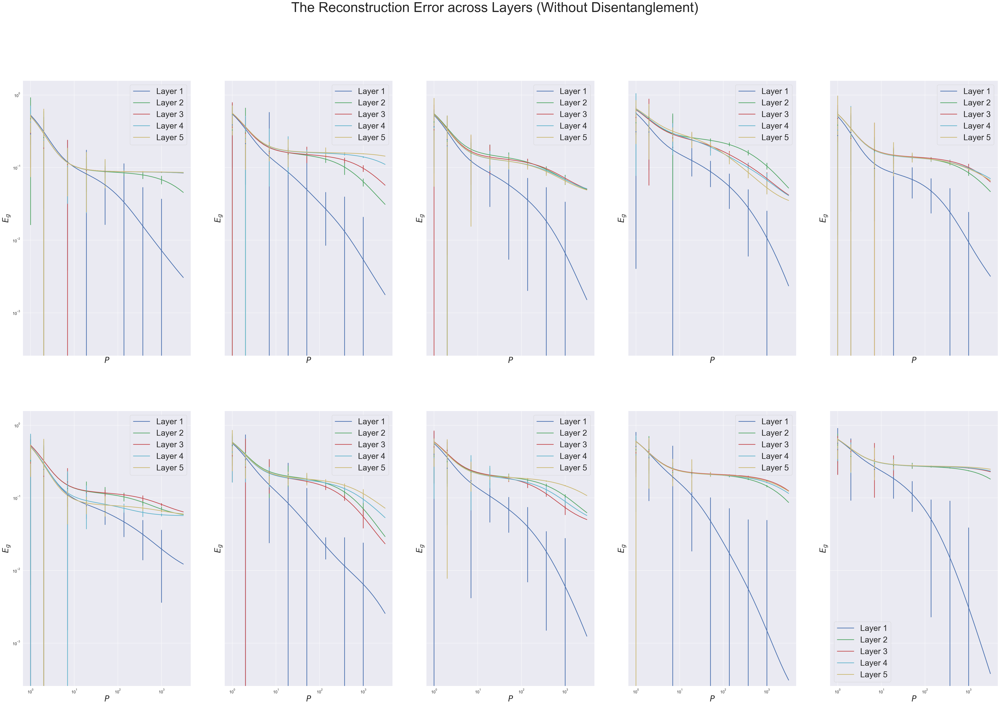

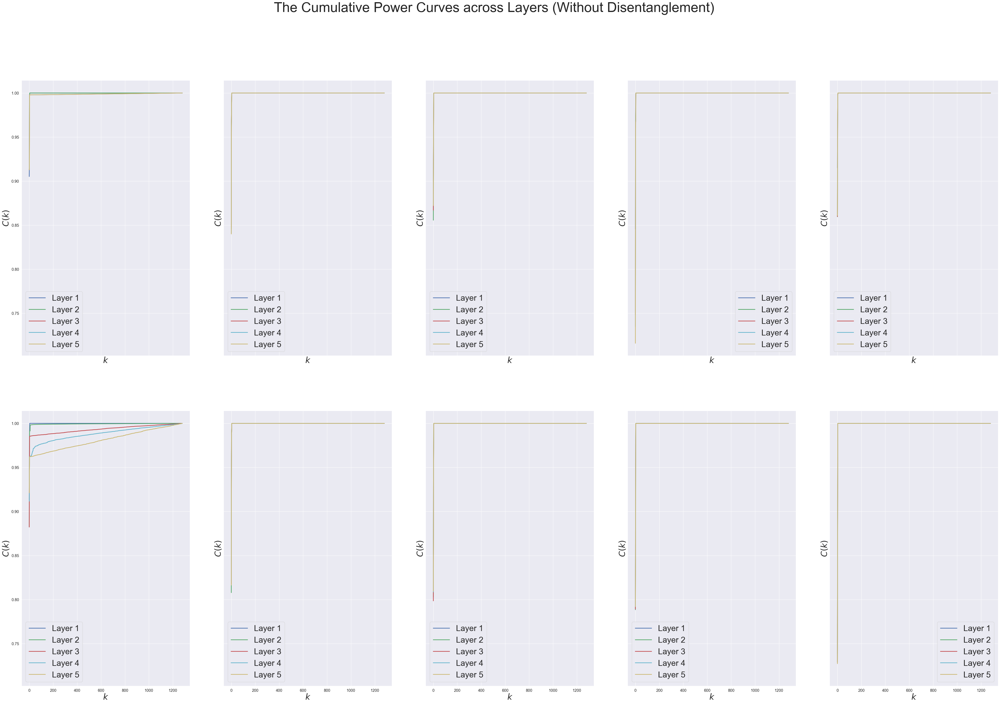

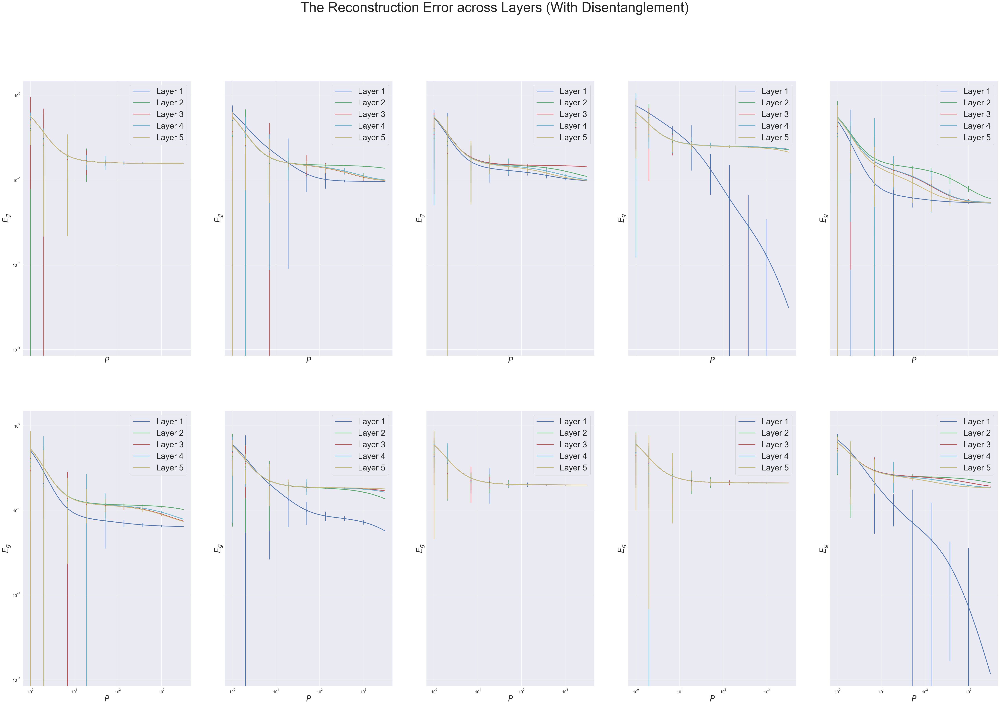

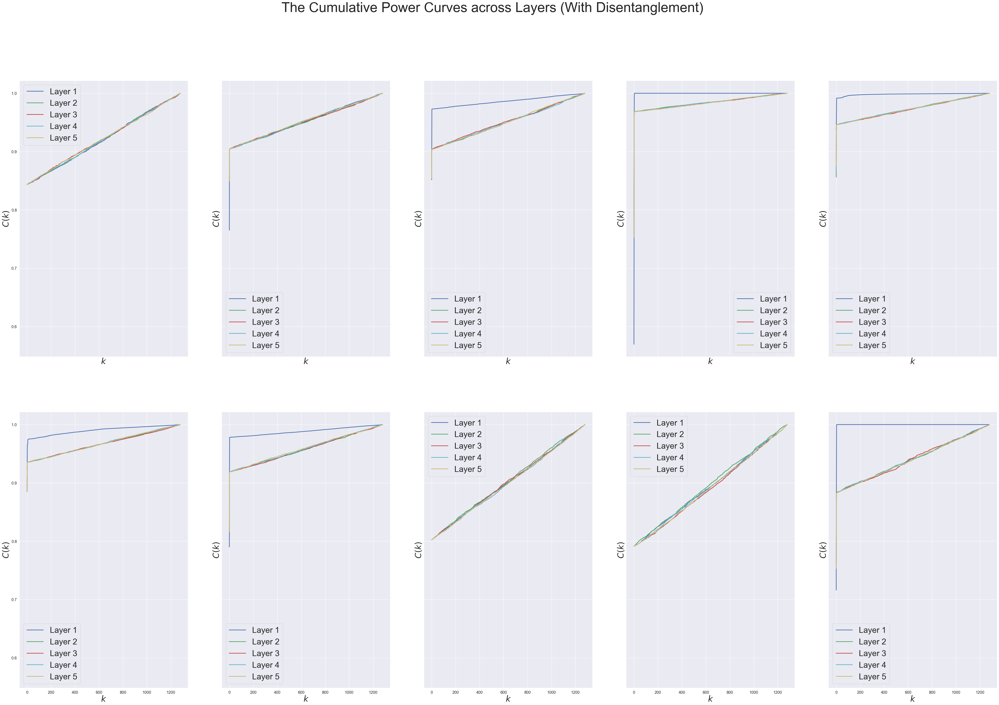

In [22]:
fig, axs = plt.subplots(2, 5, figsize = (2 * 32, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('The Reconstruction Error across Layers (Without Disentanglement)', fontsize = 50)

for i in range(10):            
    if i < 5:
        ax = axs[0, i]
    if i >= 5:
        ax = axs[1, i - 5]
        
    pvals = scipy.io.loadmat('Figures/Subspace_Net/pvals.mat')['pvals']
    ptheory = scipy.io.loadmat('Figures/Subspace_Net/ptheory.mat')['ptheory']
            
    err = scipy.io.loadmat('Figures/Subspace_Net/all_err_layers_without_disentanglement_linear_4_' + str(i) + '.mat')['err']
    theory = scipy.io.loadmat('Figures/Subspace_Net/all_theory_layers_without_disentanglement_linear_4_' + str(i) + '.mat')['theory'] 
    vk = scipy.io.loadmat('Figures/Subspace_Net/all_vk_layers_without_disentanglement_linear_4_' + str(i) + '.mat')['vk']
    
    color_array = ['b', 'g', 'r', 'c', 'y']
    label_array = ['Layer 1', 'Layer 2', 'Layer 3', 'Layer 4', 'Layer 5']
    
    for j in range(5):
        ax.loglog(ptheory.squeeze(0), theory[j].sum(axis = 0), color = color_array[j], label = label_array[j])
        ax.errorbar(pvals.squeeze(0), err[j].mean(axis = 1), err[j].std(axis = 1) / err[j].mean(axis = 1), fmt = 'o', markersize = 2.5, color = color_array[j])
            
    ax.legend(fontsize = 30)
    ax.set_xlabel(r'$P$', fontsize = 30)
    ax.set_ylabel(r'$E_g$', fontsize = 30)

fig.savefig('Figures/Subspace_Net/The Reconstruction Error across Layers (Without Disentanglement)_linear_4.png')

fig, axs = plt.subplots(2, 5, figsize = (2 * 32, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('The Cumulative Power Curves across Layers (Without Disentanglement)', fontsize = 50)

for i in range(10):            
    if i < 5:
        ax = axs[0, i]
    if i >= 5:
        ax = axs[1, i - 5]
        
    pvals = scipy.io.loadmat('Figures/Subspace_Net/pvals.mat')['pvals']
    ptheory = scipy.io.loadmat('Figures/Subspace_Net/ptheory.mat')['ptheory']
            
    err = scipy.io.loadmat('Figures/Subspace_Net/all_err_layers_without_disentanglement_linear_4_' + str(i) + '.mat')['err']
    theory = scipy.io.loadmat('Figures/Subspace_Net/all_theory_layers_without_disentanglement_linear_4_' + str(i) + '.mat')['theory'] 
    vk = scipy.io.loadmat('Figures/Subspace_Net/all_vk_layers_without_disentanglement_linear_4_' + str(i) + '.mat')['vk']
    
    color_array = ['b', 'g', 'r', 'c', 'y']
    label_array = ['Layer 1', 'Layer 2', 'Layer 3', 'Layer 4', 'Layer 5']
    
    for j in range(5):
        cumvk = np.cumsum(vk[j]) / np.sum(vk[j])
        ax.plot(cumvk, color = color_array[j], label = label_array[j])
            
    ax.legend(fontsize = 30)
    ax.set_xlabel(r'$k$', fontsize = 30)
    ax.set_ylabel(r'$C(k)$', fontsize = 30)

fig.savefig('Figures/Subspace_Net/The Cumulative Power Curves across Layers (Without Disentanglement)_linear_46.png')

fig, axs = plt.subplots(2, 5, figsize = (2 * 32, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('The Reconstruction Error across Layers (With Disentanglement)', fontsize = 50)

for i in range(10):            
    if i < 5:
        ax = axs[0, i]
    if i >= 5:
        ax = axs[1, i - 5]
        
    pvals = scipy.io.loadmat('Figures/Subspace_Net/pvals.mat')['pvals']
    ptheory = scipy.io.loadmat('Figures/Subspace_Net/ptheory.mat')['ptheory']
            
    err = scipy.io.loadmat('Figures/Subspace_Net/all_err_layers_with_disentanglement_linear_4_' + str(i) + '.mat')['err']
    theory = scipy.io.loadmat('Figures/Subspace_Net/all_theory_layers_with_disentanglement_linear_4_' + str(i) + '.mat')['theory'] 
    vk = scipy.io.loadmat('Figures/Subspace_Net/all_vk_layers_with_disentanglement_linear_4_' + str(i) + '.mat')['vk']
    
    color_array = ['b', 'g', 'r', 'c', 'y']
    label_array = ['Layer 1', 'Layer 2', 'Layer 3', 'Layer 4', 'Layer 5']
    
    for j in range(5):
        ax.loglog(ptheory.squeeze(0), theory[j].sum(axis = 0), color = color_array[j], label = label_array[j])
        ax.errorbar(pvals.squeeze(0), err[j].mean(axis = 1), err[j].std(axis = 1) / err[j].mean(axis = 1), fmt = 'o', markersize = 2.5, color = color_array[j])
            
    ax.legend(fontsize = 30)
    ax.set_xlabel(r'$P$', fontsize = 30)
    ax.set_ylabel(r'$E_g$', fontsize = 30)

fig.savefig('Figures/Subspace_Net/The Reconstruction Error across Layers (With Disentanglement)_linear_4.png')

fig, axs = plt.subplots(2, 5, figsize = (2 * 32, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('The Cumulative Power Curves across Layers (With Disentanglement)', fontsize = 50)

for i in range(10):            
    if i < 5:
        ax = axs[0, i]
    if i >= 5:
        ax = axs[1, i - 5]
        
    pvals = scipy.io.loadmat('Figures/Subspace_Net/pvals.mat')['pvals']
    ptheory = scipy.io.loadmat('Figures/Subspace_Net/ptheory.mat')['ptheory']
            
    err = scipy.io.loadmat('Figures/Subspace_Net/all_err_layers_with_disentanglement_linear_4_' + str(i) + '.mat')['err']
    theory = scipy.io.loadmat('Figures/Subspace_Net/all_theory_layers_with_disentanglement_linear_4_' + str(i) + '.mat')['theory'] 
    vk = scipy.io.loadmat('Figures/Subspace_Net/all_vk_layers_with_disentanglement_linear_4_' + str(i) + '.mat')['vk']
    
    color_array = ['b', 'g', 'r', 'c', 'y']
    label_array = ['Layer 1', 'Layer 2', 'Layer 3', 'Layer 4', 'Layer 5']
    
    for j in range(5):
        cumvk = np.cumsum(vk[j]) / np.sum(vk[j])
        ax.plot(cumvk, color = color_array[j], label = label_array[j])
            
    ax.legend(fontsize = 30)
    ax.set_xlabel(r'$k$', fontsize = 30)
    ax.set_ylabel(r'$C(k)$', fontsize = 30)

fig.savefig('Figures/Subspace_Net/The Cumulative Power Curves across Layers (With Disentanglement)_linear_4.png')

## 2.2 Linear Factor Data (Factor and Image Dimensions = 6) <a class="anchor" id="section_2_2"></a>

### 2.2.1 Reloading the Networks, Inputs, and Images <a class="anchor" id="section_2_2_1"></a>

In [23]:
date = '2023-05-02'
print('deep_lin_factors >>> factor dimension = 6')

weights_without_disentanglement = []
inputs_without_disentanglement = []
images_without_disentanglement = []

weights_with_disentanglement = []
inputs_with_disentanglement = []
images_with_disentanglement = []

for run in range(20):
    base_path = osp.dirname(osp.abspath("./")) + '/Summaries_subspaces/'
    run_path, train_path, model_path, save_path, script_path = set_directories(date, run, base_path=base_path)

    index = max([int(x.split('subspaces_')[1].split('.index')[0]) for x in os.listdir(model_path) if 'index' in x])
    grad_step = index + 1

    # Load previous packages
    model, params, m_u, d_u = get_model(model_path + '/subspaces_' + str(index), script_path, save_path,
                                        use_old_scripts=True, model_type='subspaces')

    # load full model - contains old optimizer state
    model_full = tf.keras.models.load_model(model_path + '/subspaces_full_model')
    
    if run % 2 == 0:
        print('RELOADING RUN: Without Disentanglement ', date, run)
        weights_without_disentanglement.append(model_full.get_weights())
        inputs_without_disentanglement.append(np.load(os.path.join(save_path, 'inputs.npy'), allow_pickle=True))
        images_without_disentanglement.append(np.load(os.path.join(save_path, 'images.npy'), allow_pickle=True))
    elif run % 2 == 1:
        print('RELOADING RUN: With Disentanglement ', date, run)
        weights_with_disentanglement.append(model_full.get_weights())
        inputs_with_disentanglement.append(np.load(os.path.join(save_path, 'inputs.npy'), allow_pickle=True))
        images_with_disentanglement.append(np.load(os.path.join(save_path, 'images.npy'), allow_pickle=True))

deep_lin_factors >>> factor dimension = 6


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-02 0


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-02 1


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-02 2


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-02 3


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-02 4


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-02 5


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-02 6


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-02 7


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-02 8


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-02 9


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-02 10


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-02 11


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-02 12


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-02 13


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-02 14


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-02 15


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-02 16


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-02 17


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-02 18


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-02 19


### 2.2.2 Absolute Weights versus the Number of Neurons Per Layer <a class="anchor" id="section_2_2_2"></a>

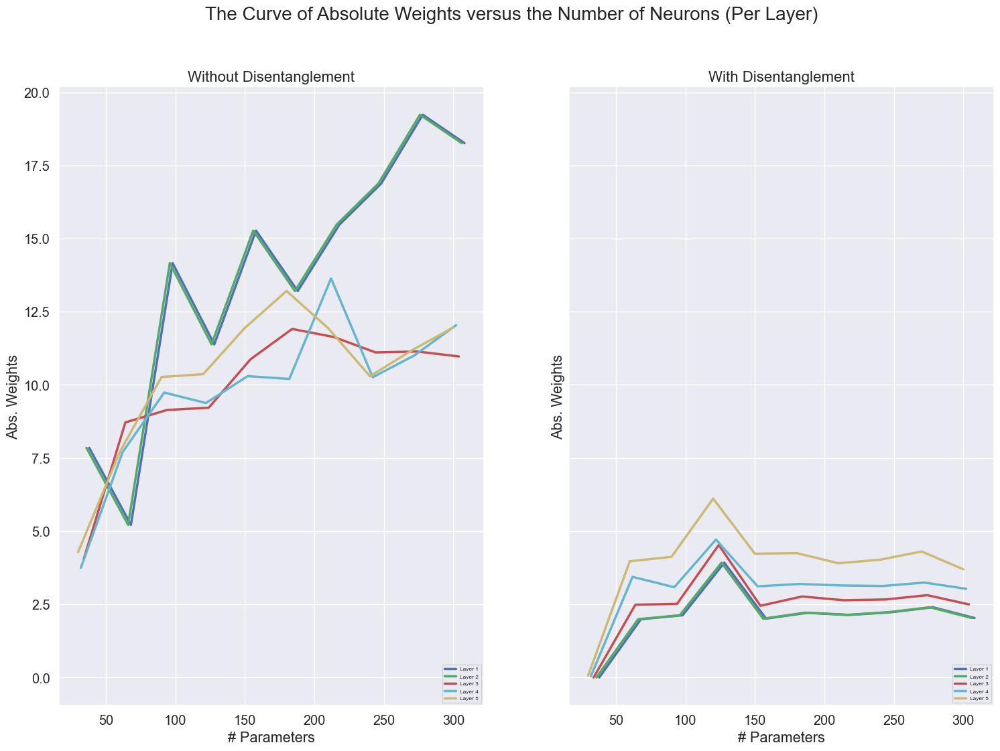

In [24]:
neurons_without_disentanglement = np.zeros((10, 5))
neurons_with_disentanglement = np.zeros((10, 5))

abs_weights_without_disentanglement = np.zeros((10, 5))
abs_weights_with_disentanglement = np.zeros((10, 5))

for i in range(10):
    for j in range(1, 6):
        abs_weights_without_disentanglement[i, j - 1] = np.power(np.sum(np.power(weights_without_disentanglement[i][j - 1], 2)) + np.sum(np.power(weights_without_disentanglement[i][j + 5], 2)), 0.5)
        neurons_without_disentanglement[i, j - 1] = len(weights_without_disentanglement[i][j])
        
        abs_weights_with_disentanglement[i, j - 1] = np.power(np.sum(np.power(weights_with_disentanglement[i][j - 1], 2)) + np.sum(np.power(weights_with_disentanglement[i][j + 5], 2)), 0.5)
        neurons_with_disentanglement[i, j - 1] = len(weights_without_disentanglement[i][j])
        
fig, axs = plt.subplots(1, 2, figsize = (18, 2 * 6), sharex = "row", sharey = "row")
fig.suptitle('The Curve of Absolute Weights versus the Number of Neurons (Per Layer)', fontsize = 20)

ax = axs[0]

ax.set_title('Without Disentanglement', fontsize = 16)

ax.set_xlabel('# Parameters')
ax.set_ylabel('Abs. Weights')

ax.plot(neurons_without_disentanglement[:, 0], abs_weights_without_disentanglement[:, 1], "-b", label = "Layer 1")
ax.plot(neurons_without_disentanglement[:, 1], abs_weights_without_disentanglement[:, 1], "-g", label = "Layer 2")
ax.plot(neurons_without_disentanglement[:, 2], abs_weights_without_disentanglement[:, 2], "-r", label = "Layer 3")
ax.plot(neurons_without_disentanglement[:, 3], abs_weights_without_disentanglement[:, 3], "-c", label = "Layer 4")
ax.plot(neurons_without_disentanglement[:, 4], abs_weights_without_disentanglement[:, 4], "-y", label = "Layer 5")

ax.legend(loc = 'lower right', fontsize = 'medium')

ax = axs[1]

ax.set_title('With Disentanglement', fontsize = 16)

ax.set_xlabel('# Parameters')
ax.set_ylabel('Abs. Weights')

ax.plot(neurons_with_disentanglement[:, 0], abs_weights_with_disentanglement[:, 1], "-b", label = "Layer 1")
ax.plot(neurons_with_disentanglement[:, 1], abs_weights_with_disentanglement[:, 1], "-g", label = "Layer 2")
ax.plot(neurons_with_disentanglement[:, 2], abs_weights_with_disentanglement[:, 2], "-r", label = "Layer 3")
ax.plot(neurons_with_disentanglement[:, 3], abs_weights_with_disentanglement[:, 3], "-c", label = "Layer 4")
ax.plot(neurons_with_disentanglement[:, 4], abs_weights_with_disentanglement[:, 4], "-y", label = "Layer 5")

ax.legend(loc = 'lower right', fontsize = 'medium')

fig.savefig('Figures/Subspace_Net/The Curve of Absolute Weights versus the Number of Neurons_Per Layer_Linear_6.png', dpi=300, bbox_inches='tight')

### 2.2.3 Absolute Weights versus the Number of all Neurons <a class="anchor" id="section_2_2_3"></a>

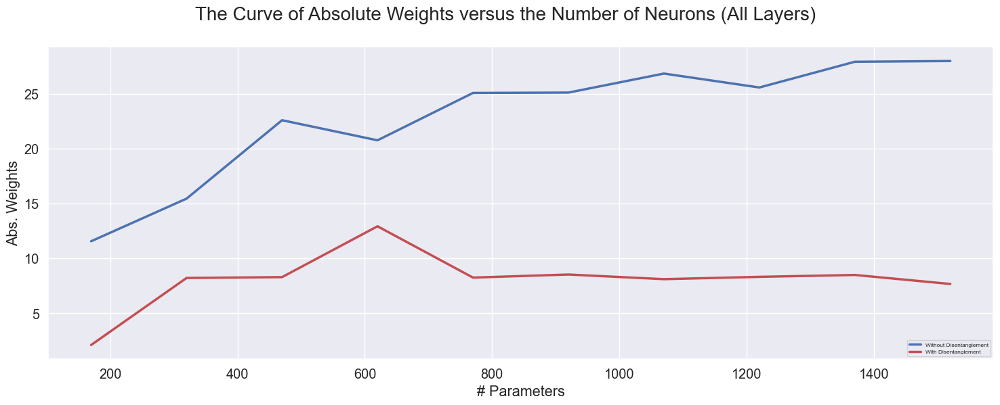

In [25]:
neurons_without_disentanglement = np.zeros(10)
neurons_with_disentanglement = np.zeros(10)

abs_weights_without_disentanglement = np.zeros(10)
abs_weights_with_disentanglement = np.zeros(10)

for i in range(10):
    for j in range(12):
        abs_weights_without_disentanglement[i] = abs_weights_without_disentanglement[i] + np.sum(np.power(weights_without_disentanglement[i][j], 2))  
        abs_weights_with_disentanglement[i] = abs_weights_with_disentanglement[i] + np.sum(np.power(weights_with_disentanglement[i][j], 2))
                                                                                                   
    abs_weights_without_disentanglement[i] = np.power(abs_weights_without_disentanglement[i], 0.5)
    abs_weights_with_disentanglement[i] = np.power(abs_weights_with_disentanglement[i], 0.5)
    
for i in range(10):
    for j in range(1, 6):
        neurons_without_disentanglement[i] = neurons_without_disentanglement[i] + len(weights_without_disentanglement[i][j])
        neurons_with_disentanglement[i] = neurons_with_disentanglement[i] + len(weights_with_disentanglement[i][j])
        
fig, axs = plt.subplots(1, 1, figsize = (18, 6))
fig.suptitle('The Curve of Absolute Weights versus the Number of Neurons (All Layers)', fontsize = 20)

ax = axs

ax.set_xlabel('# Parameters')
ax.set_ylabel('Abs. Weights')

ax.plot(neurons_without_disentanglement, abs_weights_without_disentanglement, "-b", label = "Without Disentanglement")
ax.plot(neurons_with_disentanglement, abs_weights_with_disentanglement, "-r", label = "With Disentanglement")

ax.legend(loc = 'lower right', fontsize = 'medium')

fig.savefig('Figures/Subspace_Net/The Curve of Absolute Weights versus the Number of Neurons_All Layers_Linear_6.png', dpi=300, bbox_inches='tight')

### 2.2.4 Geometry Function (Method 1) <a class="anchor" id="section_2_2_4"></a>

In [26]:
P = 30

def compute_geometry(manifolds):
    # Radius, centers, subspaces
    Rs = []
    centers = []
    Us = []
    
    for manifold in tqdm(manifolds, leave=False):
        center = manifold.mean(0)
        centers.append(center)
        _, R, U = np.linalg.svd(manifold - center)
        Rs.append(R[:P])
        Us.append(U[:P])
    
    Rs = np.stack(Rs)
    centers = np.stack(centers)
    Us = np.stack(Us)
    
    # Overlaps
    K = len(manifolds)
    ss = []
    csa = []
    csb = []
    
    for a in tqdm(range(K), leave = False):
        for b in range(K):
            if a != b:
                # Center-subspace
                dx0 = centers[a] - centers[b]
                dx0hat = dx0 / np.linalg.norm(dx0)
                costheta_a = Us[a] @ dx0hat
                csa.append((costheta_a ** 2 * Rs[a] ** 2).sum() / (Rs[a] ** 2).sum())
                costheta_b = Us[b] @ dx0hat
                csb.append((costheta_b ** 2 * Rs[b] ** 2).sum() / (Rs[a] ** 2).sum())

                # Subspace-subspace
                cosphi = Us[a] @ Us[b].T
                ss_overlap = (cosphi ** 2 * Rs[a][:, None] ** 2 * Rs[b] ** 2).sum() / (Rs[a] ** 2).sum() ** 2
                ss.append(ss_overlap)
            
            else:
                csa.append(np.nan)
                csb.append(np.nan)
                ss.append(np.nan)
                
    csa = np.stack(csa).reshape(K, K)
    csb = np.stack(csb).reshape(K, K)
    ss = np.stack(ss).reshape(K, K)
    
    return Rs, Us, centers, csa, csb, ss

### 2.2.5 Building Manifolds and Calculating the Dimensionality (Method 1) <a class="anchor" id="section_2_2_5"></a>

In [27]:
import copy


for i in range(10):
    inputs_labels_without_disentanglement = np.zeros((1000, len(inputs_without_disentanglement[i][0])))
    inputs_labels_with_disentanglement = np.zeros((1000, len(inputs_without_disentanglement[i][0])))

    for j in range(1000):
        for k in range(len(inputs_without_disentanglement[i][j])):
            inputs_labels_without_disentanglement[j][k] = np.round(10 * inputs_without_disentanglement[i][j][k][0])
            inputs_labels_with_disentanglement[j][k] = np.round(10 * inputs_with_disentanglement[i][j][k][0])
            
    images_labels_without_disentanglement = []
    images_labels_with_disentanglement = []
    
    for j in range(-10, 10):
        images_labels_without_disentanglement_temp = []
        images_labels_with_disentanglement_temp = []
        
        for k in range(1000):
            for l in range(len(inputs_without_disentanglement[i][j])):
                if inputs_labels_without_disentanglement[k][l] == j:
                    images_labels_without_disentanglement_temp.append(images_without_disentanglement[i][k][l])
                    
                if inputs_labels_with_disentanglement[k][l] == j: 
                    images_labels_with_disentanglement_temp.append(images_with_disentanglement[i][k][l])
        
        images_labels_without_disentanglement.append(images_labels_without_disentanglement_temp)
        images_labels_with_disentanglement.append(images_labels_with_disentanglement_temp)
    
    training_manifolds_without_disentanglement_1 = []
    training_manifolds_without_disentanglement_2 = []
    training_manifolds_without_disentanglement_3 = []
    training_manifolds_without_disentanglement_4 = []
    training_manifolds_without_disentanglement_5 = []
    
    for j in range(len(images_labels_without_disentanglement)):
        training_manifolds_without_disentanglement_1_temp = []
        training_manifolds_without_disentanglement_2_temp = []
        training_manifolds_without_disentanglement_3_temp = []
        training_manifolds_without_disentanglement_4_temp = []
        training_manifolds_without_disentanglement_5_temp = []
    
        for k in range(len(images_labels_without_disentanglement[j])):      
            training_manifold_1 = images_labels_without_disentanglement[j][k]           
            
            for l in range(5):
                training_manifold_2 = 0
                
                for m in range(len(weights_without_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_without_disentanglement[i][l][m] + weights_without_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_without_disentanglement_1_temp.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_without_disentanglement_2_temp.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_without_disentanglement_3_temp.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_without_disentanglement_4_temp.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_without_disentanglement_5_temp.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
        
        if len(images_labels_without_disentanglement[j]) >= 30:
            training_manifolds_without_disentanglement_1.append(np.array(training_manifolds_without_disentanglement_1_temp)[:30])
            training_manifolds_without_disentanglement_2.append(np.array(training_manifolds_without_disentanglement_2_temp)[:30])
            training_manifolds_without_disentanglement_3.append(np.array(training_manifolds_without_disentanglement_3_temp)[:30])
            training_manifolds_without_disentanglement_4.append(np.array(training_manifolds_without_disentanglement_4_temp)[:30])
            training_manifolds_without_disentanglement_5.append(np.array(training_manifolds_without_disentanglement_5_temp)[:30])
        
    training_manifolds_with_disentanglement_1 = []
    training_manifolds_with_disentanglement_2 = []
    training_manifolds_with_disentanglement_3 = []
    training_manifolds_with_disentanglement_4 = []
    training_manifolds_with_disentanglement_5 = []
    
    for j in range(len(images_labels_with_disentanglement)):
        training_manifolds_with_disentanglement_1_temp = []
        training_manifolds_with_disentanglement_2_temp = []
        training_manifolds_with_disentanglement_3_temp = []
        training_manifolds_with_disentanglement_4_temp = []
        training_manifolds_with_disentanglement_5_temp = []
    
        for k in range(len(images_labels_with_disentanglement[j])):            
            training_manifold_1 = images_labels_with_disentanglement[j][k]           
            
            for l in range(5):
                training_manifold_2 = 0 
                
                for m in range(len(weights_with_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_with_disentanglement[i][l][m] + weights_with_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_with_disentanglement_1_temp.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_with_disentanglement_2_temp.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_with_disentanglement_3_temp.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_with_disentanglement_4_temp.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_with_disentanglement_5_temp.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
                
        if len(images_labels_with_disentanglement[j]) >= 30:
            training_manifolds_with_disentanglement_1.append(np.array(training_manifolds_with_disentanglement_1_temp)[:30])
            training_manifolds_with_disentanglement_2.append(np.array(training_manifolds_with_disentanglement_2_temp)[:30])
            training_manifolds_with_disentanglement_3.append(np.array(training_manifolds_with_disentanglement_3_temp)[:30])
            training_manifolds_with_disentanglement_4.append(np.array(training_manifolds_with_disentanglement_4_temp)[:30])
            training_manifolds_with_disentanglement_5.append(np.array(training_manifolds_with_disentanglement_5_temp)[:30])
            
    for j in range(len(training_manifolds_without_disentanglement_1)):
        training_manifolds_without_disentanglement_1[j] = training_manifolds_without_disentanglement_1[j].T
        training_manifolds_without_disentanglement_2[j] = training_manifolds_without_disentanglement_2[j].T
        training_manifolds_without_disentanglement_3[j] = training_manifolds_without_disentanglement_3[j].T
        training_manifolds_without_disentanglement_4[j] = training_manifolds_without_disentanglement_4[j].T
        training_manifolds_without_disentanglement_5[j] = training_manifolds_without_disentanglement_5[j].T
    
    training_manifolds_without_disentanglement_1 = np.array(training_manifolds_without_disentanglement_1)
    training_manifolds_without_disentanglement_2 = np.array(training_manifolds_without_disentanglement_2)
    training_manifolds_without_disentanglement_3 = np.array(training_manifolds_without_disentanglement_3)
    training_manifolds_without_disentanglement_4 = np.array(training_manifolds_without_disentanglement_4)
    training_manifolds_without_disentanglement_5 = np.array(training_manifolds_without_disentanglement_5)

    for j in range(len(training_manifolds_with_disentanglement_1)):
        training_manifolds_with_disentanglement_1[j] = training_manifolds_with_disentanglement_1[j].T
        training_manifolds_with_disentanglement_2[j] = training_manifolds_with_disentanglement_2[j].T
        training_manifolds_with_disentanglement_3[j] = training_manifolds_with_disentanglement_3[j].T
        training_manifolds_with_disentanglement_4[j] = training_manifolds_with_disentanglement_4[j].T
        training_manifolds_with_disentanglement_5[j] = training_manifolds_with_disentanglement_5[j].T
    
    training_manifolds_with_disentanglement_1 = np.array(training_manifolds_with_disentanglement_1)
    training_manifolds_with_disentanglement_2 = np.array(training_manifolds_with_disentanglement_2)
    training_manifolds_with_disentanglement_3 = np.array(training_manifolds_with_disentanglement_3)
    training_manifolds_with_disentanglement_4 = np.array(training_manifolds_with_disentanglement_4)
    training_manifolds_with_disentanglement_5 = np.array(training_manifolds_with_disentanglement_5)
    
    training_manifolds_without_disentanglement_final = []
    training_manifolds_with_disentanglement_final = []

    training_manifolds_without_disentanglement_final.append(training_manifolds_without_disentanglement_1)
    training_manifolds_without_disentanglement_final.append(training_manifolds_without_disentanglement_2)
    training_manifolds_without_disentanglement_final.append(training_manifolds_without_disentanglement_3)
    training_manifolds_without_disentanglement_final.append(training_manifolds_without_disentanglement_4)
    training_manifolds_without_disentanglement_final.append(training_manifolds_without_disentanglement_5)

    training_manifolds_with_disentanglement_final.append(training_manifolds_with_disentanglement_1)
    training_manifolds_with_disentanglement_final.append(training_manifolds_with_disentanglement_2)
    training_manifolds_with_disentanglement_final.append(training_manifolds_with_disentanglement_3)
    training_manifolds_with_disentanglement_final.append(training_manifolds_with_disentanglement_4)
    training_manifolds_with_disentanglement_final.append(training_manifolds_with_disentanglement_5)
    
    Rs_all_without_disentanglement = []
    Us_all_without_disentanglement = [] 
    centers_all_without_disentanglement = []
    csa_all_without_disentanglement = []
    csb_all_without_disentanglement = []
    ss_all_without_disentanglement = []
        
    for j in range(5):
        manifolds = training_manifolds_without_disentanglement_final[j]
        Rs, Us, centers, csa, csb, ss = compute_geometry(manifolds)
            
        Rs_all_without_disentanglement.append(Rs)
        Us_all_without_disentanglement.append(Us)
        centers_all_without_disentanglement.append(centers)
        csa_all_without_disentanglement.append(csa)
        csb_all_without_disentanglement.append(csb)
        ss_all_without_disentanglement.append(ss)
    
    Rs_all_without_disentanglement = np.stack(Rs_all_without_disentanglement)
    Ds_without_disentanglement = (Rs_all_without_disentanglement ** 2).sum(-1) ** 2 / (Rs_all_without_disentanglement ** 4).sum(-1)              

    scipy.io.savemat('Figures/Subspace_Net/Ds_without_disentanglement_deep_linear_factor_6_method1_' + str(i) + '.mat', mdict = {'Ds': Ds_without_disentanglement})
        
    Rs_all_with_disentanglement = []
    Us_all_with_disentanglement = [] 
    centers_all_with_disentanglement = []
    csa_all_with_disentanglement = []
    csb_all_with_disentanglement = []
    ss_all_with_disentanglement = []
        
    for j in range(5):
        manifolds = training_manifolds_with_disentanglement_final[j]
        Rs, Us, centers, csa, csb, ss = compute_geometry(manifolds)
            
        Rs_all_with_disentanglement.append(Rs)
        Us_all_with_disentanglement.append(Us)
        centers_all_with_disentanglement.append(centers)
        csa_all_with_disentanglement.append(csa)
        csb_all_with_disentanglement.append(csb)
        ss_all_with_disentanglement.append(ss)
    
    Rs_all_with_disentanglement = np.stack(Rs_all_with_disentanglement)
    Ds_with_disentanglement = (Rs_all_with_disentanglement ** 2).sum(-1) ** 2 / (Rs_all_with_disentanglement ** 4).sum(-1)              

    scipy.io.savemat('Figures/Subspace_Net/Ds_with_disentanglement_deep_linear_factor_6_method1_' + str(i) + '.mat', mdict = {'Ds': Ds_with_disentanglement})

C:\Users\Lion\AppData\Local\Temp\ipykernel_4932\114023685.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for manifold in tqdm(manifolds, leave=False):


  0%|          | 0/14 [00:00<?, ?it/s]

C:\Users\Lion\AppData\Local\Temp\ipykernel_4932\114023685.py:26: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for a in tqdm(range(K), leave = False):


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

C:\Users\Lion\AppData\Local\Temp\ipykernel_4932\114023685.py:31: RuntimeWarning: invalid value encountered in divide
  dx0hat = dx0 / np.linalg.norm(dx0)


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

### 2.2.6 Plotting the Dimensionality across Layers (Method 1) <a class="anchor" id="section_2_2_6"></a>

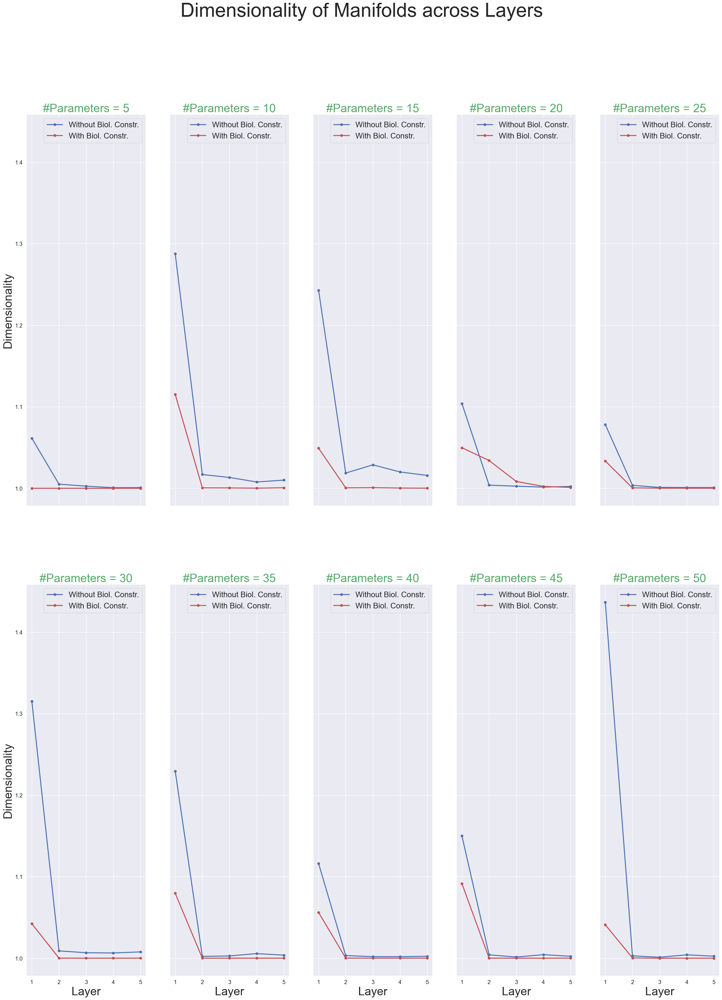

In [28]:
fig, axs = plt.subplots(2, 5, figsize = (2 * 16, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('Dimensionality of Manifolds across Layers', fontsize = 50)

parameters = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

for i in range(10):
    if i < 5:
        ax = axs[0, i]
    elif i >= 5:
        ax = axs[1, i - 5]
        ax.set_xlabel('Layer', fontsize = 30)
        
    if i == 0 or i == 5:
        ax.set_ylabel('Dimensionality', fontsize = 30)
        
    ax.set_title('#Parameters = ' + str(parameters[i]), fontsize = 30, color = 'g')
    
    Ds_without_disentanglement = scipy.io.loadmat('Figures/Subspace_Net/Ds_without_disentanglement_deep_linear_factor_6_method1_' + str(i) + '.mat')['Ds']
    Ds_with_disentanglement = scipy.io.loadmat('Figures/Subspace_Net/Ds_with_disentanglement_deep_linear_factor_6_method1_' + str(i) + '.mat')['Ds']

    ax.plot(range(1, 6), Ds_without_disentanglement.mean(-1), "-ob", label = "Without Biol. Constr.")
    ax.plot(range(1, 6), Ds_with_disentanglement.mean(-1), "-or", label = "With Biol. Constr.")
    
    ax.legend(loc = 'upper right', fontsize = 20)
                        
fig.savefig('Figures/Subspace_Net/Dimensionality of Manifolds across Layers_Linear_6_Method1.png')

### 2.2.7 Geometry Function (Method 2) <a class="anchor" id="section_2_2_7"></a>

In [29]:
import numpy as np
from scipy.stats import pearsonr
from sklearn import linear_model

                     
def intrinsic_dimension(X, fraction = 0.9, verbose = False):    
    """
        Estimates the intrinsic dimension of a system of points from the matrix of their distances X
        
        Args:
        X: 2-D Matrix X (n, n) where n is the number of points
        fraction: fraction of the data considered for the dimensionality estimation (default: fraction = 0.9)
        
        Returns:            
        x: log(mu)    (*)
        y: - (1 - F(mu)) (*)
        reg: linear regression y ~ x structure obtained with scipy.stats.linregress
        (reg.slope is the intrinsic dimension estimate)
        r: determination coefficient of y ~ x
        pval: p-value of y ~ x
            
        (*) See cited paper for description
        
        Usage:
        _, _, reg, r, pval = estimate(X, fraction = 0.85)
            
        The technique is described in:          
        "Estimating the intrinsic dimension of datasets by a minimal neighborhood information"       
        Authors: Elena Facco, Maria d’Errico, Alex Rodriguez & Alessandro Laio        
        Scientific Reports 7, Article number: 12140 (2017)
        doi:10.1038/s41598-017-11873-y  
    """             
     
    # Sort distance matrix
    Y = np.sort(X, axis = 1, kind = 'quicksort')

    # Clean data
    k1 = Y[:, 1]
    k2 = Y[:, 2]

    zeros = np.where(k1 == 0)[0]
    
    if verbose:
        print('Found n. {} elements for which r1 = 0'.format(zeros.shape[0]))
        print(zeros)

    degeneracies = np.where(k1 == k2)[0]
    
    if verbose:
        print('Found n. {} elements for which r1 = r2'.format(degeneracies.shape[0]))
        print(degeneracies)

    good = np.setdiff1d(np.arange(Y.shape[0]), np.array(zeros))
    good = np.setdiff1d(good, np.array(degeneracies))
    
    if verbose:
        print('Fraction good points: {}'.format(good.shape[0] / Y.shape[0]))
    
    k1 = k1[good]
    k2 = k2[good]    
    
    # Number of points to consider for the linear regression
    npoints = int(np.floor(good.shape[0] * fraction))

    # Define mu and Femp
    N = good.shape[0]
    mu = np.sort(np.divide(k2, k1), axis = None, kind = 'quicksort')
    Femp = (np.arange(1, N + 1, dtype = np.float64)) / N
    
    # Take logs (leave out the last element because 1 - Femp is zero there)
    x = np.log(mu[:-2])
    y = - np.log(1 - Femp[:-2])

    # Regression
    regr = linear_model.LinearRegression(fit_intercept = False)
    
    if x.shape[0] > 0:
        regr.fit(x[0:npoints, np.newaxis], y[0:npoints, np.newaxis]) 
        r, pval = pearsonr(x[0:npoints], y[0:npoints])        
        return x, y, regr.coef_[0][0], r, pval 
    
    elif x.shape[0] == 0:
        return x, y, 0.0, 0.0, 0.0

### 2.2.8 Building Manifolds and Calculating the Dimensionality (Method 2) <a class="anchor" id="section_2_2_8"></a>

In [30]:
import copy
from scipy.spatial.distance import pdist, squareform


for i in range(10):
    training_manifolds_without_disentanglement_1 = []
    training_manifolds_without_disentanglement_2 = []
    training_manifolds_without_disentanglement_3 = []
    training_manifolds_without_disentanglement_4 = []
    training_manifolds_without_disentanglement_5 = []
    
    for j in range(10):
        for k in range(len(images_without_disentanglement[i][j])):

            training_manifold_1 = images_without_disentanglement[i][j][k]           
            
            for l in range(5):
                training_manifold_2 = 0
                
                for m in range(len(weights_without_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_without_disentanglement[i][l][m] + weights_without_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_without_disentanglement_1.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_without_disentanglement_2.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_without_disentanglement_3.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_without_disentanglement_4.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_without_disentanglement_5.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
                
    training_manifolds_with_disentanglement_1 = []
    training_manifolds_with_disentanglement_2 = []
    training_manifolds_with_disentanglement_3 = []
    training_manifolds_with_disentanglement_4 = []
    training_manifolds_with_disentanglement_5 = []
    
    for j in range(10):
        for k in range(len(images_with_disentanglement[i][j])):

            training_manifold_1 = images_with_disentanglement[i][j][k]           
            
            for l in range(5):
                training_manifold_2 = 0
                
                for m in range(len(weights_with_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_with_disentanglement[i][l][m] + weights_with_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_with_disentanglement_1.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_with_disentanglement_2.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_with_disentanglement_3.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_with_disentanglement_4.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_with_disentanglement_5.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
    
    training_manifolds_without_disentanglement_1_final = np.array(training_manifolds_without_disentanglement_1)
    training_manifolds_without_disentanglement_2_final = np.array(training_manifolds_without_disentanglement_2)
    training_manifolds_without_disentanglement_3_final = np.array(training_manifolds_without_disentanglement_3)
    training_manifolds_without_disentanglement_4_final = np.array(training_manifolds_without_disentanglement_4)
    training_manifolds_without_disentanglement_5_final = np.array(training_manifolds_without_disentanglement_5)
    
    training_manifolds_with_disentanglement_1_final = np.array(training_manifolds_with_disentanglement_1)
    training_manifolds_with_disentanglement_2_final = np.array(training_manifolds_with_disentanglement_2)
    training_manifolds_with_disentanglement_3_final = np.array(training_manifolds_with_disentanglement_3)
    training_manifolds_with_disentanglement_4_final = np.array(training_manifolds_with_disentanglement_4)
    training_manifolds_with_disentanglement_5_final = np.array(training_manifolds_with_disentanglement_5)
                    
    intrinsic_dimension_without_disentanglement = []
    intrinsic_dimension_with_disentanglement = [] 
    
    intrinsic_dimension_without_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_without_disentanglement_1_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_without_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_without_disentanglement_2_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_without_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_without_disentanglement_3_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_without_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_without_disentanglement_4_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_without_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_without_disentanglement_5_final), 'euclidean'), fraction = 1.0)[2])
    
    intrinsic_dimension_without_disentanglement = np.array(intrinsic_dimension_without_disentanglement)
    
    scipy.io.savemat('Figures/Subspace_Net/Ds_without_disentanglement_deep_linear_factor_6_method2_' + str(i) + '.mat', mdict = {'Ds': intrinsic_dimension_without_disentanglement})
    
    intrinsic_dimension_with_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_with_disentanglement_1_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_with_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_with_disentanglement_2_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_with_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_with_disentanglement_3_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_with_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_with_disentanglement_4_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_with_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_with_disentanglement_5_final), 'euclidean'), fraction = 1.0)[2])
    
    intrinsic_dimension_with_disentanglement = np.array(intrinsic_dimension_with_disentanglement)
    
    scipy.io.savemat('Figures/Subspace_Net/Ds_with_disentanglement_deep_linear_factor_6_method2_' + str(i) + '.mat', mdict = {'Ds': intrinsic_dimension_with_disentanglement})

### 2.2.9 Plotting the Dimensionality across Layers (Method 2) <a class="anchor" id="section_2_2_9"></a>

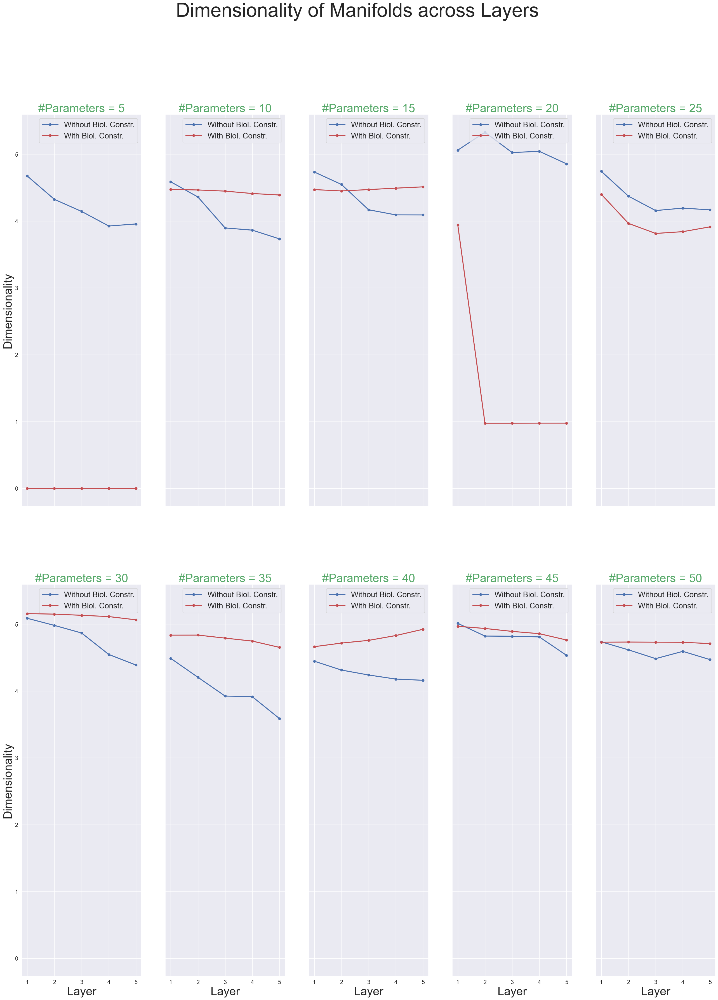

In [31]:
fig, axs = plt.subplots(2, 5, figsize = (2 * 16, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('Dimensionality of Manifolds across Layers', fontsize = 50)

parameters = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

for i in range(10):
    if i < 5:
        ax = axs[0, i]
    elif i >= 5:
        ax = axs[1, i - 5]
        ax.set_xlabel('Layer', fontsize = 30)
        
    if i == 0 or i == 5:
        ax.set_ylabel('Dimensionality', fontsize = 30)
        
    ax.set_title('#Parameters = ' + str(parameters[i]), fontsize = 30, color = 'g')
    
    Ds_without_disentanglement = scipy.io.loadmat('Figures/Subspace_Net/Ds_without_disentanglement_deep_linear_factor_6_method2_' + str(i) + '.mat')['Ds']
    Ds_with_disentanglement = scipy.io.loadmat('Figures/Subspace_Net/Ds_with_disentanglement_deep_linear_factor_6_method2_' + str(i) + '.mat')['Ds']

    ax.plot(range(1, 6), Ds_without_disentanglement.squeeze(0), "-ob", label = "Without Biol. Constr.")
    ax.plot(range(1, 6), Ds_with_disentanglement.squeeze(0), "-or", label = "With Biol. Constr.")
    
    ax.legend(loc = 'upper right', fontsize = 20)
                        
fig.savefig('Figures/Subspace_Net/Dimensionality of Manifolds across Layers_Linear_6_Method2.png')

### 2.2.10 Functions for Computing Sample Efficient Learning Curves <a class="anchor" id="section_2_2_10"></a>

In [32]:
from cycler import cycler
import matplotlib as mpl
import pdb
import scipy as sp
import scipy.io
import scipy.optimize
from scipy.sparse.linalg import eigsh
import scipy.stats as stats
import skimage
from skimage import filters as filt
from skimage import transform
from sklearn.decomposition import PCA
import time

mpl.rcParams['axes.prop_cycle'] = cycler(color = 'bgrcmyk')

# import decoder
myfont = 6
myaxis_font = 8
plt.rcParams.update({'font.size': myfont})
line_width = 1


def f(z, *args):
    p, spectrum, lamb = args
    
    return z - lamb - z * np.sum(spectrum / (p * spectrum + z))


def fp(z, *args):
    p, spectrum, lamb = args
    
    return 1 - np.sum( spectrum / (p * spectrum + z)) + np.sum(spectrum / (p * spectrum + z) ** 2)


def solve_implicit(pvals, spectrum, lamb):
    zvals = np.zeros(len(pvals))
    
    for i, p in enumerate(pvals):
        args = (p, spectrum, lamb)
        zvals[i] = sp.optimize.root_scalar(f = f, method = 'newton', fprime = fp, x0 = 2 * np.sum(spectrum) + 2 * lamb, args = args).root
    
    return zvals


def gamma_fn(pvals, zvals, spectrum):
    all_vals = np.zeros(len(pvals))
    
    for i, p in enumerate(pvals):
        all_vals[i] = p * np.sum(spectrum ** 2 / (spectrum * p + zvals[i]) ** 2)
    
    return all_vals


def mode_errs(pvals, spectrum, teacher, lamb):
    zvals = solve_implicit(pvals, spectrum, lamb)
    gamma = gamma_fn(pvals, zvals, spectrum)
    err = np.zeros((len(spectrum), len(pvals)))
    
    for j in range(len(spectrum)):    
        lamb_j = spectrum[j]
        teacher_weights_j = teacher[j]
        err[j, :] = zvals ** 2 / (1 - gamma) * teacher_weights_j / (lamb_j * pvals + zvals) ** 2
        
        # if j == len(spectrum) - 1:
            # plt.loglog(pvals[0:10], err[0:10])
            # plt.show()
    
    return err


def sorted_spectral_decomp(resp, imgs = None):
    K = 1 / resp.shape[1] * resp @ resp.T
    s, v = np.linalg.eigh(K)
    indsort = np.argsort(s)[::-1]
    s = s[indsort]
    v = v[:, indsort]
    
    return K, s, v


def compute_learning_curves(K, y, pvals, lamb):
    # coeffs = 1 / K.shape[0] * (u.T @ y) ** 2
    # theory_lc = mode_errs(pvals, s, coeffs, lamb).sum(axis = 0)
    
    num_repeats = 5
    err_expt = np.zeros((len(pvals), num_repeats))
    
    for n in range(num_repeats):
        for i, p in enumerate(pvals):
            inds = np.random.choice(K.shape[0], p, replace = True)
            # test_i = permed[p:permed.shape[0]]
            
            Ki = K[inds, :]
            Kii = Ki[:, inds]
            # K_test = Ki[:, test_i]
            
            print(Ki.shape)
            yi = y[inds, :]
            yhat = Ki.T @ np.linalg.solve(Kii + 1 / K.shape[0] * lamb * np.eye(p), yi)
            err_expt[i, n] = np.sum((y - yhat) ** 2)
    
    return err_expt, yhat


def get_all_task_info(resp, y, pvals, ptheory):
    # K = 1 / resp.shape[1] * resp @ resp.T
    K, s, vec = sorted_spectral_decomp(resp)
    lamb = np.trace(K)
    teacher = np.sum((vec.T @ y) ** 2, axis = 1)
    err_expt, yhat = compute_learning_curves(K, y, pvals, lamb)
    theory = mode_errs(ptheory, s, teacher, lamb)
    
    return err_expt, theory, s, teacher, yhat

### 2.2.11 Calculating of Sample Efficient Learning Curves <a class="anchor" id="section_2_2_11"></a>

In [33]:
import copy


for i in range(10):
    training_manifolds_without_disentanglement_0 = []
    training_manifolds_without_disentanglement_1 = []
    training_manifolds_without_disentanglement_2 = []
    training_manifolds_without_disentanglement_3 = []
    training_manifolds_without_disentanglement_4 = []
    training_manifolds_without_disentanglement_5 = []
    
    for j in range(10):
        for k in range(len(images_without_disentanglement[i][j])):
            training_manifolds_without_disentanglement_0.append(images_without_disentanglement[i][j][k])
            training_manifold_1 = images_without_disentanglement[i][j][k]           
            
            for l in range(5):
                training_manifold_2 = 0
                
                for m in range(len(weights_without_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_without_disentanglement[i][l][m] + weights_without_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_without_disentanglement_1.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_without_disentanglement_2.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_without_disentanglement_3.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_without_disentanglement_4.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_without_disentanglement_5.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
                
    training_manifolds_with_disentanglement_0 = []
    training_manifolds_with_disentanglement_1 = []
    training_manifolds_with_disentanglement_2 = []
    training_manifolds_with_disentanglement_3 = []
    training_manifolds_with_disentanglement_4 = []
    training_manifolds_with_disentanglement_5 = []
    
    for j in range(10):
        for k in range(len(images_with_disentanglement[i][j])):
            training_manifolds_with_disentanglement_0.append(images_with_disentanglement[i][j][k])
            training_manifold_1 = images_with_disentanglement[i][j][k]           
            
            for l in range(5):
                training_manifold_2 = 0
                
                for m in range(len(weights_with_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_with_disentanglement[i][l][m] + weights_with_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_with_disentanglement_1.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_with_disentanglement_2.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_with_disentanglement_3.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_with_disentanglement_4.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_with_disentanglement_5.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
    
    training_manifolds_without_disentanglement_0_final = np.array(training_manifolds_without_disentanglement_0)
    training_manifolds_without_disentanglement_1_final = np.array(training_manifolds_without_disentanglement_1)
    training_manifolds_without_disentanglement_2_final = np.array(training_manifolds_without_disentanglement_2)
    training_manifolds_without_disentanglement_3_final = np.array(training_manifolds_without_disentanglement_3)
    training_manifolds_without_disentanglement_4_final = np.array(training_manifolds_without_disentanglement_4)
    training_manifolds_without_disentanglement_5_final = np.array(training_manifolds_without_disentanglement_5)
    
    training_manifolds_with_disentanglement_0_final = np.array(training_manifolds_with_disentanglement_0)
    training_manifolds_with_disentanglement_1_final = np.array(training_manifolds_with_disentanglement_1)
    training_manifolds_with_disentanglement_2_final = np.array(training_manifolds_with_disentanglement_2)
    training_manifolds_with_disentanglement_3_final = np.array(training_manifolds_with_disentanglement_3)
    training_manifolds_with_disentanglement_4_final = np.array(training_manifolds_with_disentanglement_4)
    training_manifolds_with_disentanglement_5_final = np.array(training_manifolds_with_disentanglement_5)
    
    all_err_layers_without_disentanglement = []
    all_theory_layers_without_disentanglement = []
    all_vk_layers_without_disentanglement = []
    
    for j in range(5):
        y_fourier = training_manifolds_without_disentanglement_0_final / np.sqrt(np.sum(training_manifolds_without_disentanglement_0_final ** 2))
            
        pvals = np.logspace(0, 3.0, 8).astype('int')
        ptheory = np.logspace(0, 3.5, 40)
        
        if j == 0:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_without_disentanglement_1_final, y_fourier, pvals, ptheory)
        elif j == 1:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_without_disentanglement_2_final, y_fourier, pvals, ptheory)
        elif j == 2:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_without_disentanglement_3_final, y_fourier, pvals, ptheory)
        elif j == 3:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_without_disentanglement_4_final, y_fourier, pvals, ptheory)
        elif j == 4:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_without_disentanglement_5_final, y_fourier, pvals, ptheory)
        
        all_err_layers_without_disentanglement += [err]
        all_theory_layers_without_disentanglement += [theory]
        all_vk_layers_without_disentanglement += [vk]
            
    scipy.io.savemat('Figures/Subspace_Net/pvals.mat', mdict = {'pvals': pvals})
    scipy.io.savemat('Figures/Subspace_Net/ptheory.mat', mdict = {'ptheory': ptheory})
            
    scipy.io.savemat('Figures/Subspace_Net/all_err_layers_without_disentanglement_linear_6_' + str(i) + '.mat', mdict = {'err': all_err_layers_without_disentanglement})
    scipy.io.savemat('Figures/Subspace_Net/all_theory_layers_without_disentanglement_linear_6_' + str(i) + '.mat', mdict = {'theory': all_theory_layers_without_disentanglement})  
    scipy.io.savemat('Figures/Subspace_Net/all_vk_layers_without_disentanglement_linear_6_' + str(i) + '.mat', mdict = {'vk': all_vk_layers_without_disentanglement})
    
    all_err_layers_with_disentanglement = []
    all_theory_layers_with_disentanglement = []
    all_vk_layers_with_disentanglement = []
    
    for j in range(5):
        y_fourier = training_manifolds_with_disentanglement_0_final / np.sqrt(np.sum(training_manifolds_with_disentanglement_0_final ** 2))
            
        pvals = np.logspace(0, 3.0, 8).astype('int')
        ptheory = np.logspace(0, 3.5, 40)
        
        if j == 0:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_with_disentanglement_1_final, y_fourier, pvals, ptheory)
        elif j == 1:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_with_disentanglement_2_final, y_fourier, pvals, ptheory)
        elif j == 2:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_with_disentanglement_3_final, y_fourier, pvals, ptheory)
        elif j == 3:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_with_disentanglement_4_final, y_fourier, pvals, ptheory)
        elif j == 4:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_with_disentanglement_5_final, y_fourier, pvals, ptheory)
        
        all_err_layers_with_disentanglement += [err]
        all_theory_layers_with_disentanglement += [theory]
        all_vk_layers_with_disentanglement += [vk]
            
    scipy.io.savemat('Figures/Subspace_Net/pvals.mat', mdict = {'pvals': pvals})
    scipy.io.savemat('Figures/Subspace_Net/ptheory.mat', mdict = {'ptheory': ptheory})
            
    scipy.io.savemat('Figures/Subspace_Net/all_err_layers_with_disentanglement_linear_6_' + str(i) + '.mat', mdict = {'err': all_err_layers_with_disentanglement})
    scipy.io.savemat('Figures/Subspace_Net/all_theory_layers_with_disentanglement_linear_6_' + str(i) + '.mat', mdict = {'theory': all_theory_layers_with_disentanglement})  
    scipy.io.savemat('Figures/Subspace_Net/all_vk_layers_with_disentanglement_linear_6_' + str(i) + '.mat', mdict = {'vk': all_vk_layers_with_disentanglement})

(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(

(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(

(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)


(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(

(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(

(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(

### 2.2.12 Plotting of Sample Efficient Learning Curves <a class="anchor" id="section_2_2_12"></a>

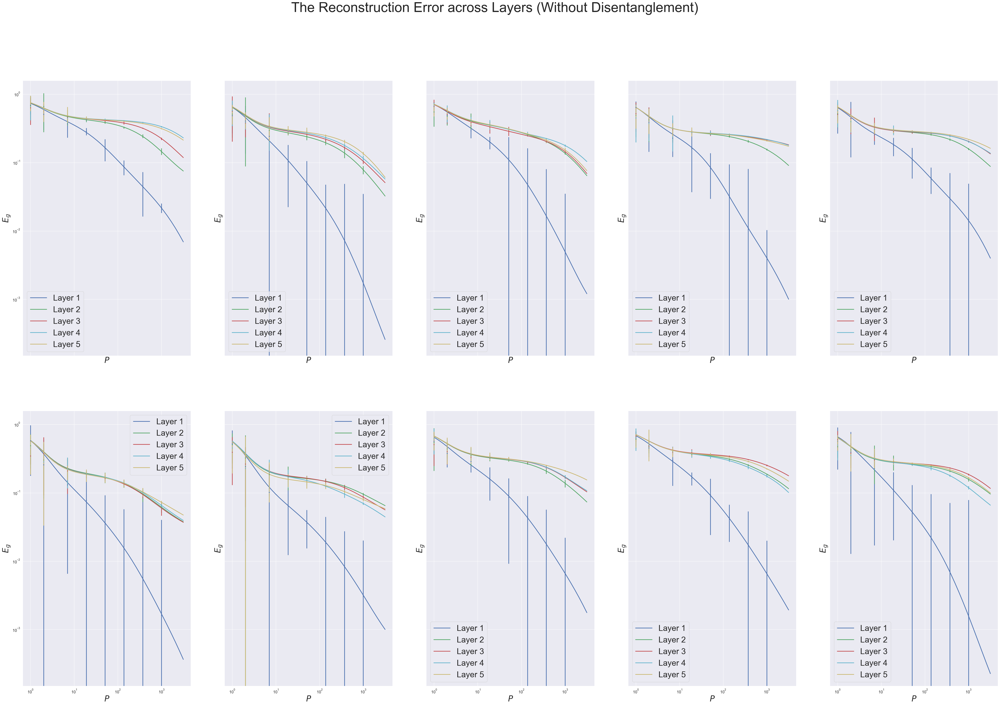

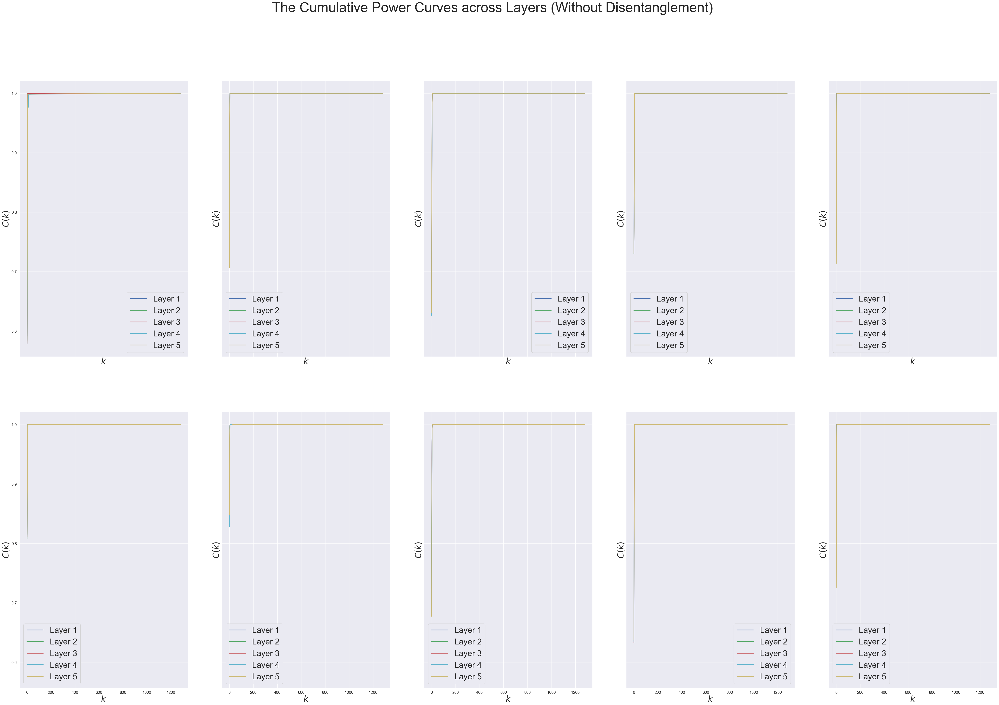

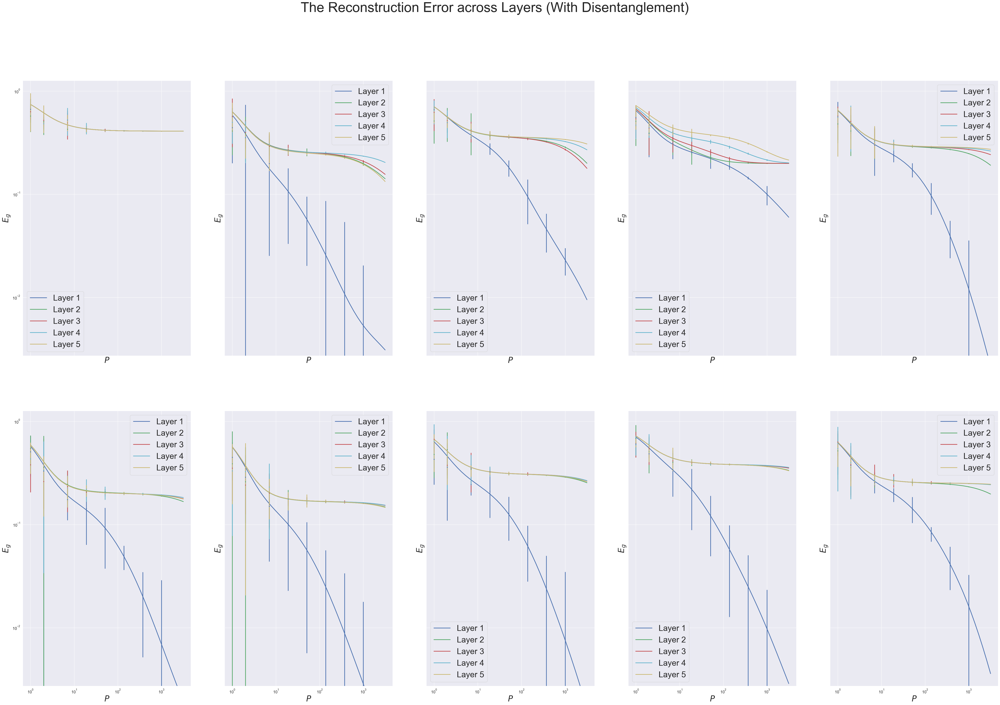

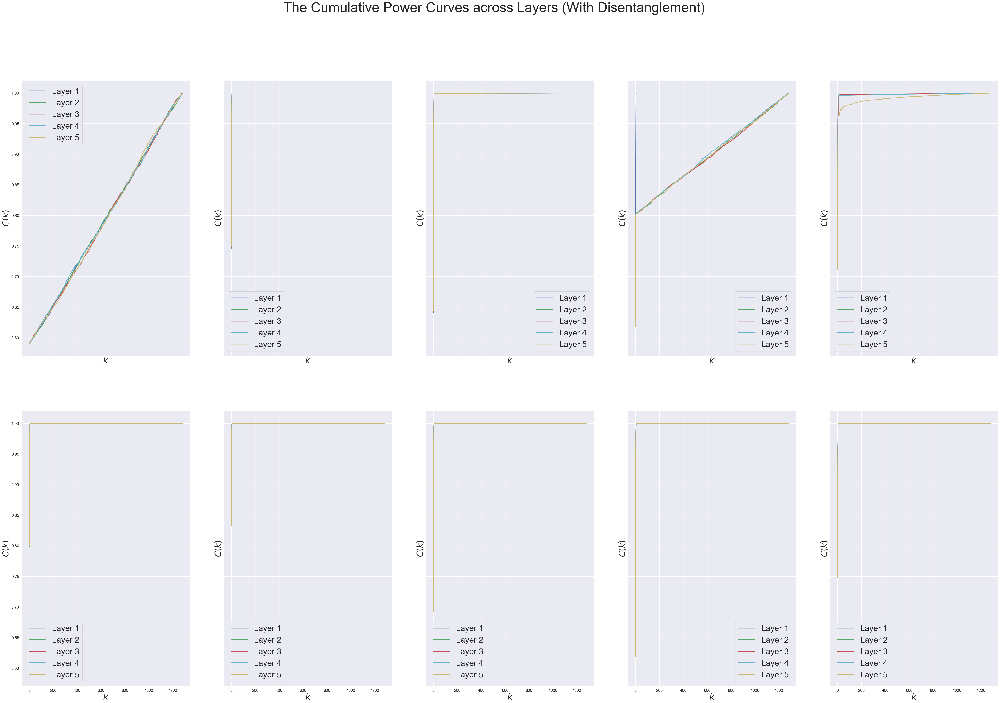

In [34]:
fig, axs = plt.subplots(2, 5, figsize = (2 * 32, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('The Reconstruction Error across Layers (Without Disentanglement)', fontsize = 50)

for i in range(10):            
    if i < 5:
        ax = axs[0, i]
    if i >= 5:
        ax = axs[1, i - 5]
        
    pvals = scipy.io.loadmat('Figures/Subspace_Net/pvals.mat')['pvals']
    ptheory = scipy.io.loadmat('Figures/Subspace_Net/ptheory.mat')['ptheory']
            
    err = scipy.io.loadmat('Figures/Subspace_Net/all_err_layers_without_disentanglement_linear_6_' + str(i) + '.mat')['err']
    theory = scipy.io.loadmat('Figures/Subspace_Net/all_theory_layers_without_disentanglement_linear_6_' + str(i) + '.mat')['theory'] 
    vk = scipy.io.loadmat('Figures/Subspace_Net/all_vk_layers_without_disentanglement_linear_6_' + str(i) + '.mat')['vk']
    
    color_array = ['b', 'g', 'r', 'c', 'y']
    label_array = ['Layer 1', 'Layer 2', 'Layer 3', 'Layer 4', 'Layer 5']
    
    for j in range(5):
        ax.loglog(ptheory.squeeze(0), theory[j].sum(axis = 0), color = color_array[j], label = label_array[j])
        ax.errorbar(pvals.squeeze(0), err[j].mean(axis = 1), err[j].std(axis = 1) / err[j].mean(axis = 1), fmt = 'o', markersize = 2.5, color = color_array[j])
            
    ax.legend(fontsize = 30)
    ax.set_xlabel(r'$P$', fontsize = 30)
    ax.set_ylabel(r'$E_g$', fontsize = 30)

fig.savefig('Figures/Subspace_Net/The Reconstruction Error across Layers (Without Disentanglement)_linear_6.png')

fig, axs = plt.subplots(2, 5, figsize = (2 * 32, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('The Cumulative Power Curves across Layers (Without Disentanglement)', fontsize = 50)

for i in range(10):            
    if i < 5:
        ax = axs[0, i]
    if i >= 5:
        ax = axs[1, i - 5]
        
    pvals = scipy.io.loadmat('Figures/Subspace_Net/pvals.mat')['pvals']
    ptheory = scipy.io.loadmat('Figures/Subspace_Net/ptheory.mat')['ptheory']
            
    err = scipy.io.loadmat('Figures/Subspace_Net/all_err_layers_without_disentanglement_linear_6_' + str(i) + '.mat')['err']
    theory = scipy.io.loadmat('Figures/Subspace_Net/all_theory_layers_without_disentanglement_linear_6_' + str(i) + '.mat')['theory'] 
    vk = scipy.io.loadmat('Figures/Subspace_Net/all_vk_layers_without_disentanglement_linear_6_' + str(i) + '.mat')['vk']
    
    color_array = ['b', 'g', 'r', 'c', 'y']
    label_array = ['Layer 1', 'Layer 2', 'Layer 3', 'Layer 4', 'Layer 5']
    
    for j in range(5):
        cumvk = np.cumsum(vk[j]) / np.sum(vk[j])
        ax.plot(cumvk, color = color_array[j], label = label_array[j])
            
    ax.legend(fontsize = 30)
    ax.set_xlabel(r'$k$', fontsize = 30)
    ax.set_ylabel(r'$C(k)$', fontsize = 30)

fig.savefig('Figures/Subspace_Net/The Cumulative Power Curves across Layers (Without Disentanglement)_linear_6.png')

fig, axs = plt.subplots(2, 5, figsize = (2 * 32, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('The Reconstruction Error across Layers (With Disentanglement)', fontsize = 50)

for i in range(10):            
    if i < 5:
        ax = axs[0, i]
    if i >= 5:
        ax = axs[1, i - 5]
        
    pvals = scipy.io.loadmat('Figures/Subspace_Net/pvals.mat')['pvals']
    ptheory = scipy.io.loadmat('Figures/Subspace_Net/ptheory.mat')['ptheory']
            
    err = scipy.io.loadmat('Figures/Subspace_Net/all_err_layers_with_disentanglement_linear_6_' + str(i) + '.mat')['err']
    theory = scipy.io.loadmat('Figures/Subspace_Net/all_theory_layers_with_disentanglement_linear_6_' + str(i) + '.mat')['theory'] 
    vk = scipy.io.loadmat('Figures/Subspace_Net/all_vk_layers_with_disentanglement_linear_6_' + str(i) + '.mat')['vk']
    
    color_array = ['b', 'g', 'r', 'c', 'y']
    label_array = ['Layer 1', 'Layer 2', 'Layer 3', 'Layer 4', 'Layer 5']
    
    for j in range(5):
        ax.loglog(ptheory.squeeze(0), theory[j].sum(axis = 0), color = color_array[j], label = label_array[j])
        ax.errorbar(pvals.squeeze(0), err[j].mean(axis = 1), err[j].std(axis = 1) / err[j].mean(axis = 1), fmt = 'o', markersize = 2.5, color = color_array[j])
            
    ax.legend(fontsize = 30)
    ax.set_xlabel(r'$P$', fontsize = 30)
    ax.set_ylabel(r'$E_g$', fontsize = 30)

fig.savefig('Figures/Subspace_Net/The Reconstruction Error across Layers (With Disentanglement)_linear_6.png')

fig, axs = plt.subplots(2, 5, figsize = (2 * 32, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('The Cumulative Power Curves across Layers (With Disentanglement)', fontsize = 50)

for i in range(10):            
    if i < 5:
        ax = axs[0, i]
    if i >= 5:
        ax = axs[1, i - 5]
        
    pvals = scipy.io.loadmat('Figures/Subspace_Net/pvals.mat')['pvals']
    ptheory = scipy.io.loadmat('Figures/Subspace_Net/ptheory.mat')['ptheory']
            
    err = scipy.io.loadmat('Figures/Subspace_Net/all_err_layers_with_disentanglement_linear_6_' + str(i) + '.mat')['err']
    theory = scipy.io.loadmat('Figures/Subspace_Net/all_theory_layers_with_disentanglement_linear_6_' + str(i) + '.mat')['theory'] 
    vk = scipy.io.loadmat('Figures/Subspace_Net/all_vk_layers_with_disentanglement_linear_6_' + str(i) + '.mat')['vk']
    
    color_array = ['b', 'g', 'r', 'c', 'y']
    label_array = ['Layer 1', 'Layer 2', 'Layer 3', 'Layer 4', 'Layer 5']
    
    for j in range(5):
        cumvk = np.cumsum(vk[j]) / np.sum(vk[j])
        ax.plot(cumvk, color = color_array[j], label = label_array[j])
            
    ax.legend(fontsize = 30)
    ax.set_xlabel(r'$k$', fontsize = 30)
    ax.set_ylabel(r'$C(k)$', fontsize = 30)

fig.savefig('Figures/Subspace_Net/The Cumulative Power Curves across Layers (With Disentanglement)_linear_6.png')

## 2.3 Nonlinear Factor Data (Factor and Image Dimensions = 4) <a class="anchor" id="section_2_3"></a>

### 2.3.1 Reloading the Networks, Inputs, and Images <a class="anchor" id="section_2_3_1"></a>

In [35]:
date = '2023-05-03'
print('deep_nonlin_factors >>> factor dimension = 4')

weights_without_disentanglement = []
inputs_without_disentanglement = []
images_without_disentanglement = []

weights_with_disentanglement = []
inputs_with_disentanglement = []
images_with_disentanglement = []

for run in range(20):
    base_path = osp.dirname(osp.abspath("./")) + '/Summaries_subspaces/'
    run_path, train_path, model_path, save_path, script_path = set_directories(date, run, base_path=base_path)

    index = max([int(x.split('subspaces_')[1].split('.index')[0]) for x in os.listdir(model_path) if 'index' in x])
    grad_step = index + 1

    # Load previous packages
    model, params, m_u, d_u = get_model(model_path + '/subspaces_' + str(index), script_path, save_path,
                                        use_old_scripts=True, model_type='subspaces')

    # load full model - contains old optimizer state
    model_full = tf.keras.models.load_model(model_path + '/subspaces_full_model')
    
    if run % 2 == 0:
        print('RELOADING RUN: Without Disentanglement ', date, run)
        weights_without_disentanglement.append(model_full.get_weights())
        inputs_without_disentanglement.append(np.load(os.path.join(save_path, 'inputs.npy'), allow_pickle=True))
        images_without_disentanglement.append(np.load(os.path.join(save_path, 'images.npy'), allow_pickle=True))
    elif run % 2 == 1:
        print('RELOADING RUN: With Disentanglement ', date, run)
        weights_with_disentanglement.append(model_full.get_weights())
        inputs_with_disentanglement.append(np.load(os.path.join(save_path, 'inputs.npy'), allow_pickle=True))
        images_with_disentanglement.append(np.load(os.path.join(save_path, 'images.npy'), allow_pickle=True))

deep_nonlin_factors >>> factor dimension = 4


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-03 0


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-03 1


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-03 2


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-03 3


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-03 4


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-03 5


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-03 6


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-03 7


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-03 8


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-03 9


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-03 10


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-03 11


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-03 12


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-03 13


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-03 14


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-03 15


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-03 16


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-03 17


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-03 18


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-03 19


### 2.3.2 Absolute Weights versus the Number of Neurons Per Layer <a class="anchor" id="section_2_3_2"></a>

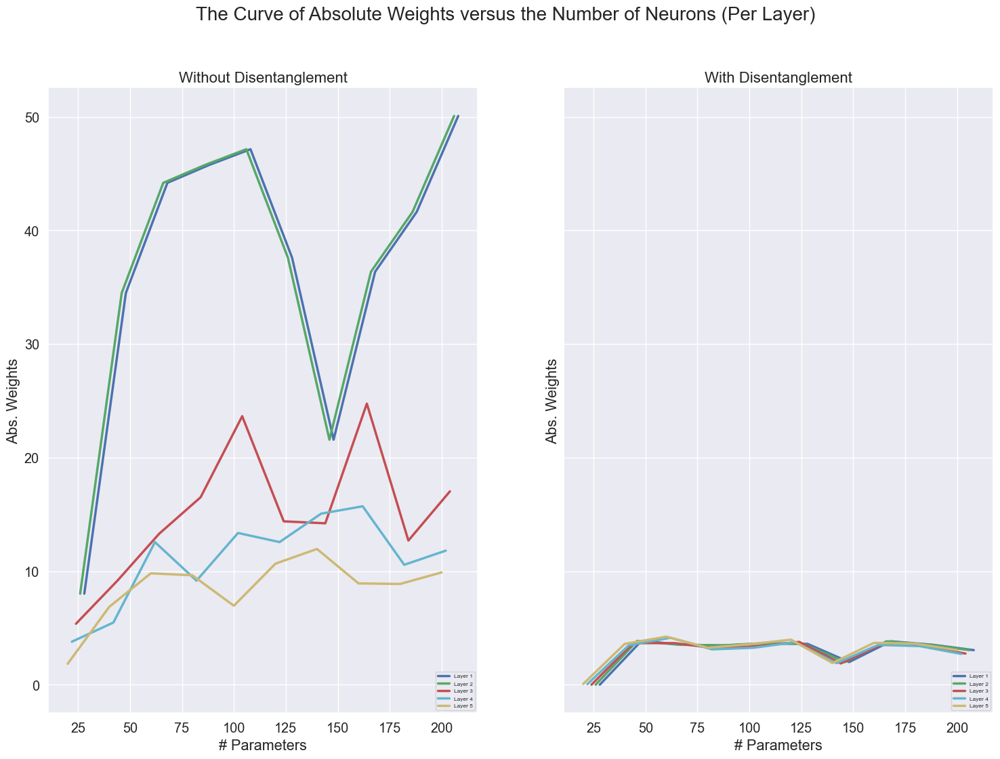

In [36]:
neurons_without_disentanglement = np.zeros((10, 5))
neurons_with_disentanglement = np.zeros((10, 5))

abs_weights_without_disentanglement = np.zeros((10, 5))
abs_weights_with_disentanglement = np.zeros((10, 5))

for i in range(10):
    for j in range(1, 6):
        abs_weights_without_disentanglement[i, j - 1] = np.power(np.sum(np.power(weights_without_disentanglement[i][j - 1], 2)) + np.sum(np.power(weights_without_disentanglement[i][j + 5], 2)), 0.5)
        neurons_without_disentanglement[i, j - 1] = len(weights_without_disentanglement[i][j])
        
        abs_weights_with_disentanglement[i, j - 1] = np.power(np.sum(np.power(weights_with_disentanglement[i][j - 1], 2)) + np.sum(np.power(weights_with_disentanglement[i][j + 5], 2)), 0.5)
        neurons_with_disentanglement[i, j - 1] = len(weights_without_disentanglement[i][j])
        
fig, axs = plt.subplots(1, 2, figsize = (18, 2 * 6), sharex = "row", sharey = "row")
fig.suptitle('The Curve of Absolute Weights versus the Number of Neurons (Per Layer)', fontsize = 20)

ax = axs[0]

ax.set_title('Without Disentanglement', fontsize = 16)

ax.set_xlabel('# Parameters')
ax.set_ylabel('Abs. Weights')

ax.plot(neurons_without_disentanglement[:, 0], abs_weights_without_disentanglement[:, 1], "-b", label = "Layer 1")
ax.plot(neurons_without_disentanglement[:, 1], abs_weights_without_disentanglement[:, 1], "-g", label = "Layer 2")
ax.plot(neurons_without_disentanglement[:, 2], abs_weights_without_disentanglement[:, 2], "-r", label = "Layer 3")
ax.plot(neurons_without_disentanglement[:, 3], abs_weights_without_disentanglement[:, 3], "-c", label = "Layer 4")
ax.plot(neurons_without_disentanglement[:, 4], abs_weights_without_disentanglement[:, 4], "-y", label = "Layer 5")

ax.legend(loc = 'lower right', fontsize = 'medium')

ax = axs[1]

ax.set_title('With Disentanglement', fontsize = 16)

ax.set_xlabel('# Parameters')
ax.set_ylabel('Abs. Weights')

ax.plot(neurons_with_disentanglement[:, 0], abs_weights_with_disentanglement[:, 1], "-b", label = "Layer 1")
ax.plot(neurons_with_disentanglement[:, 1], abs_weights_with_disentanglement[:, 1], "-g", label = "Layer 2")
ax.plot(neurons_with_disentanglement[:, 2], abs_weights_with_disentanglement[:, 2], "-r", label = "Layer 3")
ax.plot(neurons_with_disentanglement[:, 3], abs_weights_with_disentanglement[:, 3], "-c", label = "Layer 4")
ax.plot(neurons_with_disentanglement[:, 4], abs_weights_with_disentanglement[:, 4], "-y", label = "Layer 5")

ax.legend(loc = 'lower right', fontsize = 'medium')

fig.savefig('Figures/Subspace_Net/The Curve of Absolute Weights versus the Number of Neurons_Per Layer_Nonlinear_4.png', dpi=300, bbox_inches='tight')

### 2.3.3 Absolute Weights versus the Number of all Neurons <a class="anchor" id="section_2_3_3"></a>

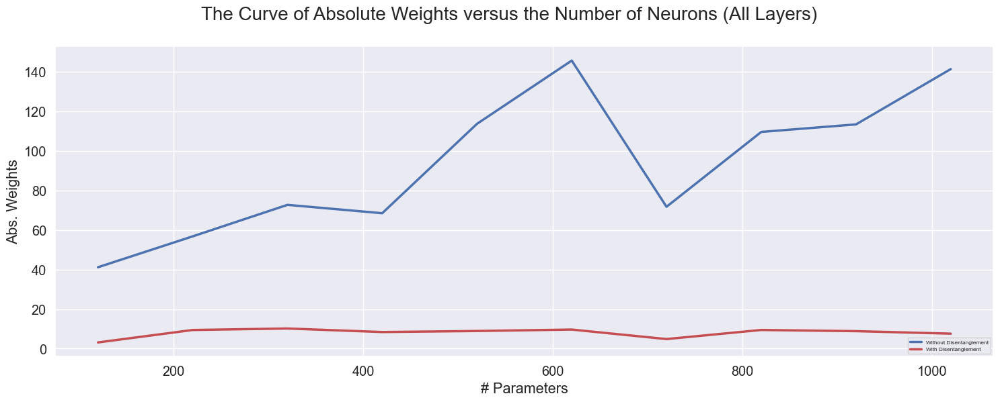

In [37]:
neurons_without_disentanglement = np.zeros(10)
neurons_with_disentanglement = np.zeros(10)

abs_weights_without_disentanglement = np.zeros(10)
abs_weights_with_disentanglement = np.zeros(10)

for i in range(10):
    for j in range(12):
        abs_weights_without_disentanglement[i] = abs_weights_without_disentanglement[i] + np.sum(np.power(weights_without_disentanglement[i][j], 2))  
        abs_weights_with_disentanglement[i] = abs_weights_with_disentanglement[i] + np.sum(np.power(weights_with_disentanglement[i][j], 2))
                                                                                                   
    abs_weights_without_disentanglement[i] = np.power(abs_weights_without_disentanglement[i], 0.5)
    abs_weights_with_disentanglement[i] = np.power(abs_weights_with_disentanglement[i], 0.5)
    
for i in range(10):
    for j in range(1, 6):
        neurons_without_disentanglement[i] = neurons_without_disentanglement[i] + len(weights_without_disentanglement[i][j])
        neurons_with_disentanglement[i] = neurons_with_disentanglement[i] + len(weights_with_disentanglement[i][j])
        
fig, axs = plt.subplots(1, 1, figsize = (18, 6))
fig.suptitle('The Curve of Absolute Weights versus the Number of Neurons (All Layers)', fontsize = 20)

ax = axs

ax.set_xlabel('# Parameters')
ax.set_ylabel('Abs. Weights')

ax.plot(neurons_without_disentanglement, abs_weights_without_disentanglement, "-b", label = "Without Disentanglement")
ax.plot(neurons_with_disentanglement, abs_weights_with_disentanglement, "-r", label = "With Disentanglement")

ax.legend(loc = 'lower right', fontsize = 'medium')

fig.savefig('Figures/Subspace_Net/The Curve of Absolute Weights versus the Number of Neurons_All Layers_Nonlinear_4.png', dpi=300, bbox_inches='tight')

### 2.3.4 Geometry Function (Method 1) <a class="anchor" id="section_2_3_4"></a>

In [38]:
P = 20

def compute_geometry(manifolds):
    # Radius, centers, subspaces
    Rs = []
    centers = []
    Us = []
    
    for manifold in tqdm(manifolds, leave=False):
        center = manifold.mean(0)
        centers.append(center)
        _, R, U = np.linalg.svd(manifold - center)
        Rs.append(R[:P])
        Us.append(U[:P])
    
    Rs = np.stack(Rs)
    centers = np.stack(centers)
    Us = np.stack(Us)
    
    # Overlaps
    K = len(manifolds)
    ss = []
    csa = []
    csb = []
    
    for a in tqdm(range(K), leave = False):
        for b in range(K):
            if a != b:
                # Center-subspace
                dx0 = centers[a] - centers[b]
                dx0hat = dx0 / np.linalg.norm(dx0)
                costheta_a = Us[a] @ dx0hat
                csa.append((costheta_a ** 2 * Rs[a] ** 2).sum() / (Rs[a] ** 2).sum())
                costheta_b = Us[b] @ dx0hat
                csb.append((costheta_b ** 2 * Rs[b] ** 2).sum() / (Rs[a] ** 2).sum())

                # Subspace-subspace
                cosphi = Us[a] @ Us[b].T
                ss_overlap = (cosphi ** 2 * Rs[a][:, None] ** 2 * Rs[b] ** 2).sum() / (Rs[a] ** 2).sum() ** 2
                ss.append(ss_overlap)
            
            else:
                csa.append(np.nan)
                csb.append(np.nan)
                ss.append(np.nan)
                
    csa = np.stack(csa).reshape(K, K)
    csb = np.stack(csb).reshape(K, K)
    ss = np.stack(ss).reshape(K, K)
    
    return Rs, Us, centers, csa, csb, ss

### 2.3.5 Building Manifolds and Calculating the Dimensionality (Method 1) <a class="anchor" id="section_2_3_5"></a>

In [39]:
import copy


for i in range(10):
    inputs_labels_without_disentanglement = np.zeros((1000, len(inputs_without_disentanglement[i][0])))
    inputs_labels_with_disentanglement = np.zeros((1000, len(inputs_without_disentanglement[i][0])))

    for j in range(1000):
        for k in range(len(inputs_without_disentanglement[i][j])):
            inputs_labels_without_disentanglement[j][k] = np.round(10 * inputs_without_disentanglement[i][j][k][0])
            inputs_labels_with_disentanglement[j][k] = np.round(10 * inputs_with_disentanglement[i][j][k][0])
            
    images_labels_without_disentanglement = []
    images_labels_with_disentanglement = []
    
    for j in range(-10, 10):
        images_labels_without_disentanglement_temp = []
        images_labels_with_disentanglement_temp = []
        
        for k in range(1000):
            for l in range(len(inputs_without_disentanglement[i][j])):
                if inputs_labels_without_disentanglement[k][l] == j:
                    images_labels_without_disentanglement_temp.append(images_without_disentanglement[i][k][l])
                    
                if inputs_labels_with_disentanglement[k][l] == j: 
                    images_labels_with_disentanglement_temp.append(images_with_disentanglement[i][k][l])
        
        images_labels_without_disentanglement.append(images_labels_without_disentanglement_temp)
        images_labels_with_disentanglement.append(images_labels_with_disentanglement_temp)
    
    training_manifolds_without_disentanglement_1 = []
    training_manifolds_without_disentanglement_2 = []
    training_manifolds_without_disentanglement_3 = []
    training_manifolds_without_disentanglement_4 = []
    training_manifolds_without_disentanglement_5 = []
    
    for j in range(len(images_labels_without_disentanglement)):
        training_manifolds_without_disentanglement_1_temp = []
        training_manifolds_without_disentanglement_2_temp = []
        training_manifolds_without_disentanglement_3_temp = []
        training_manifolds_without_disentanglement_4_temp = []
        training_manifolds_without_disentanglement_5_temp = []
    
        for k in range(len(images_labels_without_disentanglement[j])):            
            training_manifold_1 = images_labels_without_disentanglement[j][k]           
            
            for l in range(5):
                training_manifold_2 = 0
                
                for m in range(len(weights_without_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_without_disentanglement[i][l][m] + weights_without_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_without_disentanglement_1_temp.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_without_disentanglement_2_temp.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_without_disentanglement_3_temp.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_without_disentanglement_4_temp.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_without_disentanglement_5_temp.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
        
        if len(images_labels_without_disentanglement[j]) >= 20:
            training_manifolds_without_disentanglement_1.append(np.array(training_manifolds_without_disentanglement_1_temp)[:20])
            training_manifolds_without_disentanglement_2.append(np.array(training_manifolds_without_disentanglement_2_temp)[:20])
            training_manifolds_without_disentanglement_3.append(np.array(training_manifolds_without_disentanglement_3_temp)[:20])
            training_manifolds_without_disentanglement_4.append(np.array(training_manifolds_without_disentanglement_4_temp)[:20])
            training_manifolds_without_disentanglement_5.append(np.array(training_manifolds_without_disentanglement_5_temp)[:20])
        
    training_manifolds_with_disentanglement_1 = []
    training_manifolds_with_disentanglement_2 = []
    training_manifolds_with_disentanglement_3 = []
    training_manifolds_with_disentanglement_4 = []
    training_manifolds_with_disentanglement_5 = []
    
    for j in range(len(images_labels_with_disentanglement)):
        training_manifolds_with_disentanglement_1_temp = []
        training_manifolds_with_disentanglement_2_temp = []
        training_manifolds_with_disentanglement_3_temp = []
        training_manifolds_with_disentanglement_4_temp = []
        training_manifolds_with_disentanglement_5_temp = []
    
        for k in range(len(images_labels_with_disentanglement[j])):            
            training_manifold_1 = images_labels_with_disentanglement[j][k]           
            
            for l in range(5):
                training_manifold_2 = 0 
                
                for m in range(len(weights_with_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_with_disentanglement[i][l][m] + weights_with_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_with_disentanglement_1_temp.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_with_disentanglement_2_temp.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_with_disentanglement_3_temp.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_with_disentanglement_4_temp.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_with_disentanglement_5_temp.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
                
        if len(images_labels_with_disentanglement[j]) >= 20:
            training_manifolds_with_disentanglement_1.append(np.array(training_manifolds_with_disentanglement_1_temp)[:20])
            training_manifolds_with_disentanglement_2.append(np.array(training_manifolds_with_disentanglement_2_temp)[:20])
            training_manifolds_with_disentanglement_3.append(np.array(training_manifolds_with_disentanglement_3_temp)[:20])
            training_manifolds_with_disentanglement_4.append(np.array(training_manifolds_with_disentanglement_4_temp)[:20])
            training_manifolds_with_disentanglement_5.append(np.array(training_manifolds_with_disentanglement_5_temp)[:20])
            
    for j in range(len(training_manifolds_without_disentanglement_1)):
        training_manifolds_without_disentanglement_1[j] = training_manifolds_without_disentanglement_1[j].T
        training_manifolds_without_disentanglement_2[j] = training_manifolds_without_disentanglement_2[j].T
        training_manifolds_without_disentanglement_3[j] = training_manifolds_without_disentanglement_3[j].T
        training_manifolds_without_disentanglement_4[j] = training_manifolds_without_disentanglement_4[j].T
        training_manifolds_without_disentanglement_5[j] = training_manifolds_without_disentanglement_5[j].T
    
    training_manifolds_without_disentanglement_1 = np.array(training_manifolds_without_disentanglement_1)
    training_manifolds_without_disentanglement_2 = np.array(training_manifolds_without_disentanglement_2)
    training_manifolds_without_disentanglement_3 = np.array(training_manifolds_without_disentanglement_3)
    training_manifolds_without_disentanglement_4 = np.array(training_manifolds_without_disentanglement_4)
    training_manifolds_without_disentanglement_5 = np.array(training_manifolds_without_disentanglement_5)

    for j in range(len(training_manifolds_with_disentanglement_1)):
        training_manifolds_with_disentanglement_1[j] = training_manifolds_with_disentanglement_1[j].T
        training_manifolds_with_disentanglement_2[j] = training_manifolds_with_disentanglement_2[j].T
        training_manifolds_with_disentanglement_3[j] = training_manifolds_with_disentanglement_3[j].T
        training_manifolds_with_disentanglement_4[j] = training_manifolds_with_disentanglement_4[j].T
        training_manifolds_with_disentanglement_5[j] = training_manifolds_with_disentanglement_5[j].T
    
    training_manifolds_with_disentanglement_1 = np.array(training_manifolds_with_disentanglement_1)
    training_manifolds_with_disentanglement_2 = np.array(training_manifolds_with_disentanglement_2)
    training_manifolds_with_disentanglement_3 = np.array(training_manifolds_with_disentanglement_3)
    training_manifolds_with_disentanglement_4 = np.array(training_manifolds_with_disentanglement_4)
    training_manifolds_with_disentanglement_5 = np.array(training_manifolds_with_disentanglement_5)
    
    training_manifolds_without_disentanglement_final = []
    training_manifolds_with_disentanglement_final = []

    training_manifolds_without_disentanglement_final.append(training_manifolds_without_disentanglement_1)
    training_manifolds_without_disentanglement_final.append(training_manifolds_without_disentanglement_2)
    training_manifolds_without_disentanglement_final.append(training_manifolds_without_disentanglement_3)
    training_manifolds_without_disentanglement_final.append(training_manifolds_without_disentanglement_4)
    training_manifolds_without_disentanglement_final.append(training_manifolds_without_disentanglement_5)

    training_manifolds_with_disentanglement_final.append(training_manifolds_with_disentanglement_1)
    training_manifolds_with_disentanglement_final.append(training_manifolds_with_disentanglement_2)
    training_manifolds_with_disentanglement_final.append(training_manifolds_with_disentanglement_3)
    training_manifolds_with_disentanglement_final.append(training_manifolds_with_disentanglement_4)
    training_manifolds_with_disentanglement_final.append(training_manifolds_with_disentanglement_5)
    
    Rs_all_without_disentanglement = []
    Us_all_without_disentanglement = [] 
    centers_all_without_disentanglement = []
    csa_all_without_disentanglement = []
    csb_all_without_disentanglement = []
    ss_all_without_disentanglement = []
        
    for j in range(5):
        manifolds = training_manifolds_without_disentanglement_final[j]
        Rs, Us, centers, csa, csb, ss = compute_geometry(manifolds)
            
        Rs_all_without_disentanglement.append(Rs)
        Us_all_without_disentanglement.append(Us)
        centers_all_without_disentanglement.append(centers)
        csa_all_without_disentanglement.append(csa)
        csb_all_without_disentanglement.append(csb)
        ss_all_without_disentanglement.append(ss)
    
    Rs_all_without_disentanglement = np.stack(Rs_all_without_disentanglement)
    Ds_without_disentanglement = (Rs_all_without_disentanglement ** 2).sum(-1) ** 2 / (Rs_all_without_disentanglement ** 4).sum(-1)              

    scipy.io.savemat('Figures/Subspace_Net/Ds_without_disentanglement_deep_nonlinear_factor_4_method1_' + str(i) + '.mat', mdict = {'Ds': Ds_without_disentanglement})
        
    Rs_all_with_disentanglement = []
    Us_all_with_disentanglement = [] 
    centers_all_with_disentanglement = []
    csa_all_with_disentanglement = []
    csb_all_with_disentanglement = []
    ss_all_with_disentanglement = []
        
    for j in range(5):
        manifolds = training_manifolds_with_disentanglement_final[j]
        Rs, Us, centers, csa, csb, ss = compute_geometry(manifolds)
            
        Rs_all_with_disentanglement.append(Rs)
        Us_all_with_disentanglement.append(Us)
        centers_all_with_disentanglement.append(centers)
        csa_all_with_disentanglement.append(csa)
        csb_all_with_disentanglement.append(csb)
        ss_all_with_disentanglement.append(ss)
    
    Rs_all_with_disentanglement = np.stack(Rs_all_with_disentanglement)
    Ds_with_disentanglement = (Rs_all_with_disentanglement ** 2).sum(-1) ** 2 / (Rs_all_with_disentanglement ** 4).sum(-1)              

    scipy.io.savemat('Figures/Subspace_Net/Ds_with_disentanglement_deep_nonlinear_factor_4_method1_' + str(i) + '.mat', mdict = {'Ds': Ds_with_disentanglement})

C:\Users\Lion\AppData\Local\Temp\ipykernel_4932\3676571061.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for manifold in tqdm(manifolds, leave=False):


  0%|          | 0/11 [00:00<?, ?it/s]

C:\Users\Lion\AppData\Local\Temp\ipykernel_4932\3676571061.py:26: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for a in tqdm(range(K), leave = False):


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

C:\Users\Lion\AppData\Local\Temp\ipykernel_4932\3676571061.py:31: RuntimeWarning: invalid value encountered in divide
  dx0hat = dx0 / np.linalg.norm(dx0)


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

### 2.3.6 Plotting the Dimensionality across Layers (Method 1) <a class="anchor" id="section_2_3_6"></a>

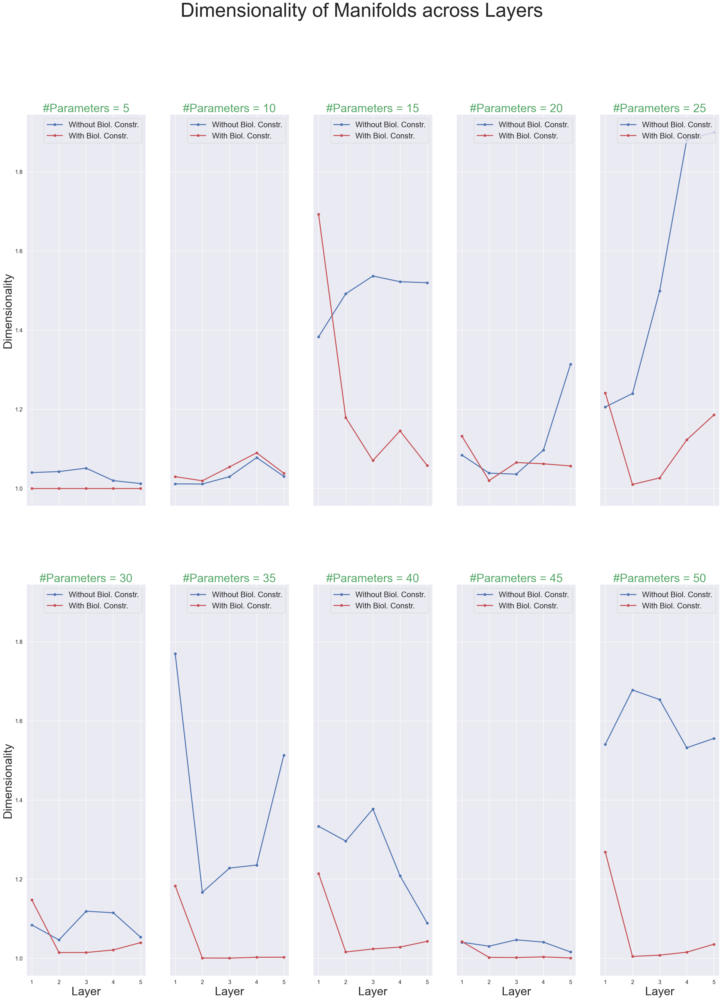

In [40]:
fig, axs = plt.subplots(2, 5, figsize = (2 * 16, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('Dimensionality of Manifolds across Layers', fontsize = 50)

parameters = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

for i in range(10):
    if i < 5:
        ax = axs[0, i]
    elif i >= 5:
        ax = axs[1, i - 5]
        ax.set_xlabel('Layer', fontsize = 30)
        
    if i == 0 or i == 5:
        ax.set_ylabel('Dimensionality', fontsize = 30)
        
    ax.set_title('#Parameters = ' + str(parameters[i]), fontsize = 30, color = 'g')
    
    Ds_without_disentanglement = scipy.io.loadmat('Figures/Subspace_Net/Ds_without_disentanglement_deep_nonlinear_factor_4_method1_' + str(i) + '.mat')['Ds']
    Ds_with_disentanglement = scipy.io.loadmat('Figures/Subspace_Net/Ds_with_disentanglement_deep_nonlinear_factor_4_method1_' + str(i) + '.mat')['Ds']

    ax.plot(range(1, 6), Ds_without_disentanglement.mean(-1), "-ob", label = "Without Biol. Constr.")
    ax.plot(range(1, 6), Ds_with_disentanglement.mean(-1), "-or", label = "With Biol. Constr.")
    
    ax.legend(loc = 'upper right', fontsize = 20)
                        
fig.savefig('Figures/Subspace_Net/Dimensionality of Manifolds across Layers_Nonlinear_4_Method1.png')

### 2.3.7 Geometry Function (Method 2)  <a class="anchor" id="section_2_3_7"></a>

In [41]:
import numpy as np
from scipy.stats import pearsonr
from sklearn import linear_model

                     
def intrinsic_dimension(X, fraction = 0.9, verbose = False):    
    """
        Estimates the intrinsic dimension of a system of points from the matrix of their distances X
        
        Args:
        X: 2-D Matrix X (n, n) where n is the number of points
        fraction: fraction of the data considered for the dimensionality estimation (default: fraction = 0.9)
        
        Returns:            
        x: log(mu)    (*)
        y: - (1 - F(mu)) (*)
        reg: linear regression y ~ x structure obtained with scipy.stats.linregress
        (reg.slope is the intrinsic dimension estimate)
        r: determination coefficient of y ~ x
        pval: p-value of y ~ x
            
        (*) See cited paper for description
        
        Usage:
        _, _, reg, r, pval = estimate(X, fraction = 0.85)
            
        The technique is described in:          
        "Estimating the intrinsic dimension of datasets by a minimal neighborhood information"       
        Authors: Elena Facco, Maria d’Errico, Alex Rodriguez & Alessandro Laio        
        Scientific Reports 7, Article number: 12140 (2017)
        doi:10.1038/s41598-017-11873-y  
    """             
     
    # Sort distance matrix
    Y = np.sort(X, axis = 1, kind = 'quicksort')

    # Clean data
    k1 = Y[:, 1]
    k2 = Y[:, 2]

    zeros = np.where(k1 == 0)[0]
    
    if verbose:
        print('Found n. {} elements for which r1 = 0'.format(zeros.shape[0]))
        print(zeros)

    degeneracies = np.where(k1 == k2)[0]
    
    if verbose:
        print('Found n. {} elements for which r1 = r2'.format(degeneracies.shape[0]))
        print(degeneracies)

    good = np.setdiff1d(np.arange(Y.shape[0]), np.array(zeros))
    good = np.setdiff1d(good, np.array(degeneracies))
    
    if verbose:
        print('Fraction good points: {}'.format(good.shape[0] / Y.shape[0]))
    
    k1 = k1[good]
    k2 = k2[good]    
    
    # Number of points to consider for the linear regression
    npoints = int(np.floor(good.shape[0] * fraction))

    # Define mu and Femp
    N = good.shape[0]
    mu = np.sort(np.divide(k2, k1), axis = None, kind = 'quicksort')
    Femp = (np.arange(1, N + 1, dtype = np.float64)) / N
    
    # Take logs (leave out the last element because 1 - Femp is zero there)
    x = np.log(mu[:-2])
    y = - np.log(1 - Femp[:-2])

    # Regression
    regr = linear_model.LinearRegression(fit_intercept = False)
    
    if x.shape[0] > 0:
        regr.fit(x[0:npoints, np.newaxis], y[0:npoints, np.newaxis]) 
        r, pval = pearsonr(x[0:npoints], y[0:npoints])        
        return x, y, regr.coef_[0][0], r, pval 
    
    elif x.shape[0] == 0:
        return x, y, 0.0, 0.0, 0.0

### 2.3.8 Building Manifolds and Calculating the Dimensionality (Method 2) <a class="anchor" id="section_2_3_8"></a>

In [42]:
import copy
from scipy.spatial.distance import pdist, squareform


for i in range(10):
    training_manifolds_without_disentanglement_1 = []
    training_manifolds_without_disentanglement_2 = []
    training_manifolds_without_disentanglement_3 = []
    training_manifolds_without_disentanglement_4 = []
    training_manifolds_without_disentanglement_5 = []
    
    for j in range(10):
        for k in range(len(images_without_disentanglement[i][j])):

            training_manifold_1 = images_without_disentanglement[i][j][k]           
            
            for l in range(5):
                training_manifold_2 = 0
                
                for m in range(len(weights_without_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_without_disentanglement[i][l][m] + weights_without_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_without_disentanglement_1.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_without_disentanglement_2.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_without_disentanglement_3.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_without_disentanglement_4.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_without_disentanglement_5.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
                
    training_manifolds_with_disentanglement_1 = []
    training_manifolds_with_disentanglement_2 = []
    training_manifolds_with_disentanglement_3 = []
    training_manifolds_with_disentanglement_4 = []
    training_manifolds_with_disentanglement_5 = []
    
    for j in range(10):
        for k in range(len(images_with_disentanglement[i][j])):

            training_manifold_1 = images_with_disentanglement[i][j][k]           
            
            for l in range(5):
                training_manifold_2 = 0
                
                for m in range(len(weights_with_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_with_disentanglement[i][l][m] + weights_with_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_with_disentanglement_1.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_with_disentanglement_2.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_with_disentanglement_3.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_with_disentanglement_4.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_with_disentanglement_5.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
    
    training_manifolds_without_disentanglement_1_final = np.array(training_manifolds_without_disentanglement_1)
    training_manifolds_without_disentanglement_2_final = np.array(training_manifolds_without_disentanglement_2)
    training_manifolds_without_disentanglement_3_final = np.array(training_manifolds_without_disentanglement_3)
    training_manifolds_without_disentanglement_4_final = np.array(training_manifolds_without_disentanglement_4)
    training_manifolds_without_disentanglement_5_final = np.array(training_manifolds_without_disentanglement_5)
    
    training_manifolds_with_disentanglement_1_final = np.array(training_manifolds_with_disentanglement_1)
    training_manifolds_with_disentanglement_2_final = np.array(training_manifolds_with_disentanglement_2)
    training_manifolds_with_disentanglement_3_final = np.array(training_manifolds_with_disentanglement_3)
    training_manifolds_with_disentanglement_4_final = np.array(training_manifolds_with_disentanglement_4)
    training_manifolds_with_disentanglement_5_final = np.array(training_manifolds_with_disentanglement_5)
                    
    intrinsic_dimension_without_disentanglement = []
    intrinsic_dimension_with_disentanglement = [] 
    
    intrinsic_dimension_without_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_without_disentanglement_1_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_without_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_without_disentanglement_2_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_without_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_without_disentanglement_3_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_without_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_without_disentanglement_4_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_without_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_without_disentanglement_5_final), 'euclidean'), fraction = 1.0)[2])
    
    intrinsic_dimension_without_disentanglement = np.array(intrinsic_dimension_without_disentanglement)
    
    scipy.io.savemat('Figures/Subspace_Net/Ds_without_disentanglement_deep_nonlinear_factor_4_method2_' + str(i) + '.mat', mdict = {'Ds': intrinsic_dimension_without_disentanglement})
    
    intrinsic_dimension_with_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_with_disentanglement_1_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_with_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_with_disentanglement_2_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_with_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_with_disentanglement_3_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_with_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_with_disentanglement_4_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_with_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_with_disentanglement_5_final), 'euclidean'), fraction = 1.0)[2])
    
    intrinsic_dimension_with_disentanglement = np.array(intrinsic_dimension_with_disentanglement)
    
    scipy.io.savemat('Figures/Subspace_Net/Ds_with_disentanglement_deep_nonlinear_factor_4_method2_' + str(i) + '.mat', mdict = {'Ds': intrinsic_dimension_with_disentanglement})

### 2.3.9 Plotting the Dimensionality across Layers (Method 2) <a class="anchor" id="section_2_3_9"></a>

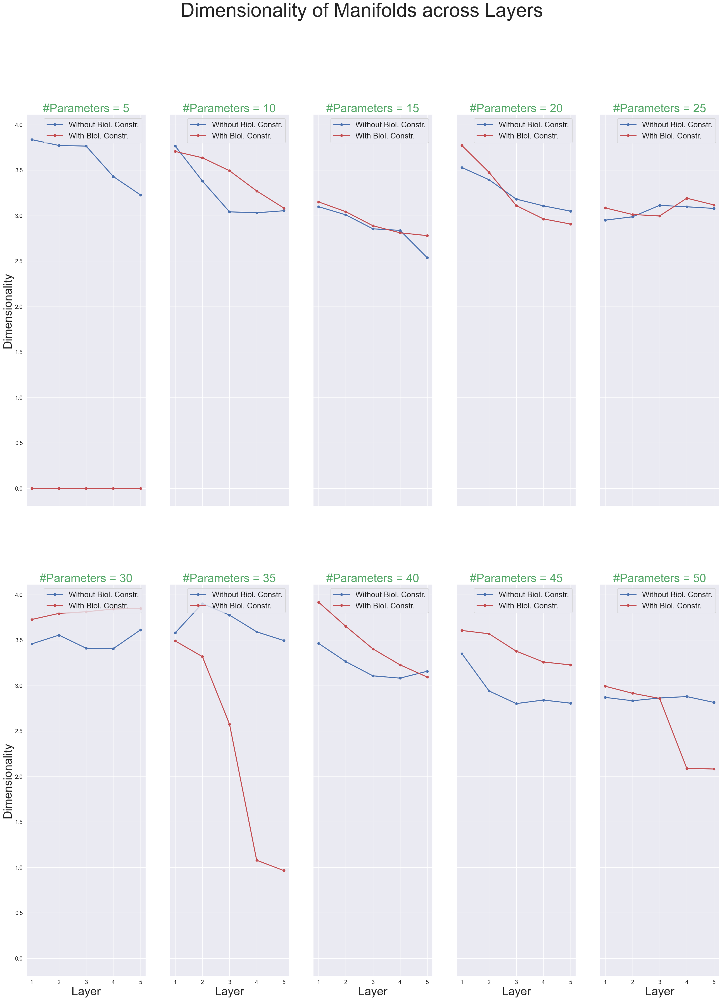

In [43]:
fig, axs = plt.subplots(2, 5, figsize = (2 * 16, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('Dimensionality of Manifolds across Layers', fontsize = 50)

parameters = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

for i in range(10):
    if i < 5:
        ax = axs[0, i]
    elif i >= 5:
        ax = axs[1, i - 5]
        ax.set_xlabel('Layer', fontsize = 30)
        
    if i == 0 or i == 5:
        ax.set_ylabel('Dimensionality', fontsize = 30)
        
    ax.set_title('#Parameters = ' + str(parameters[i]), fontsize = 30, color = 'g')
    
    Ds_without_disentanglement = scipy.io.loadmat('Figures/Subspace_Net/Ds_without_disentanglement_deep_nonlinear_factor_4_method2_' + str(i) + '.mat')['Ds']
    Ds_with_disentanglement = scipy.io.loadmat('Figures/Subspace_Net/Ds_with_disentanglement_deep_nonlinear_factor_4_method2_' + str(i) + '.mat')['Ds']

    ax.plot(range(1, 6), Ds_without_disentanglement.squeeze(0), "-ob", label = "Without Biol. Constr.")
    ax.plot(range(1, 6), Ds_with_disentanglement.squeeze(0), "-or", label = "With Biol. Constr.")
    
    ax.legend(loc = 'upper right', fontsize = 20)
                        
fig.savefig('Figures/Subspace_Net/Dimensionality of Manifolds across Layers_Nonlinear_4_Method2.png')

### 2.3.10 Functions for Computing Sample Efficient Learning Curves <a class="anchor" id="section_2_3_10"></a>

In [44]:
from cycler import cycler
import matplotlib as mpl
import pdb
import scipy as sp
import scipy.io
import scipy.optimize
from scipy.sparse.linalg import eigsh
import scipy.stats as stats
import skimage
from skimage import filters as filt
from skimage import transform
from sklearn.decomposition import PCA
import time

mpl.rcParams['axes.prop_cycle'] = cycler(color = 'bgrcmyk')

# import decoder
myfont = 6
myaxis_font = 8
plt.rcParams.update({'font.size': myfont})
line_width = 1


def f(z, *args):
    p, spectrum, lamb = args
    
    return z - lamb - z * np.sum(spectrum / (p * spectrum + z))


def fp(z, *args):
    p, spectrum, lamb = args
    
    return 1 - np.sum( spectrum / (p * spectrum + z)) + np.sum(spectrum / (p * spectrum + z) ** 2)


def solve_implicit(pvals, spectrum, lamb):
    zvals = np.zeros(len(pvals))
    
    for i, p in enumerate(pvals):
        args = (p, spectrum, lamb)
        zvals[i] = sp.optimize.root_scalar(f = f, method = 'newton', fprime = fp, x0 = 2 * np.sum(spectrum) + 2 * lamb, args = args).root
    
    return zvals


def gamma_fn(pvals, zvals, spectrum):
    all_vals = np.zeros(len(pvals))
    
    for i, p in enumerate(pvals):
        all_vals[i] = p * np.sum(spectrum ** 2 / (spectrum * p + zvals[i]) ** 2)
    
    return all_vals


def mode_errs(pvals, spectrum, teacher, lamb):
    zvals = solve_implicit(pvals, spectrum, lamb)
    gamma = gamma_fn(pvals, zvals, spectrum)
    err = np.zeros((len(spectrum), len(pvals)))
    
    for j in range(len(spectrum)):    
        lamb_j = spectrum[j]
        teacher_weights_j = teacher[j]
        err[j, :] = zvals ** 2 / (1 - gamma) * teacher_weights_j / (lamb_j * pvals + zvals) ** 2
        
        # if j == len(spectrum) - 1:
            # plt.loglog(pvals[0:10], err[0:10])
            # plt.show()
    
    return err


def sorted_spectral_decomp(resp, imgs = None):
    K = 1 / resp.shape[1] * resp @ resp.T
    s, v = np.linalg.eigh(K)
    indsort = np.argsort(s)[::-1]
    s = s[indsort]
    v = v[:, indsort]
    
    return K, s, v


def compute_learning_curves(K, y, pvals, lamb):
    # coeffs = 1 / K.shape[0] * (u.T @ y) ** 2
    # theory_lc = mode_errs(pvals, s, coeffs, lamb).sum(axis = 0)
    
    num_repeats = 5
    err_expt = np.zeros((len(pvals), num_repeats))
    
    for n in range(num_repeats):
        for i, p in enumerate(pvals):
            inds = np.random.choice(K.shape[0], p, replace = True)
            # test_i = permed[p:permed.shape[0]]
            
            Ki = K[inds, :]
            Kii = Ki[:, inds]
            # K_test = Ki[:, test_i]
            
            print(Ki.shape)
            yi = y[inds, :]
            yhat = Ki.T @ np.linalg.solve(Kii + 1 / K.shape[0] * lamb * np.eye(p), yi)
            err_expt[i, n] = np.sum((y - yhat) ** 2)
    
    return err_expt, yhat


def get_all_task_info(resp, y, pvals, ptheory):
    # K = 1 / resp.shape[1] * resp @ resp.T
    K, s, vec = sorted_spectral_decomp(resp)
    lamb = np.trace(K)
    teacher = np.sum((vec.T @ y) ** 2, axis = 1)
    err_expt, yhat = compute_learning_curves(K, y, pvals, lamb)
    theory = mode_errs(ptheory, s, teacher, lamb)
    
    return err_expt, theory, s, teacher, yhat

### 2.3.11 Calculating of Sample Efficient Learning Curves <a class="anchor" id="section_2_3_11"></a>

In [45]:
import copy


for i in range(10):
    training_manifolds_without_disentanglement_0 = []
    training_manifolds_without_disentanglement_1 = []
    training_manifolds_without_disentanglement_2 = []
    training_manifolds_without_disentanglement_3 = []
    training_manifolds_without_disentanglement_4 = []
    training_manifolds_without_disentanglement_5 = []
    
    for j in range(10):
        for k in range(len(images_without_disentanglement[i][j])):
            training_manifolds_without_disentanglement_0.append(images_without_disentanglement[i][j][k])
            training_manifold_1 = images_without_disentanglement[i][j][k]           
            
            for l in range(5):
                training_manifold_2 = 0
                
                for m in range(len(weights_without_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_without_disentanglement[i][l][m] + weights_without_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_without_disentanglement_1.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_without_disentanglement_2.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_without_disentanglement_3.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_without_disentanglement_4.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_without_disentanglement_5.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
                
    training_manifolds_with_disentanglement_0 = []
    training_manifolds_with_disentanglement_1 = []
    training_manifolds_with_disentanglement_2 = []
    training_manifolds_with_disentanglement_3 = []
    training_manifolds_with_disentanglement_4 = []
    training_manifolds_with_disentanglement_5 = []
    
    for j in range(10):
        for k in range(len(images_with_disentanglement[i][j])):
            training_manifolds_with_disentanglement_0.append(images_with_disentanglement[i][j][k])
            training_manifold_1 = images_with_disentanglement[i][j][k]           
            
            for l in range(5):
                training_manifold_2 = 0
                
                for m in range(len(weights_with_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_with_disentanglement[i][l][m] + weights_with_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_with_disentanglement_1.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_with_disentanglement_2.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_with_disentanglement_3.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_with_disentanglement_4.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_with_disentanglement_5.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
    
    training_manifolds_without_disentanglement_0_final = np.array(training_manifolds_without_disentanglement_0)
    training_manifolds_without_disentanglement_1_final = np.array(training_manifolds_without_disentanglement_1)
    training_manifolds_without_disentanglement_2_final = np.array(training_manifolds_without_disentanglement_2)
    training_manifolds_without_disentanglement_3_final = np.array(training_manifolds_without_disentanglement_3)
    training_manifolds_without_disentanglement_4_final = np.array(training_manifolds_without_disentanglement_4)
    training_manifolds_without_disentanglement_5_final = np.array(training_manifolds_without_disentanglement_5)
    
    training_manifolds_with_disentanglement_0_final = np.array(training_manifolds_with_disentanglement_0)
    training_manifolds_with_disentanglement_1_final = np.array(training_manifolds_with_disentanglement_1)
    training_manifolds_with_disentanglement_2_final = np.array(training_manifolds_with_disentanglement_2)
    training_manifolds_with_disentanglement_3_final = np.array(training_manifolds_with_disentanglement_3)
    training_manifolds_with_disentanglement_4_final = np.array(training_manifolds_with_disentanglement_4)
    training_manifolds_with_disentanglement_5_final = np.array(training_manifolds_with_disentanglement_5)
    
    all_err_layers_without_disentanglement = []
    all_theory_layers_without_disentanglement = []
    all_vk_layers_without_disentanglement = []
    
    for j in range(5):
        y_fourier = training_manifolds_without_disentanglement_0_final / np.sqrt(np.sum(training_manifolds_without_disentanglement_0_final ** 2))
            
        pvals = np.logspace(0, 3.0, 8).astype('int')
        ptheory = np.logspace(0, 3.5, 40)
        
        if j == 0:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_without_disentanglement_1_final, y_fourier, pvals, ptheory)
        elif j == 1:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_without_disentanglement_2_final, y_fourier, pvals, ptheory)
        elif j == 2:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_without_disentanglement_3_final, y_fourier, pvals, ptheory)
        elif j == 3:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_without_disentanglement_4_final, y_fourier, pvals, ptheory)
        elif j == 4:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_without_disentanglement_5_final, y_fourier, pvals, ptheory)
        
        all_err_layers_without_disentanglement += [err]
        all_theory_layers_without_disentanglement += [theory]
        all_vk_layers_without_disentanglement += [vk]
            
    scipy.io.savemat('Figures/Subspace_Net/pvals.mat', mdict = {'pvals': pvals})
    scipy.io.savemat('Figures/Subspace_Net/ptheory.mat', mdict = {'ptheory': ptheory})
            
    scipy.io.savemat('Figures/Subspace_Net/all_err_layers_without_disentanglement_Nonlinear_4_' + str(i) + '.mat', mdict = {'err': all_err_layers_without_disentanglement})
    scipy.io.savemat('Figures/Subspace_Net/all_theory_layers_without_disentanglement_Nonlinear_4_' + str(i) + '.mat', mdict = {'theory': all_theory_layers_without_disentanglement})  
    scipy.io.savemat('Figures/Subspace_Net/all_vk_layers_without_disentanglement_Nonlinear_4_' + str(i) + '.mat', mdict = {'vk': all_vk_layers_without_disentanglement})
    
    all_err_layers_with_disentanglement = []
    all_theory_layers_with_disentanglement = []
    all_vk_layers_with_disentanglement = []
    
    for j in range(5):
        y_fourier = training_manifolds_with_disentanglement_0_final / np.sqrt(np.sum(training_manifolds_with_disentanglement_0_final ** 2))
            
        pvals = np.logspace(0, 3.0, 8).astype('int')
        ptheory = np.logspace(0, 3.5, 40)
        
        if j == 0:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_with_disentanglement_1_final, y_fourier, pvals, ptheory)
        elif j == 1:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_with_disentanglement_2_final, y_fourier, pvals, ptheory)
        elif j == 2:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_with_disentanglement_3_final, y_fourier, pvals, ptheory)
        elif j == 3:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_with_disentanglement_4_final, y_fourier, pvals, ptheory)
        elif j == 4:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_with_disentanglement_5_final, y_fourier, pvals, ptheory)
        
        all_err_layers_with_disentanglement += [err]
        all_theory_layers_with_disentanglement += [theory]
        all_vk_layers_with_disentanglement += [vk]
            
    scipy.io.savemat('Figures/Subspace_Net/pvals.mat', mdict = {'pvals': pvals})
    scipy.io.savemat('Figures/Subspace_Net/ptheory.mat', mdict = {'ptheory': ptheory})
            
    scipy.io.savemat('Figures/Subspace_Net/all_err_layers_with_disentanglement_Nonlinear_4_' + str(i) + '.mat', mdict = {'err': all_err_layers_with_disentanglement})
    scipy.io.savemat('Figures/Subspace_Net/all_theory_layers_with_disentanglement_Nonlinear_4_' + str(i) + '.mat', mdict = {'theory': all_theory_layers_with_disentanglement})  
    scipy.io.savemat('Figures/Subspace_Net/all_vk_layers_with_disentanglement_Nonlinear_4_' + str(i) + '.mat', mdict = {'vk': all_vk_layers_with_disentanglement})

(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(

(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280

(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(

(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 128

(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280

(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 12

### 2.3.12 Plotting of Sample Efficient Learning Curves <a class="anchor" id="section_2_3_12"></a>

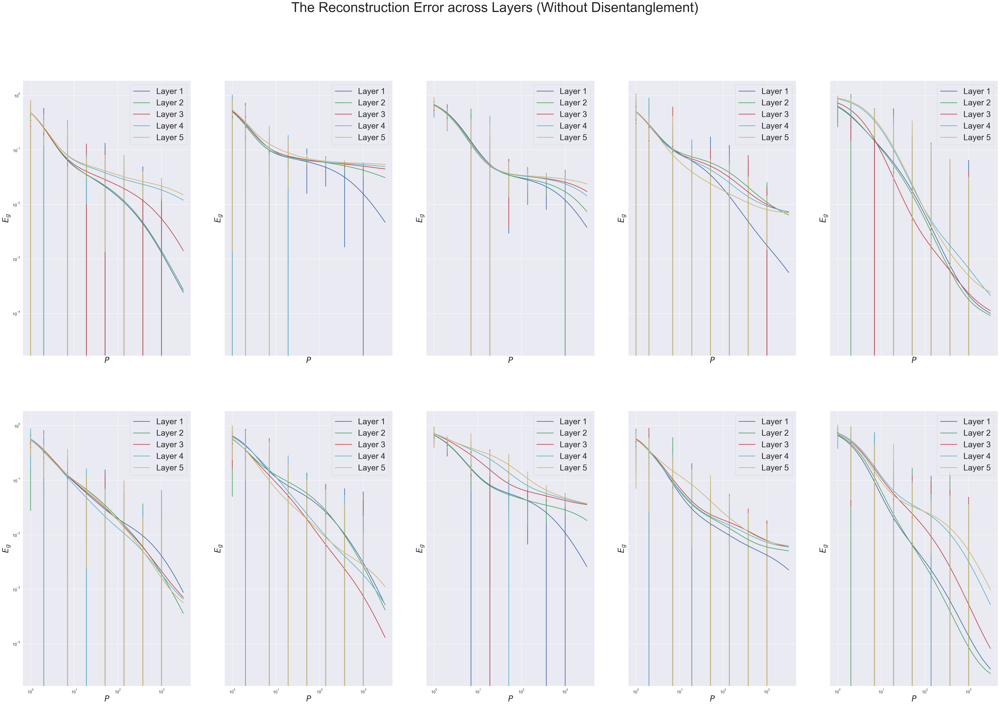

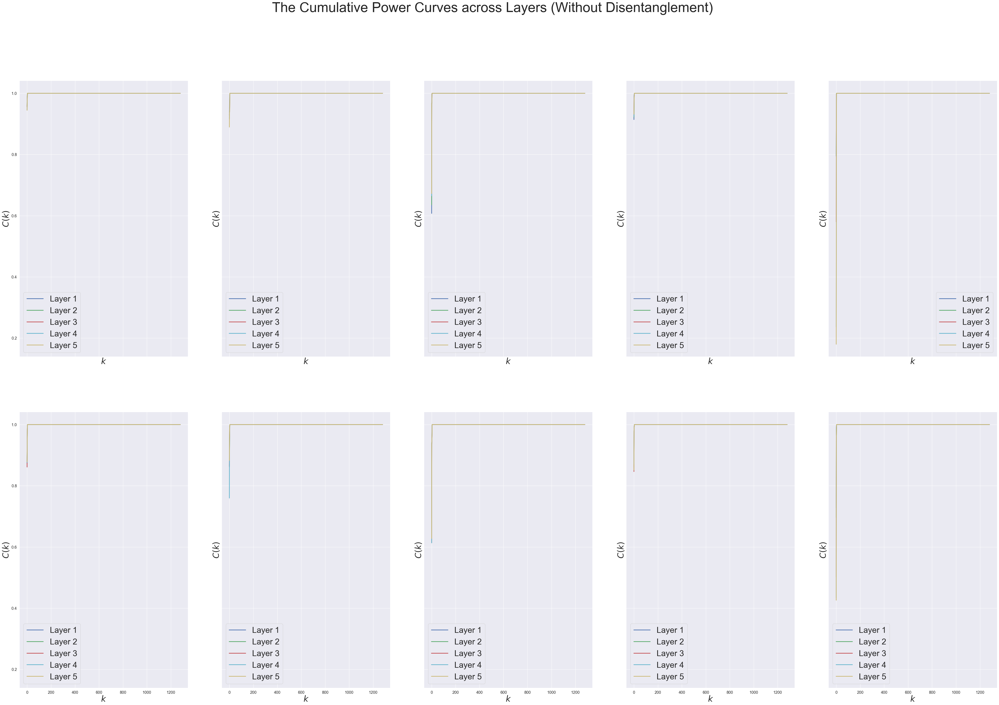

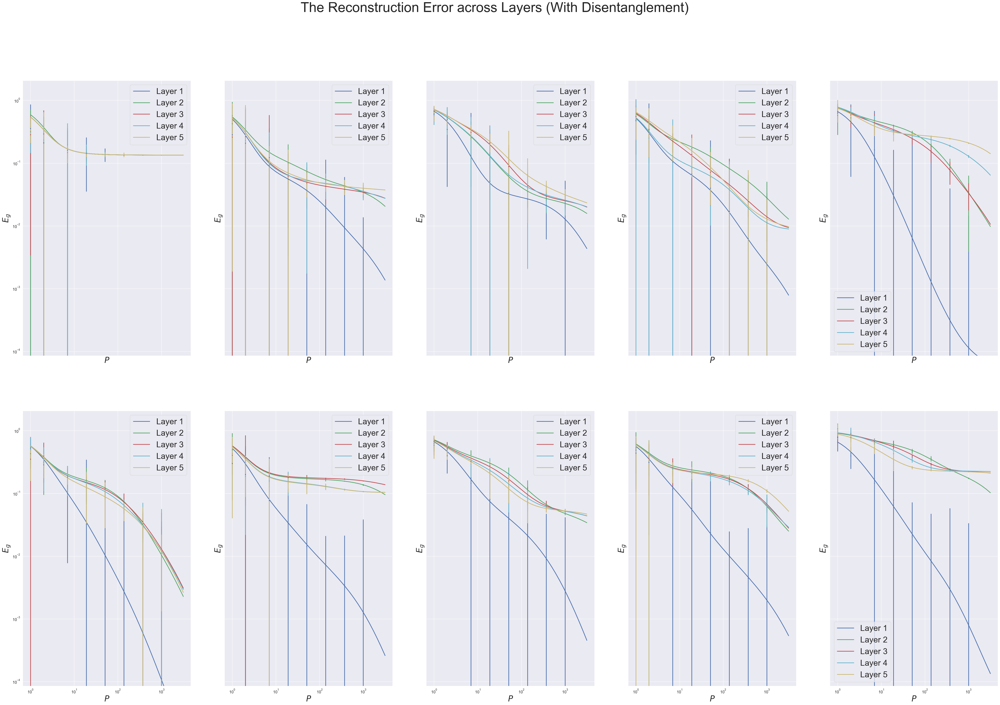

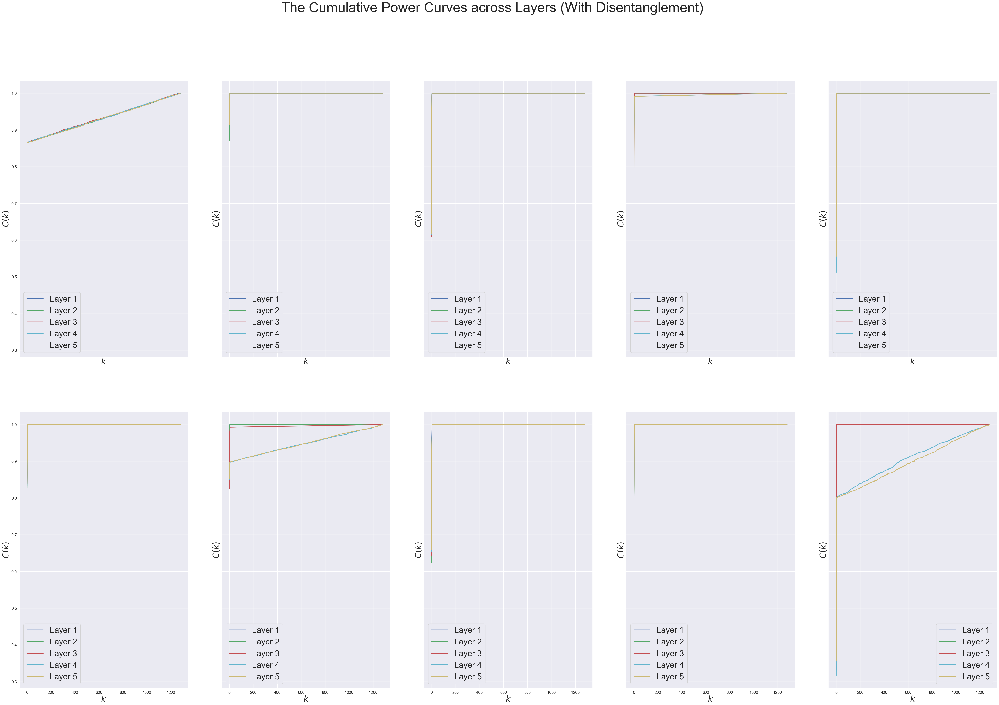

In [46]:
fig, axs = plt.subplots(2, 5, figsize = (2 * 32, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('The Reconstruction Error across Layers (Without Disentanglement)', fontsize = 50)

for i in range(10):            
    if i < 5:
        ax = axs[0, i]
    if i >= 5:
        ax = axs[1, i - 5]
        
    pvals = scipy.io.loadmat('Figures/Subspace_Net/pvals.mat')['pvals']
    ptheory = scipy.io.loadmat('Figures/Subspace_Net/ptheory.mat')['ptheory']
            
    err = scipy.io.loadmat('Figures/Subspace_Net/all_err_layers_without_disentanglement_Nonlinear_4_' + str(i) + '.mat')['err']
    theory = scipy.io.loadmat('Figures/Subspace_Net/all_theory_layers_without_disentanglement_Nonlinear_4_' + str(i) + '.mat')['theory'] 
    vk = scipy.io.loadmat('Figures/Subspace_Net/all_vk_layers_without_disentanglement_Nonlinear_4_' + str(i) + '.mat')['vk']
    
    color_array = ['b', 'g', 'r', 'c', 'y']
    label_array = ['Layer 1', 'Layer 2', 'Layer 3', 'Layer 4', 'Layer 5']
    
    for j in range(5):
        ax.loglog(ptheory.squeeze(0), theory[j].sum(axis = 0), color = color_array[j], label = label_array[j])
        ax.errorbar(pvals.squeeze(0), err[j].mean(axis = 1), err[j].std(axis = 1) / err[j].mean(axis = 1), fmt = 'o', markersize = 2.5, color = color_array[j])
            
    ax.legend(fontsize = 30)
    ax.set_xlabel(r'$P$', fontsize = 30)
    ax.set_ylabel(r'$E_g$', fontsize = 30)

fig.savefig('Figures/Subspace_Net/The Reconstruction Error across Layers (Without Disentanglement)_Nonlinear_4.png')

fig, axs = plt.subplots(2, 5, figsize = (2 * 32, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('The Cumulative Power Curves across Layers (Without Disentanglement)', fontsize = 50)

for i in range(10):            
    if i < 5:
        ax = axs[0, i]
    if i >= 5:
        ax = axs[1, i - 5]
        
    pvals = scipy.io.loadmat('Figures/Subspace_Net/pvals.mat')['pvals']
    ptheory = scipy.io.loadmat('Figures/Subspace_Net/ptheory.mat')['ptheory']
            
    err = scipy.io.loadmat('Figures/Subspace_Net/all_err_layers_without_disentanglement_Nonlinear_4_' + str(i) + '.mat')['err']
    theory = scipy.io.loadmat('Figures/Subspace_Net/all_theory_layers_without_disentanglement_Nonlinear_4_' + str(i) + '.mat')['theory'] 
    vk = scipy.io.loadmat('Figures/Subspace_Net/all_vk_layers_without_disentanglement_Nonlinear_4_' + str(i) + '.mat')['vk']
    
    color_array = ['b', 'g', 'r', 'c', 'y']
    label_array = ['Layer 1', 'Layer 2', 'Layer 3', 'Layer 4', 'Layer 5']
    
    for j in range(5):
        cumvk = np.cumsum(vk[j]) / np.sum(vk[j])
        ax.plot(cumvk, color = color_array[j], label = label_array[j])
            
    ax.legend(fontsize = 30)
    ax.set_xlabel(r'$k$', fontsize = 30)
    ax.set_ylabel(r'$C(k)$', fontsize = 30)

fig.savefig('Figures/Subspace_Net/The Cumulative Power Curves across Layers (Without Disentanglement)_Nonlinear_4.png')

fig, axs = plt.subplots(2, 5, figsize = (2 * 32, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('The Reconstruction Error across Layers (With Disentanglement)', fontsize = 50)

for i in range(10):            
    if i < 5:
        ax = axs[0, i]
    if i >= 5:
        ax = axs[1, i - 5]
        
    pvals = scipy.io.loadmat('Figures/Subspace_Net/pvals.mat')['pvals']
    ptheory = scipy.io.loadmat('Figures/Subspace_Net/ptheory.mat')['ptheory']
            
    err = scipy.io.loadmat('Figures/Subspace_Net/all_err_layers_with_disentanglement_Nonlinear_4_' + str(i) + '.mat')['err']
    theory = scipy.io.loadmat('Figures/Subspace_Net/all_theory_layers_with_disentanglement_Nonlinear_4_' + str(i) + '.mat')['theory'] 
    vk = scipy.io.loadmat('Figures/Subspace_Net/all_vk_layers_with_disentanglement_Nonlinear_4_' + str(i) + '.mat')['vk']
    
    color_array = ['b', 'g', 'r', 'c', 'y']
    label_array = ['Layer 1', 'Layer 2', 'Layer 3', 'Layer 4', 'Layer 5']
    
    for j in range(5):
        ax.loglog(ptheory.squeeze(0), theory[j].sum(axis = 0), color = color_array[j], label = label_array[j])
        ax.errorbar(pvals.squeeze(0), err[j].mean(axis = 1), err[j].std(axis = 1) / err[j].mean(axis = 1), fmt = 'o', markersize = 2.5, color = color_array[j])
            
    ax.legend(fontsize = 30)
    ax.set_xlabel(r'$P$', fontsize = 30)
    ax.set_ylabel(r'$E_g$', fontsize = 30)

fig.savefig('Figures/Subspace_Net/The Reconstruction Error across Layers (With Disentanglement)_Nonlinear_6.png')

fig, axs = plt.subplots(2, 5, figsize = (2 * 32, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('The Cumulative Power Curves across Layers (With Disentanglement)', fontsize = 50)

for i in range(10):            
    if i < 5:
        ax = axs[0, i]
    if i >= 5:
        ax = axs[1, i - 5]
        
    pvals = scipy.io.loadmat('Figures/Subspace_Net/pvals.mat')['pvals']
    ptheory = scipy.io.loadmat('Figures/Subspace_Net/ptheory.mat')['ptheory']
            
    err = scipy.io.loadmat('Figures/Subspace_Net/all_err_layers_with_disentanglement_Nonlinear_4_' + str(i) + '.mat')['err']
    theory = scipy.io.loadmat('Figures/Subspace_Net/all_theory_layers_with_disentanglement_Nonlinear_4_' + str(i) + '.mat')['theory'] 
    vk = scipy.io.loadmat('Figures/Subspace_Net/all_vk_layers_with_disentanglement_Nonlinear_4_' + str(i) + '.mat')['vk']
    
    color_array = ['b', 'g', 'r', 'c', 'y']
    label_array = ['Layer 1', 'Layer 2', 'Layer 3', 'Layer 4', 'Layer 5']
    
    for j in range(5):
        cumvk = np.cumsum(vk[j]) / np.sum(vk[j])
        ax.plot(cumvk, color = color_array[j], label = label_array[j])
            
    ax.legend(fontsize = 30)
    ax.set_xlabel(r'$k$', fontsize = 30)
    ax.set_ylabel(r'$C(k)$', fontsize = 30)

fig.savefig('Figures/Subspace_Net/The Cumulative Power Curves across Layers (With Disentanglement)_Nonlinear_4.png')

## 2.4 Nonlinear Factor Data (Factor and Image Dimensions = 6) <a class="anchor" id="section_2_4"></a>

### 2.4.1 Reloading the Networks, Inputs, and Images <a class="anchor" id="section_2_4_1"></a>

In [47]:
date = '2023-05-04'
print('deep_nonlin_factors >>> factor dimension = 6')

weights_without_disentanglement = []
inputs_without_disentanglement = []
images_without_disentanglement = []

weights_with_disentanglement = []
inputs_with_disentanglement = []
images_with_disentanglement = []

for run in range(20):
    base_path = osp.dirname(osp.abspath("./")) + '/Summaries_subspaces/'
    run_path, train_path, model_path, save_path, script_path = set_directories(date, run, base_path=base_path)

    index = max([int(x.split('subspaces_')[1].split('.index')[0]) for x in os.listdir(model_path) if 'index' in x])
    grad_step = index + 1

    # Load previous packages
    model, params, m_u, d_u = get_model(model_path + '/subspaces_' + str(index), script_path, save_path,
                                        use_old_scripts=True, model_type='subspaces')

    # load full model - contains old optimizer state
    model_full = tf.keras.models.load_model(model_path + '/subspaces_full_model')
    
    if run % 2 == 0:
        print('RELOADING RUN: Without Disentanglement ', date, run)
        weights_without_disentanglement.append(model_full.get_weights())
        inputs_without_disentanglement.append(np.load(os.path.join(save_path, 'inputs.npy'), allow_pickle=True))
        images_without_disentanglement.append(np.load(os.path.join(save_path, 'images.npy'), allow_pickle=True))
    elif run % 2 == 1:
        print('RELOADING RUN: With Disentanglement ', date, run)
        weights_with_disentanglement.append(model_full.get_weights())
        inputs_with_disentanglement.append(np.load(os.path.join(save_path, 'inputs.npy'), allow_pickle=True))
        images_with_disentanglement.append(np.load(os.path.join(save_path, 'images.npy'), allow_pickle=True))

deep_nonlin_factors >>> factor dimension = 6


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-04 0


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-04 1


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-04 2


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-04 3


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-04 4


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-04 5


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-04 6


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-04 7


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-04 8


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-04 9


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-04 10


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-04 11


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-04 12


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-04 13


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-04 14


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-04 15


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-04 16


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-04 17


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: Without Disentanglement  2023-05-04 18


C:\Users\Lion\anaconda3\envs\neuroinspired-vision\lib\site-packages\keras\initializers\initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


RELOADING RUN: With Disentanglement  2023-05-04 19


### 2.4.2 Absolute Weights versus the Number of Neurons Per Layer <a class="anchor" id="section_2_4_2"></a>

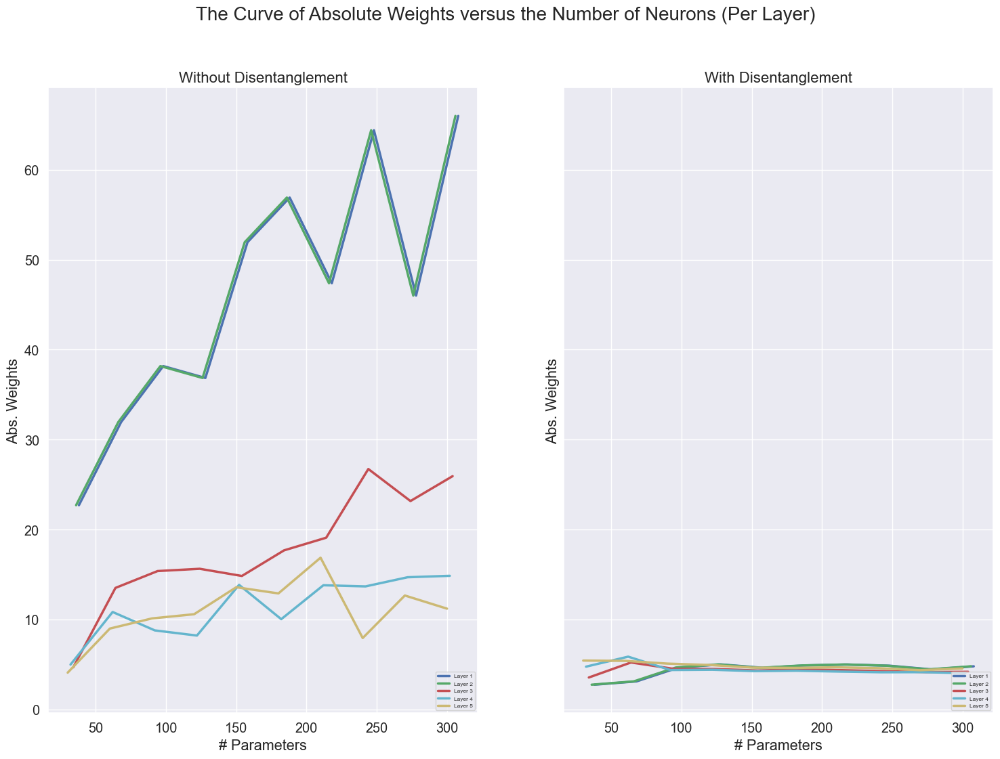

In [48]:
neurons_without_disentanglement = np.zeros((10, 5))
neurons_with_disentanglement = np.zeros((10, 5))

abs_weights_without_disentanglement = np.zeros((10, 5))
abs_weights_with_disentanglement = np.zeros((10, 5))

for i in range(10):
    for j in range(1, 6):
        abs_weights_without_disentanglement[i, j - 1] = np.power(np.sum(np.power(weights_without_disentanglement[i][j - 1], 2)) + np.sum(np.power(weights_without_disentanglement[i][j + 5], 2)), 0.5)
        neurons_without_disentanglement[i, j - 1] = len(weights_without_disentanglement[i][j])
        
        abs_weights_with_disentanglement[i, j - 1] = np.power(np.sum(np.power(weights_with_disentanglement[i][j - 1], 2)) + np.sum(np.power(weights_with_disentanglement[i][j + 5], 2)), 0.5)
        neurons_with_disentanglement[i, j - 1] = len(weights_without_disentanglement[i][j])
        
fig, axs = plt.subplots(1, 2, figsize = (18, 2 * 6), sharex = "row", sharey = "row")
fig.suptitle('The Curve of Absolute Weights versus the Number of Neurons (Per Layer)', fontsize = 20)

ax = axs[0]

ax.set_title('Without Disentanglement', fontsize = 16)

ax.set_xlabel('# Parameters')
ax.set_ylabel('Abs. Weights')

ax.plot(neurons_without_disentanglement[:, 0], abs_weights_without_disentanglement[:, 1], "-b", label = "Layer 1")
ax.plot(neurons_without_disentanglement[:, 1], abs_weights_without_disentanglement[:, 1], "-g", label = "Layer 2")
ax.plot(neurons_without_disentanglement[:, 2], abs_weights_without_disentanglement[:, 2], "-r", label = "Layer 3")
ax.plot(neurons_without_disentanglement[:, 3], abs_weights_without_disentanglement[:, 3], "-c", label = "Layer 4")
ax.plot(neurons_without_disentanglement[:, 4], abs_weights_without_disentanglement[:, 4], "-y", label = "Layer 5")

ax.legend(loc = 'lower right', fontsize = 'medium')

ax = axs[1]

ax.set_title('With Disentanglement', fontsize = 16)

ax.set_xlabel('# Parameters')
ax.set_ylabel('Abs. Weights')

ax.plot(neurons_with_disentanglement[:, 0], abs_weights_with_disentanglement[:, 1], "-b", label = "Layer 1")
ax.plot(neurons_with_disentanglement[:, 1], abs_weights_with_disentanglement[:, 1], "-g", label = "Layer 2")
ax.plot(neurons_with_disentanglement[:, 2], abs_weights_with_disentanglement[:, 2], "-r", label = "Layer 3")
ax.plot(neurons_with_disentanglement[:, 3], abs_weights_with_disentanglement[:, 3], "-c", label = "Layer 4")
ax.plot(neurons_with_disentanglement[:, 4], abs_weights_with_disentanglement[:, 4], "-y", label = "Layer 5")

ax.legend(loc = 'lower right', fontsize = 'medium')

fig.savefig('Figures/Subspace_Net/The Curve of Absolute Weights versus the Number of Neurons_Per Layer_Nonlinear_6.png', dpi=300, bbox_inches='tight')

### 2.4.3 Absolute Weights versus the Number of all Neurons <a class="anchor" id="section_2_4_3"></a>

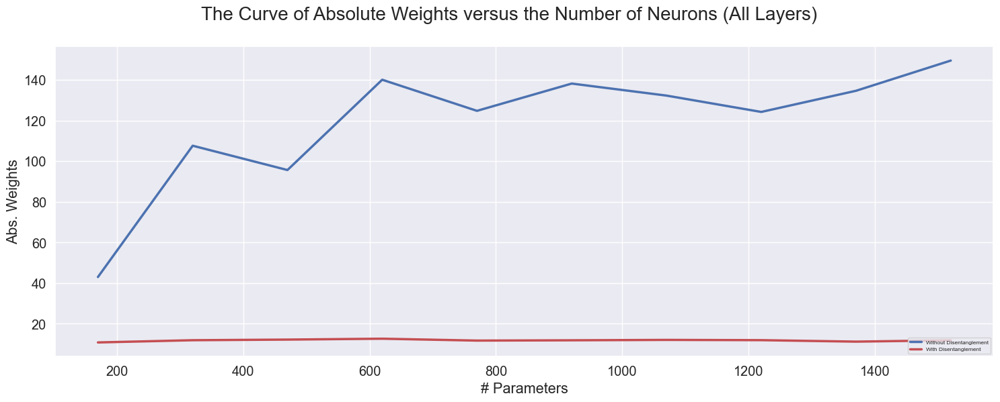

In [49]:
neurons_without_disentanglement = np.zeros(10)
neurons_with_disentanglement = np.zeros(10)

abs_weights_without_disentanglement = np.zeros(10)
abs_weights_with_disentanglement = np.zeros(10)

for i in range(10):
    for j in range(12):
        abs_weights_without_disentanglement[i] = abs_weights_without_disentanglement[i] + np.sum(np.power(weights_without_disentanglement[i][j], 2))  
        abs_weights_with_disentanglement[i] = abs_weights_with_disentanglement[i] + np.sum(np.power(weights_with_disentanglement[i][j], 2))
                                                                                                   
    abs_weights_without_disentanglement[i] = np.power(abs_weights_without_disentanglement[i], 0.5)
    abs_weights_with_disentanglement[i] = np.power(abs_weights_with_disentanglement[i], 0.5)
    
for i in range(10):
    for j in range(1, 6):
        neurons_without_disentanglement[i] = neurons_without_disentanglement[i] + len(weights_without_disentanglement[i][j])
        neurons_with_disentanglement[i] = neurons_with_disentanglement[i] + len(weights_with_disentanglement[i][j])
        
fig, axs = plt.subplots(1, 1, figsize = (18, 6))
fig.suptitle('The Curve of Absolute Weights versus the Number of Neurons (All Layers)', fontsize = 20)

ax = axs

ax.set_xlabel('# Parameters')
ax.set_ylabel('Abs. Weights')

ax.plot(neurons_without_disentanglement, abs_weights_without_disentanglement, "-b", label = "Without Disentanglement")
ax.plot(neurons_with_disentanglement, abs_weights_with_disentanglement, "-r", label = "With Disentanglement")

ax.legend(loc = 'lower right', fontsize = 'medium')

fig.savefig('Figures/Subspace_Net/The Curve of Absolute Weights versus the Number of Neurons_All Layers_Nonlinear_6.png', dpi=300, bbox_inches='tight')

### 2.4.4 Geometry Function (Method 1) <a class="anchor" id="section_2_4_4"></a>

In [50]:
P = 30

def compute_geometry(manifolds):
    # Radius, centers, subspaces
    Rs = []
    centers = []
    Us = []
    
    for manifold in tqdm(manifolds, leave=False):
        center = manifold.mean(0)
        centers.append(center)
        _, R, U = np.linalg.svd(manifold - center)
        Rs.append(R[:P])
        Us.append(U[:P])
    
    Rs = np.stack(Rs)
    centers = np.stack(centers)
    Us = np.stack(Us)
    
    # Overlaps
    K = len(manifolds)
    ss = []
    csa = []
    csb = []
    
    for a in tqdm(range(K), leave = False):
        for b in range(K):
            if a != b:
                # Center-subspace
                dx0 = centers[a] - centers[b]
                dx0hat = dx0 / np.linalg.norm(dx0)
                costheta_a = Us[a] @ dx0hat
                csa.append((costheta_a ** 2 * Rs[a] ** 2).sum() / (Rs[a] ** 2).sum())
                costheta_b = Us[b] @ dx0hat
                csb.append((costheta_b ** 2 * Rs[b] ** 2).sum() / (Rs[a] ** 2).sum())

                # Subspace-subspace
                cosphi = Us[a] @ Us[b].T
                ss_overlap = (cosphi ** 2 * Rs[a][:, None] ** 2 * Rs[b] ** 2).sum() / (Rs[a] ** 2).sum() ** 2
                ss.append(ss_overlap)
            
            else:
                csa.append(np.nan)
                csb.append(np.nan)
                ss.append(np.nan)
                
    csa = np.stack(csa).reshape(K, K)
    csb = np.stack(csb).reshape(K, K)
    ss = np.stack(ss).reshape(K, K)
    
    return Rs, Us, centers, csa, csb, ss

### 2.4.5 Building Manifolds and Calculating the Dimensionality (Method 1) <a class="anchor" id="section_2_4_5"></a>

In [51]:
import copy


for i in range(10):
    inputs_labels_without_disentanglement = np.zeros((1000, len(inputs_without_disentanglement[i][0])))
    inputs_labels_with_disentanglement = np.zeros((1000, len(inputs_without_disentanglement[i][0])))
    
    for j in range(1000):
        for k in range(len(inputs_without_disentanglement[i][j])):
            inputs_labels_without_disentanglement[j][k] = np.round(10 * inputs_without_disentanglement[i][j][k][0])
            inputs_labels_with_disentanglement[j][k] = np.round(10 * inputs_with_disentanglement[i][j][k][0])
            
    images_labels_without_disentanglement = []
    images_labels_with_disentanglement = []
    
    for j in range(-10, 10):
        images_labels_without_disentanglement_temp = []
        images_labels_with_disentanglement_temp = []
        
        for k in range(1000):
            for l in range(len(inputs_without_disentanglement[i][j])):
                if inputs_labels_without_disentanglement[k][l] == j:
                    images_labels_without_disentanglement_temp.append(images_without_disentanglement[i][k][l])
                    
                if inputs_labels_with_disentanglement[k][l] == j: 
                    images_labels_with_disentanglement_temp.append(images_with_disentanglement[i][k][l])
        
        images_labels_without_disentanglement.append(images_labels_without_disentanglement_temp)
        images_labels_with_disentanglement.append(images_labels_with_disentanglement_temp)
    
    training_manifolds_without_disentanglement_1 = []
    training_manifolds_without_disentanglement_2 = []
    training_manifolds_without_disentanglement_3 = []
    training_manifolds_without_disentanglement_4 = []
    training_manifolds_without_disentanglement_5 = []
    
    for j in range(len(images_labels_without_disentanglement)):
        training_manifolds_without_disentanglement_1_temp = []
        training_manifolds_without_disentanglement_2_temp = []
        training_manifolds_without_disentanglement_3_temp = []
        training_manifolds_without_disentanglement_4_temp = []
        training_manifolds_without_disentanglement_5_temp = []
    
        for k in range(len(images_labels_without_disentanglement[j])):            
            training_manifold_1 = images_labels_without_disentanglement[j][k]           
            
            for l in range(5):
                training_manifold_2 = 0
                
                for m in range(len(weights_without_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_without_disentanglement[i][l][m] + weights_without_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_without_disentanglement_1_temp.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_without_disentanglement_2_temp.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_without_disentanglement_3_temp.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_without_disentanglement_4_temp.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_without_disentanglement_5_temp.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
        
        if len(images_labels_without_disentanglement[j]) >= 30:
            training_manifolds_without_disentanglement_1.append(np.array(training_manifolds_without_disentanglement_1_temp)[:30])
            training_manifolds_without_disentanglement_2.append(np.array(training_manifolds_without_disentanglement_2_temp)[:30])
            training_manifolds_without_disentanglement_3.append(np.array(training_manifolds_without_disentanglement_3_temp)[:30])
            training_manifolds_without_disentanglement_4.append(np.array(training_manifolds_without_disentanglement_4_temp)[:30])
            training_manifolds_without_disentanglement_5.append(np.array(training_manifolds_without_disentanglement_5_temp)[:30])
        
    training_manifolds_with_disentanglement_1 = []
    training_manifolds_with_disentanglement_2 = []
    training_manifolds_with_disentanglement_3 = []
    training_manifolds_with_disentanglement_4 = []
    training_manifolds_with_disentanglement_5 = []
    
    for j in range(len(images_labels_with_disentanglement)):
        training_manifolds_with_disentanglement_1_temp = []
        training_manifolds_with_disentanglement_2_temp = []
        training_manifolds_with_disentanglement_3_temp = []
        training_manifolds_with_disentanglement_4_temp = []
        training_manifolds_with_disentanglement_5_temp = []
    
        for k in range(len(images_labels_with_disentanglement[j])):            
            training_manifold_1 = images_labels_with_disentanglement[j][k]           
            
            for l in range(5):
                training_manifold_2 = 0 
                
                for m in range(len(weights_with_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_with_disentanglement[i][l][m] + weights_with_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_with_disentanglement_1_temp.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_with_disentanglement_2_temp.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_with_disentanglement_3_temp.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_with_disentanglement_4_temp.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_with_disentanglement_5_temp.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
                
        if len(images_labels_with_disentanglement[j]) >= 30:
            training_manifolds_with_disentanglement_1.append(np.array(training_manifolds_with_disentanglement_1_temp)[:30])
            training_manifolds_with_disentanglement_2.append(np.array(training_manifolds_with_disentanglement_2_temp)[:30])
            training_manifolds_with_disentanglement_3.append(np.array(training_manifolds_with_disentanglement_3_temp)[:30])
            training_manifolds_with_disentanglement_4.append(np.array(training_manifolds_with_disentanglement_4_temp)[:30])
            training_manifolds_with_disentanglement_5.append(np.array(training_manifolds_with_disentanglement_5_temp)[:30])
            
    for j in range(len(training_manifolds_without_disentanglement_1)):
        training_manifolds_without_disentanglement_1[j] = training_manifolds_without_disentanglement_1[j].T
        training_manifolds_without_disentanglement_2[j] = training_manifolds_without_disentanglement_2[j].T
        training_manifolds_without_disentanglement_3[j] = training_manifolds_without_disentanglement_3[j].T
        training_manifolds_without_disentanglement_4[j] = training_manifolds_without_disentanglement_4[j].T
        training_manifolds_without_disentanglement_5[j] = training_manifolds_without_disentanglement_5[j].T
    
    training_manifolds_without_disentanglement_1 = np.array(training_manifolds_without_disentanglement_1)
    training_manifolds_without_disentanglement_2 = np.array(training_manifolds_without_disentanglement_2)
    training_manifolds_without_disentanglement_3 = np.array(training_manifolds_without_disentanglement_3)
    training_manifolds_without_disentanglement_4 = np.array(training_manifolds_without_disentanglement_4)
    training_manifolds_without_disentanglement_5 = np.array(training_manifolds_without_disentanglement_5)

    for j in range(len(training_manifolds_with_disentanglement_1)):
        training_manifolds_with_disentanglement_1[j] = training_manifolds_with_disentanglement_1[j].T
        training_manifolds_with_disentanglement_2[j] = training_manifolds_with_disentanglement_2[j].T
        training_manifolds_with_disentanglement_3[j] = training_manifolds_with_disentanglement_3[j].T
        training_manifolds_with_disentanglement_4[j] = training_manifolds_with_disentanglement_4[j].T
        training_manifolds_with_disentanglement_5[j] = training_manifolds_with_disentanglement_5[j].T
    
    training_manifolds_with_disentanglement_1 = np.array(training_manifolds_with_disentanglement_1)
    training_manifolds_with_disentanglement_2 = np.array(training_manifolds_with_disentanglement_2)
    training_manifolds_with_disentanglement_3 = np.array(training_manifolds_with_disentanglement_3)
    training_manifolds_with_disentanglement_4 = np.array(training_manifolds_with_disentanglement_4)
    training_manifolds_with_disentanglement_5 = np.array(training_manifolds_with_disentanglement_5)
    
    training_manifolds_without_disentanglement_final = []
    training_manifolds_with_disentanglement_final = []

    training_manifolds_without_disentanglement_final.append(training_manifolds_without_disentanglement_1)
    training_manifolds_without_disentanglement_final.append(training_manifolds_without_disentanglement_2)
    training_manifolds_without_disentanglement_final.append(training_manifolds_without_disentanglement_3)
    training_manifolds_without_disentanglement_final.append(training_manifolds_without_disentanglement_4)
    training_manifolds_without_disentanglement_final.append(training_manifolds_without_disentanglement_5)

    training_manifolds_with_disentanglement_final.append(training_manifolds_with_disentanglement_1)
    training_manifolds_with_disentanglement_final.append(training_manifolds_with_disentanglement_2)
    training_manifolds_with_disentanglement_final.append(training_manifolds_with_disentanglement_3)
    training_manifolds_with_disentanglement_final.append(training_manifolds_with_disentanglement_4)
    training_manifolds_with_disentanglement_final.append(training_manifolds_with_disentanglement_5)
    
    Rs_all_without_disentanglement = []
    Us_all_without_disentanglement = [] 
    centers_all_without_disentanglement = []
    csa_all_without_disentanglement = []
    csb_all_without_disentanglement = []
    ss_all_without_disentanglement = []
        
    for j in range(5):
        manifolds = training_manifolds_without_disentanglement_final[j]
        Rs, Us, centers, csa, csb, ss = compute_geometry(manifolds)
            
        Rs_all_without_disentanglement.append(Rs)
        Us_all_without_disentanglement.append(Us)
        centers_all_without_disentanglement.append(centers)
        csa_all_without_disentanglement.append(csa)
        csb_all_without_disentanglement.append(csb)
        ss_all_without_disentanglement.append(ss)
    
    Rs_all_without_disentanglement = np.stack(Rs_all_without_disentanglement)
    Ds_without_disentanglement = (Rs_all_without_disentanglement ** 2).sum(-1) ** 2 / (Rs_all_without_disentanglement ** 4).sum(-1)              

    scipy.io.savemat('Figures/Subspace_Net/Ds_without_disentanglement_deep_nonlinear_factor_6_method1_' + str(i) + '.mat', mdict = {'Ds': Ds_without_disentanglement})
        
    Rs_all_with_disentanglement = []
    Us_all_with_disentanglement = [] 
    centers_all_with_disentanglement = []
    csa_all_with_disentanglement = []
    csb_all_with_disentanglement = []
    ss_all_with_disentanglement = []
        
    for j in range(5):
        manifolds = training_manifolds_with_disentanglement_final[j]
        Rs, Us, centers, csa, csb, ss = compute_geometry(manifolds)
            
        Rs_all_with_disentanglement.append(Rs)
        Us_all_with_disentanglement.append(Us)
        centers_all_with_disentanglement.append(centers)
        csa_all_with_disentanglement.append(csa)
        csb_all_with_disentanglement.append(csb)
        ss_all_with_disentanglement.append(ss)
    
    Rs_all_with_disentanglement = np.stack(Rs_all_with_disentanglement)
    Ds_with_disentanglement = (Rs_all_with_disentanglement ** 2).sum(-1) ** 2 / (Rs_all_with_disentanglement ** 4).sum(-1)              

    scipy.io.savemat('Figures/Subspace_Net/Ds_with_disentanglement_deep_nonlinear_factor_6_method1_' + str(i) + '.mat', mdict = {'Ds': Ds_with_disentanglement})

C:\Users\Lion\AppData\Local\Temp\ipykernel_4932\114023685.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for manifold in tqdm(manifolds, leave=False):


  0%|          | 0/14 [00:00<?, ?it/s]

C:\Users\Lion\AppData\Local\Temp\ipykernel_4932\114023685.py:26: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for a in tqdm(range(K), leave = False):


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

### 2.4.6 Plotting the Dimensionality across Layers (Method 1) <a class="anchor" id="section_2_4_6"></a>

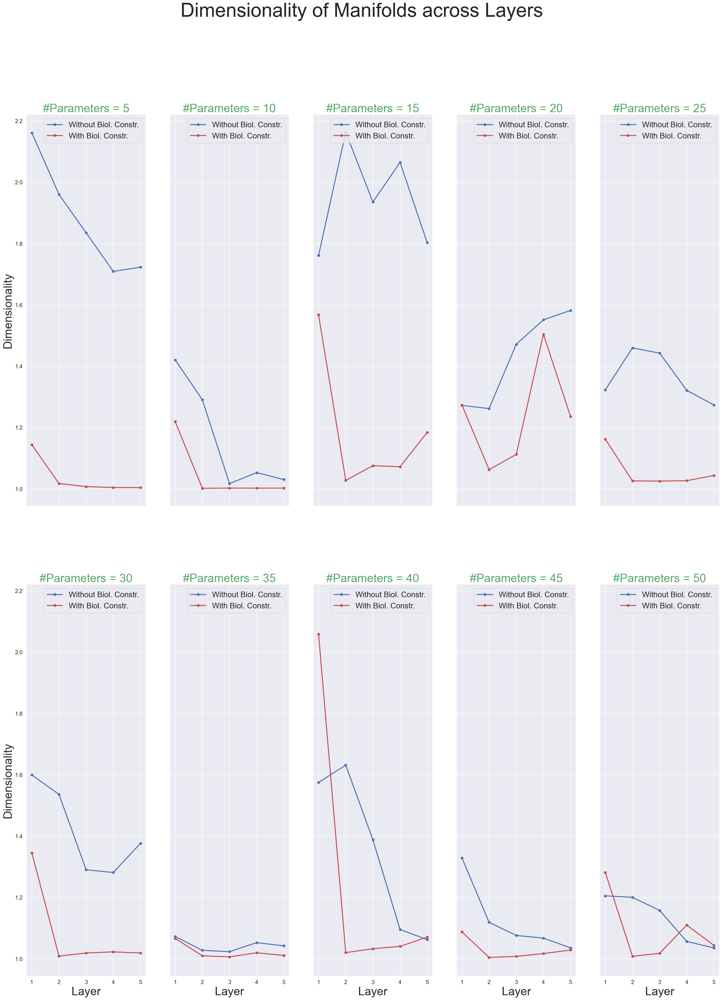

In [52]:
fig, axs = plt.subplots(2, 5, figsize = (2 * 16, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('Dimensionality of Manifolds across Layers', fontsize = 50)

parameters = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

for i in range(10):
    if i < 5:
        ax = axs[0, i]
    elif i >= 5:
        ax = axs[1, i - 5]
        ax.set_xlabel('Layer', fontsize = 30)
        
    if i == 0 or i == 5:
        ax.set_ylabel('Dimensionality', fontsize = 30)
        
    ax.set_title('#Parameters = ' + str(parameters[i]), fontsize = 30, color = 'g')
    
    Ds_without_disentanglement = scipy.io.loadmat('Figures/Subspace_Net/Ds_without_disentanglement_deep_nonlinear_factor_6_method1_' + str(i) + '.mat')['Ds']
    Ds_with_disentanglement = scipy.io.loadmat('Figures/Subspace_Net/Ds_with_disentanglement_deep_nonlinear_factor_6_method1_' + str(i) + '.mat')['Ds']

    ax.plot(range(1, 6), Ds_without_disentanglement.mean(-1), "-ob", label = "Without Biol. Constr.")
    ax.plot(range(1, 6), Ds_with_disentanglement.mean(-1), "-or", label = "With Biol. Constr.")
    
    ax.legend(loc = 'upper right', fontsize = 20)
                        
fig.savefig('Figures/Subspace_Net/Dimensionality of Manifolds across Layers_Nonlinear_6_Method1.png')

### 2.4.7 Geometry Function (Method 2) <a class="anchor" id="section_2_4_7"></a>

In [53]:
import numpy as np
from scipy.stats import pearsonr
from sklearn import linear_model

                     
def intrinsic_dimension(X, fraction = 0.9, verbose = False):    
    """
        Estimates the intrinsic dimension of a system of points from the matrix of their distances X
        
        Args:
        X: 2-D Matrix X (n, n) where n is the number of points
        fraction: fraction of the data considered for the dimensionality estimation (default: fraction = 0.9)
        
        Returns:            
        x: log(mu)    (*)
        y: - (1 - F(mu)) (*)
        reg: linear regression y ~ x structure obtained with scipy.stats.linregress
        (reg.slope is the intrinsic dimension estimate)
        r: determination coefficient of y ~ x
        pval: p-value of y ~ x
            
        (*) See cited paper for description
        
        Usage:
        _, _, reg, r, pval = estimate(X, fraction = 0.85)
            
        The technique is described in:          
        "Estimating the intrinsic dimension of datasets by a minimal neighborhood information"       
        Authors: Elena Facco, Maria d’Errico, Alex Rodriguez & Alessandro Laio        
        Scientific Reports 7, Article number: 12140 (2017)
        doi:10.1038/s41598-017-11873-y  
    """             
     
    # Sort distance matrix
    Y = np.sort(X, axis = 1, kind = 'quicksort')

    # Clean data
    k1 = Y[:, 1]
    k2 = Y[:, 2]

    zeros = np.where(k1 == 0)[0]
    
    if verbose:
        print('Found n. {} elements for which r1 = 0'.format(zeros.shape[0]))
        print(zeros)

    degeneracies = np.where(k1 == k2)[0]
    
    if verbose:
        print('Found n. {} elements for which r1 = r2'.format(degeneracies.shape[0]))
        print(degeneracies)

    good = np.setdiff1d(np.arange(Y.shape[0]), np.array(zeros))
    good = np.setdiff1d(good, np.array(degeneracies))
    
    if verbose:
        print('Fraction good points: {}'.format(good.shape[0] / Y.shape[0]))
    
    k1 = k1[good]
    k2 = k2[good]    
    
    # Number of points to consider for the linear regression
    npoints = int(np.floor(good.shape[0] * fraction))

    # Define mu and Femp
    N = good.shape[0]
    mu = np.sort(np.divide(k2, k1), axis = None, kind = 'quicksort')
    Femp = (np.arange(1, N + 1, dtype = np.float64)) / N
    
    # Take logs (leave out the last element because 1 - Femp is zero there)
    x = np.log(mu[:-2])
    y = - np.log(1 - Femp[:-2])

    # Regression
    regr = linear_model.LinearRegression(fit_intercept = False)
    
    if x.shape[0] > 0:
        regr.fit(x[0:npoints, np.newaxis], y[0:npoints, np.newaxis]) 
        r, pval = pearsonr(x[0:npoints], y[0:npoints])        
        return x, y, regr.coef_[0][0], r, pval 
    
    elif x.shape[0] == 0:
        return x, y, 0.0, 0.0, 0.0

### 2.4.8 Building Manifolds and Calculating the Dimensionality (Method 2) <a class="anchor" id="section_2_4_8"></a>

In [54]:
import copy
from scipy.spatial.distance import pdist, squareform


for i in range(10):
    training_manifolds_without_disentanglement_1 = []
    training_manifolds_without_disentanglement_2 = []
    training_manifolds_without_disentanglement_3 = []
    training_manifolds_without_disentanglement_4 = []
    training_manifolds_without_disentanglement_5 = []
    
    for j in range(10):
        for k in range(len(images_without_disentanglement[i][j])):

            training_manifold_1 = images_without_disentanglement[i][j][k]           
            
            for l in range(5):
                training_manifold_2 = 0
                
                for m in range(len(weights_without_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_without_disentanglement[i][l][m] + weights_without_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_without_disentanglement_1.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_without_disentanglement_2.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_without_disentanglement_3.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_without_disentanglement_4.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_without_disentanglement_5.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
                
    training_manifolds_with_disentanglement_1 = []
    training_manifolds_with_disentanglement_2 = []
    training_manifolds_with_disentanglement_3 = []
    training_manifolds_with_disentanglement_4 = []
    training_manifolds_with_disentanglement_5 = []
    
    for j in range(10):
        for k in range(len(images_with_disentanglement[i][j])):

            training_manifold_1 = images_with_disentanglement[i][j][k]           
            
            for l in range(5):
                training_manifold_2 = 0
                
                for m in range(len(weights_with_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_with_disentanglement[i][l][m] + weights_with_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_with_disentanglement_1.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_with_disentanglement_2.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_with_disentanglement_3.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_with_disentanglement_4.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_with_disentanglement_5.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
    
    training_manifolds_without_disentanglement_1_final = np.array(training_manifolds_without_disentanglement_1)
    training_manifolds_without_disentanglement_2_final = np.array(training_manifolds_without_disentanglement_2)
    training_manifolds_without_disentanglement_3_final = np.array(training_manifolds_without_disentanglement_3)
    training_manifolds_without_disentanglement_4_final = np.array(training_manifolds_without_disentanglement_4)
    training_manifolds_without_disentanglement_5_final = np.array(training_manifolds_without_disentanglement_5)
    
    training_manifolds_with_disentanglement_1_final = np.array(training_manifolds_with_disentanglement_1)
    training_manifolds_with_disentanglement_2_final = np.array(training_manifolds_with_disentanglement_2)
    training_manifolds_with_disentanglement_3_final = np.array(training_manifolds_with_disentanglement_3)
    training_manifolds_with_disentanglement_4_final = np.array(training_manifolds_with_disentanglement_4)
    training_manifolds_with_disentanglement_5_final = np.array(training_manifolds_with_disentanglement_5)
                    
    intrinsic_dimension_without_disentanglement = []
    intrinsic_dimension_with_disentanglement = [] 
    
    intrinsic_dimension_without_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_without_disentanglement_1_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_without_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_without_disentanglement_2_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_without_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_without_disentanglement_3_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_without_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_without_disentanglement_4_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_without_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_without_disentanglement_5_final), 'euclidean'), fraction = 1.0)[2])
    
    intrinsic_dimension_without_disentanglement = np.array(intrinsic_dimension_without_disentanglement)
    
    scipy.io.savemat('Figures/Subspace_Net/Ds_without_disentanglement_deep_nonlinear_factor_6_method2_' + str(i) + '.mat', mdict = {'Ds': intrinsic_dimension_without_disentanglement})
    
    intrinsic_dimension_with_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_with_disentanglement_1_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_with_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_with_disentanglement_2_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_with_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_with_disentanglement_3_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_with_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_with_disentanglement_4_final), 'euclidean'), fraction = 1.0)[2])
    intrinsic_dimension_with_disentanglement.append(intrinsic_dimension(squareform(pdist(training_manifolds_with_disentanglement_5_final), 'euclidean'), fraction = 1.0)[2])
    
    intrinsic_dimension_with_disentanglement = np.array(intrinsic_dimension_with_disentanglement)
    
    scipy.io.savemat('Figures/Subspace_Net/Ds_with_disentanglement_deep_nonlinear_factor_6_method2_' + str(i) + '.mat', mdict = {'Ds': intrinsic_dimension_with_disentanglement})

### 2.4.9 Plotting the Dimensionality across Layers (Method 2) <a class="anchor" id="section_2_4_9"></a>

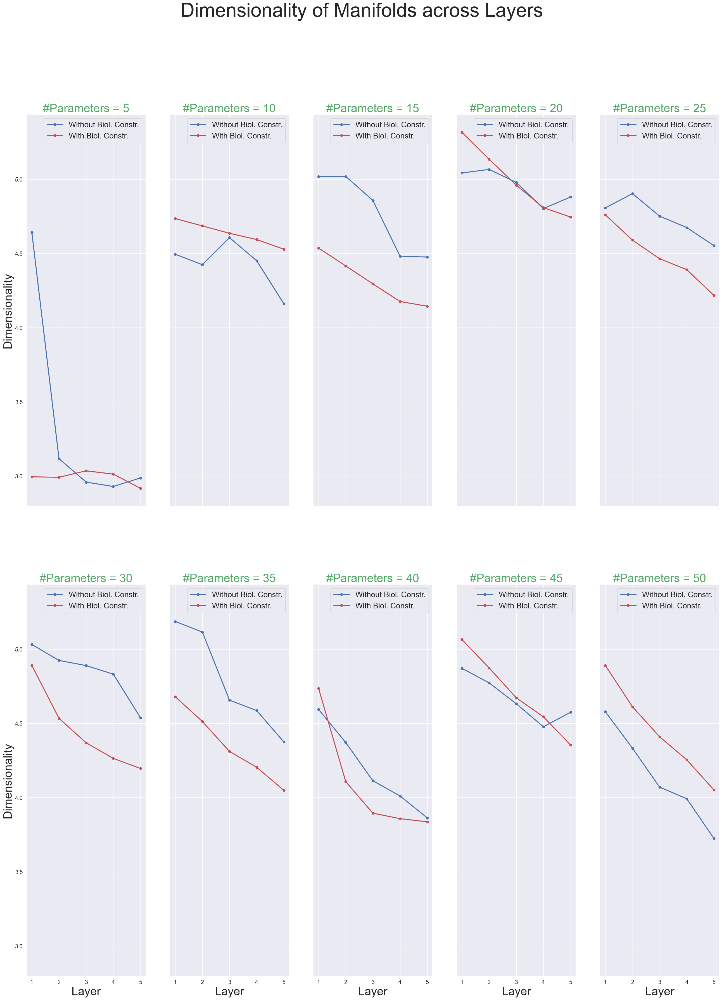

In [55]:
fig, axs = plt.subplots(2, 5, figsize = (2 * 16, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('Dimensionality of Manifolds across Layers', fontsize = 50)

parameters = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

for i in range(10):
    if i < 5:
        ax = axs[0, i]
    elif i >= 5:
        ax = axs[1, i - 5]
        ax.set_xlabel('Layer', fontsize = 30)
        
    if i == 0 or i == 5:
        ax.set_ylabel('Dimensionality', fontsize = 30)
        
    ax.set_title('#Parameters = ' + str(parameters[i]), fontsize = 30, color = 'g')
    
    Ds_without_disentanglement = scipy.io.loadmat('Figures/Subspace_Net/Ds_without_disentanglement_deep_nonlinear_factor_6_method2_' + str(i) + '.mat')['Ds']
    Ds_with_disentanglement = scipy.io.loadmat('Figures/Subspace_Net/Ds_with_disentanglement_deep_nonlinear_factor_6_method2_' + str(i) + '.mat')['Ds']

    ax.plot(range(1, 6), Ds_without_disentanglement.squeeze(0), "-ob", label = "Without Biol. Constr.")
    ax.plot(range(1, 6), Ds_with_disentanglement.squeeze(0), "-or", label = "With Biol. Constr.")
    
    ax.legend(loc = 'upper right', fontsize = 20)
                        
fig.savefig('Figures/Subspace_Net/Dimensionality of Manifolds across Layers_Nonlinear_6_Method2.png')

### 2.4.10 Functions for Computing Sample Efficient Learning Curves <a class="anchor" id="section_2_4_10"></a>

In [56]:
from cycler import cycler
import matplotlib as mpl
import pdb
import scipy as sp
import scipy.io
import scipy.optimize
from scipy.sparse.linalg import eigsh
import scipy.stats as stats
import skimage
from skimage import filters as filt
from skimage import transform
from sklearn.decomposition import PCA
import time

mpl.rcParams['axes.prop_cycle'] = cycler(color = 'bgrcmyk')

# import decoder
myfont = 6
myaxis_font = 8
plt.rcParams.update({'font.size': myfont})
line_width = 1


def f(z, *args):
    p, spectrum, lamb = args
    
    return z - lamb - z * np.sum(spectrum / (p * spectrum + z))


def fp(z, *args):
    p, spectrum, lamb = args
    
    return 1 - np.sum( spectrum / (p * spectrum + z)) + np.sum(spectrum / (p * spectrum + z) ** 2)


def solve_implicit(pvals, spectrum, lamb):
    zvals = np.zeros(len(pvals))
    
    for i, p in enumerate(pvals):
        args = (p, spectrum, lamb)
        zvals[i] = sp.optimize.root_scalar(f = f, method = 'newton', fprime = fp, x0 = 2 * np.sum(spectrum) + 2 * lamb, args = args).root
    
    return zvals


def gamma_fn(pvals, zvals, spectrum):
    all_vals = np.zeros(len(pvals))
    
    for i, p in enumerate(pvals):
        all_vals[i] = p * np.sum(spectrum ** 2 / (spectrum * p + zvals[i]) ** 2)
    
    return all_vals


def mode_errs(pvals, spectrum, teacher, lamb):
    zvals = solve_implicit(pvals, spectrum, lamb)
    gamma = gamma_fn(pvals, zvals, spectrum)
    err = np.zeros((len(spectrum), len(pvals)))
    
    for j in range(len(spectrum)):    
        lamb_j = spectrum[j]
        teacher_weights_j = teacher[j]
        err[j, :] = zvals ** 2 / (1 - gamma) * teacher_weights_j / (lamb_j * pvals + zvals) ** 2
        
        # if j == len(spectrum) - 1:
            # plt.loglog(pvals[0:10], err[0:10])
            # plt.show()
    
    return err


def sorted_spectral_decomp(resp, imgs = None):
    K = 1 / resp.shape[1] * resp @ resp.T
    s, v = np.linalg.eigh(K)
    indsort = np.argsort(s)[::-1]
    s = s[indsort]
    v = v[:, indsort]
    
    return K, s, v


def compute_learning_curves(K, y, pvals, lamb):
    # coeffs = 1 / K.shape[0] * (u.T @ y) ** 2
    # theory_lc = mode_errs(pvals, s, coeffs, lamb).sum(axis = 0)
    
    num_repeats = 5
    err_expt = np.zeros((len(pvals), num_repeats))
    
    for n in range(num_repeats):
        for i, p in enumerate(pvals):
            inds = np.random.choice(K.shape[0], p, replace = True)
            # test_i = permed[p:permed.shape[0]]
            
            Ki = K[inds, :]
            Kii = Ki[:, inds]
            # K_test = Ki[:, test_i]
            
            print(Ki.shape)
            yi = y[inds, :]
            yhat = Ki.T @ np.linalg.solve(Kii + 1 / K.shape[0] * lamb * np.eye(p), yi)
            err_expt[i, n] = np.sum((y - yhat) ** 2)
    
    return err_expt, yhat


def get_all_task_info(resp, y, pvals, ptheory):
    # K = 1 / resp.shape[1] * resp @ resp.T
    K, s, vec = sorted_spectral_decomp(resp)
    lamb = np.trace(K)
    teacher = np.sum((vec.T @ y) ** 2, axis = 1)
    err_expt, yhat = compute_learning_curves(K, y, pvals, lamb)
    theory = mode_errs(ptheory, s, teacher, lamb)
    
    return err_expt, theory, s, teacher, yhat

### 2.4.11 Calculating of Sample Efficient Learning Curves <a class="anchor" id="section_2_4_11"></a>

In [57]:
import copy


for i in range(10):
    training_manifolds_without_disentanglement_0 = []
    training_manifolds_without_disentanglement_1 = []
    training_manifolds_without_disentanglement_2 = []
    training_manifolds_without_disentanglement_3 = []
    training_manifolds_without_disentanglement_4 = []
    training_manifolds_without_disentanglement_5 = []
    
    for j in range(10):
        for k in range(len(images_without_disentanglement[i][j])):
            training_manifolds_without_disentanglement_0.append(images_without_disentanglement[i][j][k])
            training_manifold_1 = images_without_disentanglement[i][j][k]           
            
            for l in range(5):
                training_manifold_2 = 0
                
                for m in range(len(weights_without_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_without_disentanglement[i][l][m] + weights_without_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_without_disentanglement_1.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_without_disentanglement_2.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_without_disentanglement_3.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_without_disentanglement_4.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_without_disentanglement_5.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
                
    training_manifolds_with_disentanglement_0 = []
    training_manifolds_with_disentanglement_1 = []
    training_manifolds_with_disentanglement_2 = []
    training_manifolds_with_disentanglement_3 = []
    training_manifolds_with_disentanglement_4 = []
    training_manifolds_with_disentanglement_5 = []
    
    for j in range(10):
        for k in range(len(images_with_disentanglement[i][j])):
            training_manifolds_with_disentanglement_0.append(images_with_disentanglement[i][j][k])
            training_manifold_1 = images_with_disentanglement[i][j][k]           
            
            for l in range(5):
                training_manifold_2 = 0
                
                for m in range(len(weights_with_disentanglement[i][l])):
                    training_manifold_2 = training_manifold_2 + training_manifold_1[m] * weights_with_disentanglement[i][l][m] + weights_with_disentanglement[i][l + 6]
                
                if l == 0:
                    training_manifolds_with_disentanglement_1.append(training_manifold_2)
                elif l == 1:
                    training_manifolds_with_disentanglement_2.append(training_manifold_2)
                elif l == 2:
                    training_manifolds_with_disentanglement_3.append(training_manifold_2)
                elif l == 3:
                    training_manifolds_with_disentanglement_4.append(training_manifold_2)
                elif l == 4:
                    training_manifolds_with_disentanglement_5.append(training_manifold_2)
                                    
                training_manifold_1 = copy.copy(training_manifold_2)
    
    training_manifolds_without_disentanglement_0_final = np.array(training_manifolds_without_disentanglement_0)
    training_manifolds_without_disentanglement_1_final = np.array(training_manifolds_without_disentanglement_1)
    training_manifolds_without_disentanglement_2_final = np.array(training_manifolds_without_disentanglement_2)
    training_manifolds_without_disentanglement_3_final = np.array(training_manifolds_without_disentanglement_3)
    training_manifolds_without_disentanglement_4_final = np.array(training_manifolds_without_disentanglement_4)
    training_manifolds_without_disentanglement_5_final = np.array(training_manifolds_without_disentanglement_5)
    
    training_manifolds_with_disentanglement_0_final = np.array(training_manifolds_with_disentanglement_0)
    training_manifolds_with_disentanglement_1_final = np.array(training_manifolds_with_disentanglement_1)
    training_manifolds_with_disentanglement_2_final = np.array(training_manifolds_with_disentanglement_2)
    training_manifolds_with_disentanglement_3_final = np.array(training_manifolds_with_disentanglement_3)
    training_manifolds_with_disentanglement_4_final = np.array(training_manifolds_with_disentanglement_4)
    training_manifolds_with_disentanglement_5_final = np.array(training_manifolds_with_disentanglement_5)
    
    all_err_layers_without_disentanglement = []
    all_theory_layers_without_disentanglement = []
    all_vk_layers_without_disentanglement = []
    
    for j in range(5):
        y_fourier = training_manifolds_without_disentanglement_0_final / np.sqrt(np.sum(training_manifolds_without_disentanglement_0_final ** 2))
            
        pvals = np.logspace(0, 3.0, 8).astype('int')
        ptheory = np.logspace(0, 3.5, 40)
        
        if j == 0:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_without_disentanglement_1_final, y_fourier, pvals, ptheory)
        elif j == 1:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_without_disentanglement_2_final, y_fourier, pvals, ptheory)
        elif j == 2:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_without_disentanglement_3_final, y_fourier, pvals, ptheory)
        elif j == 3:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_without_disentanglement_4_final, y_fourier, pvals, ptheory)
        elif j == 4:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_without_disentanglement_5_final, y_fourier, pvals, ptheory)
        
        all_err_layers_without_disentanglement += [err]
        all_theory_layers_without_disentanglement += [theory]
        all_vk_layers_without_disentanglement += [vk]
            
    scipy.io.savemat('Figures/Subspace_Net/pvals.mat', mdict = {'pvals': pvals})
    scipy.io.savemat('Figures/Subspace_Net/ptheory.mat', mdict = {'ptheory': ptheory})
            
    scipy.io.savemat('Figures/Subspace_Net/all_err_layers_without_disentanglement_Nonlinear_6_' + str(i) + '.mat', mdict = {'err': all_err_layers_without_disentanglement})
    scipy.io.savemat('Figures/Subspace_Net/all_theory_layers_without_disentanglement_Nonlinear_6_' + str(i) + '.mat', mdict = {'theory': all_theory_layers_without_disentanglement})  
    scipy.io.savemat('Figures/Subspace_Net/all_vk_layers_without_disentanglement_Nonlinear_6_' + str(i) + '.mat', mdict = {'vk': all_vk_layers_without_disentanglement})
    
    all_err_layers_with_disentanglement = []
    all_theory_layers_with_disentanglement = []
    all_vk_layers_with_disentanglement = []
    
    for j in range(5):
        y_fourier = training_manifolds_with_disentanglement_0_final / np.sqrt(np.sum(training_manifolds_with_disentanglement_0_final ** 2))
            
        pvals = np.logspace(0, 3.0, 8).astype('int')
        ptheory = np.logspace(0, 3.5, 40)
        
        if j == 0:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_with_disentanglement_1_final, y_fourier, pvals, ptheory)
        elif j == 1:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_with_disentanglement_2_final, y_fourier, pvals, ptheory)
        elif j == 2:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_with_disentanglement_3_final, y_fourier, pvals, ptheory)
        elif j == 3:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_with_disentanglement_4_final, y_fourier, pvals, ptheory)
        elif j == 4:
            err, theory, s_fourier, vk, yhat = get_all_task_info(training_manifolds_with_disentanglement_5_final, y_fourier, pvals, ptheory)
        
        all_err_layers_with_disentanglement += [err]
        all_theory_layers_with_disentanglement += [theory]
        all_vk_layers_with_disentanglement += [vk]
            
    scipy.io.savemat('Figures/Subspace_Net/pvals.mat', mdict = {'pvals': pvals})
    scipy.io.savemat('Figures/Subspace_Net/ptheory.mat', mdict = {'ptheory': ptheory})
            
    scipy.io.savemat('Figures/Subspace_Net/all_err_layers_with_disentanglement_Nonlinear_6_' + str(i) + '.mat', mdict = {'err': all_err_layers_with_disentanglement})
    scipy.io.savemat('Figures/Subspace_Net/all_theory_layers_with_disentanglement_Nonlinear_6_' + str(i) + '.mat', mdict = {'theory': all_theory_layers_with_disentanglement})  
    scipy.io.savemat('Figures/Subspace_Net/all_vk_layers_with_disentanglement_Nonlinear_6_' + str(i) + '.mat', mdict = {'vk': all_vk_layers_with_disentanglement})

(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(

(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(

(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280

(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(

(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280

(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(7, 1280)
(19, 1280)
(51, 1280)
(138, 1280)
(372, 1280)
(1000, 1280)
(1, 1280)
(2, 1280)
(

### 2.4.12 Plotting of Sample Efficient Learning Curves <a class="anchor" id="section_2_4_12"></a>

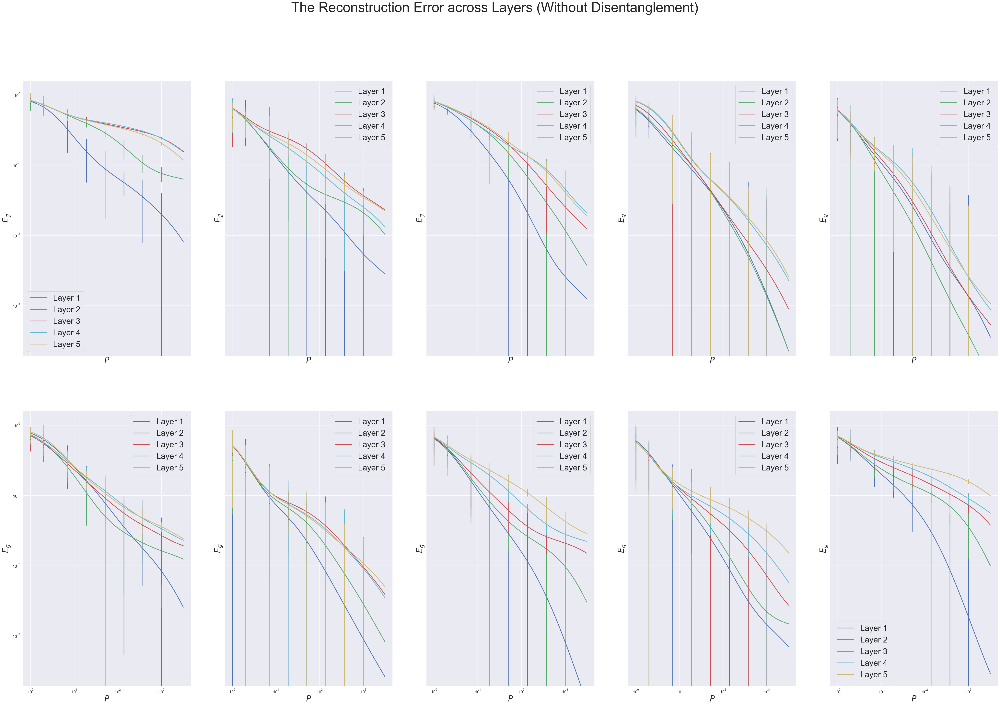

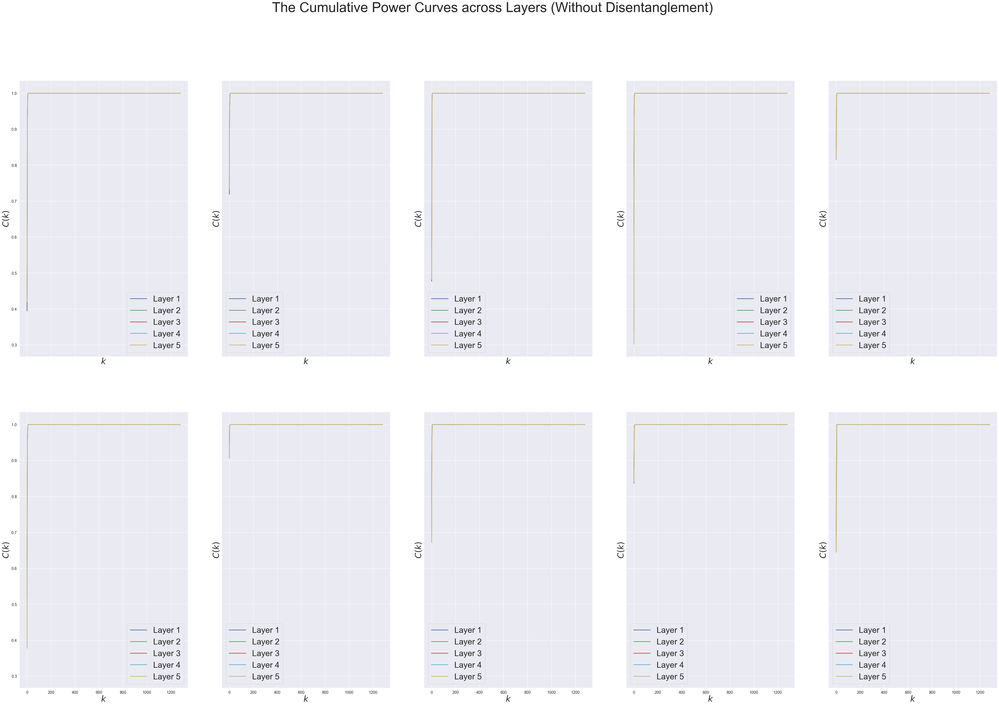

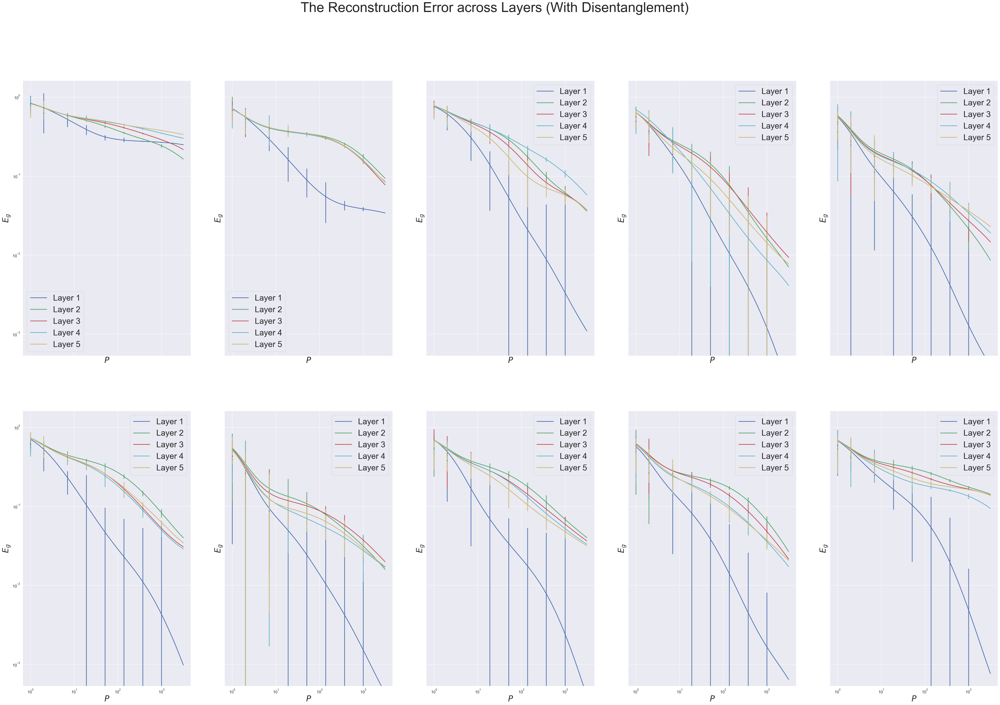

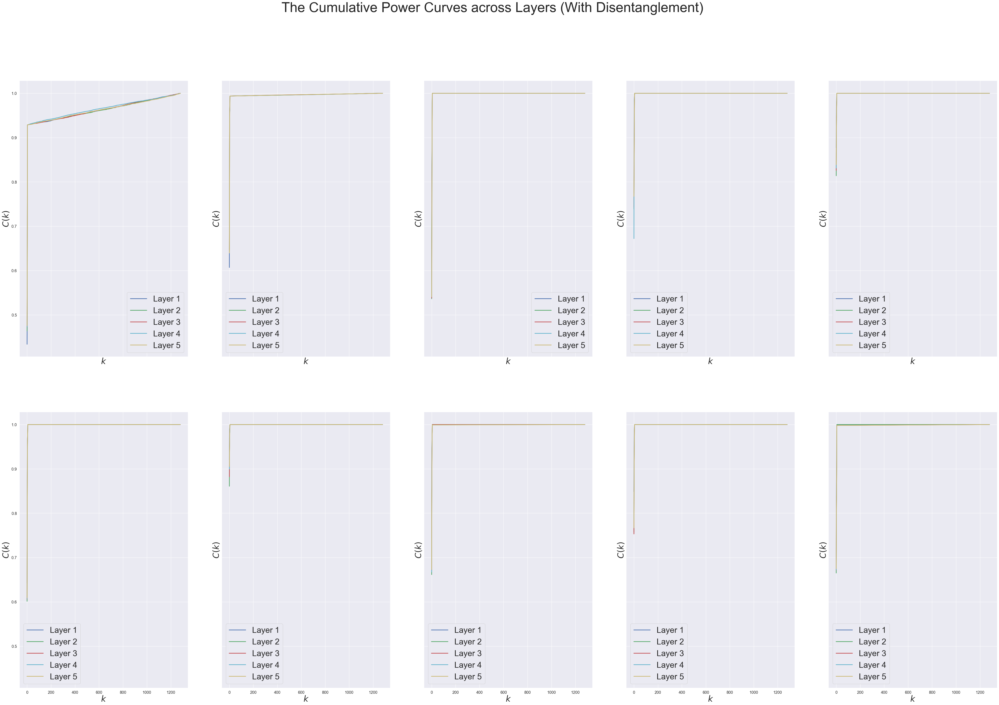

In [58]:
fig, axs = plt.subplots(2, 5, figsize = (2 * 32, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('The Reconstruction Error across Layers (Without Disentanglement)', fontsize = 50)

for i in range(10):            
    if i < 5:
        ax = axs[0, i]
    if i >= 5:
        ax = axs[1, i - 5]
        
    pvals = scipy.io.loadmat('Figures/Subspace_Net/pvals.mat')['pvals']
    ptheory = scipy.io.loadmat('Figures/Subspace_Net/ptheory.mat')['ptheory']
            
    err = scipy.io.loadmat('Figures/Subspace_Net/all_err_layers_without_disentanglement_Nonlinear_6_' + str(i) + '.mat')['err']
    theory = scipy.io.loadmat('Figures/Subspace_Net/all_theory_layers_without_disentanglement_Nonlinear_6_' + str(i) + '.mat')['theory'] 
    vk = scipy.io.loadmat('Figures/Subspace_Net/all_vk_layers_without_disentanglement_Nonlinear_6_' + str(i) + '.mat')['vk']
    
    color_array = ['b', 'g', 'r', 'c', 'y']
    label_array = ['Layer 1', 'Layer 2', 'Layer 3', 'Layer 4', 'Layer 5']
    
    for j in range(5):
        ax.loglog(ptheory.squeeze(0), theory[j].sum(axis = 0), color = color_array[j], label = label_array[j])
        ax.errorbar(pvals.squeeze(0), err[j].mean(axis = 1), err[j].std(axis = 1) / err[j].mean(axis = 1), fmt = 'o', markersize = 2.5, color = color_array[j])
            
    ax.legend(fontsize = 30)
    ax.set_xlabel(r'$P$', fontsize = 30)
    ax.set_ylabel(r'$E_g$', fontsize = 30)

fig.savefig('Figures/Subspace_Net/The Reconstruction Error across Layers (Without Disentanglement)_Nonlinear_6.png')

fig, axs = plt.subplots(2, 5, figsize = (2 * 32, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('The Cumulative Power Curves across Layers (Without Disentanglement)', fontsize = 50)

for i in range(10):            
    if i < 5:
        ax = axs[0, i]
    if i >= 5:
        ax = axs[1, i - 5]
        
    pvals = scipy.io.loadmat('Figures/Subspace_Net/pvals.mat')['pvals']
    ptheory = scipy.io.loadmat('Figures/Subspace_Net/ptheory.mat')['ptheory']
            
    err = scipy.io.loadmat('Figures/Subspace_Net/all_err_layers_without_disentanglement_Nonlinear_6_' + str(i) + '.mat')['err']
    theory = scipy.io.loadmat('Figures/Subspace_Net/all_theory_layers_without_disentanglement_Nonlinear_6_' + str(i) + '.mat')['theory'] 
    vk = scipy.io.loadmat('Figures/Subspace_Net/all_vk_layers_without_disentanglement_Nonlinear_6_' + str(i) + '.mat')['vk']
    
    color_array = ['b', 'g', 'r', 'c', 'y']
    label_array = ['Layer 1', 'Layer 2', 'Layer 3', 'Layer 4', 'Layer 5']
    
    for j in range(5):
        cumvk = np.cumsum(vk[j]) / np.sum(vk[j])
        ax.plot(cumvk, color = color_array[j], label = label_array[j])
            
    ax.legend(fontsize = 30)
    ax.set_xlabel(r'$k$', fontsize = 30)
    ax.set_ylabel(r'$C(k)$', fontsize = 30)

fig.savefig('Figures/Subspace_Net/The Cumulative Power Curves across Layers (Without Disentanglement)_Nonlinear_6.png')

fig, axs = plt.subplots(2, 5, figsize = (2 * 32, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('The Reconstruction Error across Layers (With Disentanglement)', fontsize = 50)

for i in range(10):            
    if i < 5:
        ax = axs[0, i]
    if i >= 5:
        ax = axs[1, i - 5]
        
    pvals = scipy.io.loadmat('Figures/Subspace_Net/pvals.mat')['pvals']
    ptheory = scipy.io.loadmat('Figures/Subspace_Net/ptheory.mat')['ptheory']
            
    err = scipy.io.loadmat('Figures/Subspace_Net/all_err_layers_with_disentanglement_Nonlinear_6_' + str(i) + '.mat')['err']
    theory = scipy.io.loadmat('Figures/Subspace_Net/all_theory_layers_with_disentanglement_Nonlinear_6_' + str(i) + '.mat')['theory'] 
    vk = scipy.io.loadmat('Figures/Subspace_Net/all_vk_layers_with_disentanglement_Nonlinear_6_' + str(i) + '.mat')['vk']
    
    color_array = ['b', 'g', 'r', 'c', 'y']
    label_array = ['Layer 1', 'Layer 2', 'Layer 3', 'Layer 4', 'Layer 5']
    
    for j in range(5):
        ax.loglog(ptheory.squeeze(0), theory[j].sum(axis = 0), color = color_array[j], label = label_array[j])
        ax.errorbar(pvals.squeeze(0), err[j].mean(axis = 1), err[j].std(axis = 1) / err[j].mean(axis = 1), fmt = 'o', markersize = 2.5, color = color_array[j])
            
    ax.legend(fontsize = 30)
    ax.set_xlabel(r'$P$', fontsize = 30)
    ax.set_ylabel(r'$E_g$', fontsize = 30)

fig.savefig('Figures/Subspace_Net/The Reconstruction Error across Layers (With Disentanglement)_Nonlinear_6.png')

fig, axs = plt.subplots(2, 5, figsize = (2 * 32, 5 * 8), sharex = "all", sharey = "all", squeeze = False)
fig.suptitle('The Cumulative Power Curves across Layers (With Disentanglement)', fontsize = 50)

for i in range(10):            
    if i < 5:
        ax = axs[0, i]
    if i >= 5:
        ax = axs[1, i - 5]
        
    pvals = scipy.io.loadmat('Figures/Subspace_Net/pvals.mat')['pvals']
    ptheory = scipy.io.loadmat('Figures/Subspace_Net/ptheory.mat')['ptheory']
            
    err = scipy.io.loadmat('Figures/Subspace_Net/all_err_layers_with_disentanglement_Nonlinear_6_' + str(i) + '.mat')['err']
    theory = scipy.io.loadmat('Figures/Subspace_Net/all_theory_layers_with_disentanglement_Nonlinear_6_' + str(i) + '.mat')['theory'] 
    vk = scipy.io.loadmat('Figures/Subspace_Net/all_vk_layers_with_disentanglement_Nonlinear_6_' + str(i) + '.mat')['vk']
    
    color_array = ['b', 'g', 'r', 'c', 'y']
    label_array = ['Layer 1', 'Layer 2', 'Layer 3', 'Layer 4', 'Layer 5']
    
    for j in range(5):
        cumvk = np.cumsum(vk[j]) / np.sum(vk[j])
        ax.plot(cumvk, color = color_array[j], label = label_array[j])
            
    ax.legend(fontsize = 30)
    ax.set_xlabel(r'$k$', fontsize = 30)
    ax.set_ylabel(r'$C(k)$', fontsize = 30)

fig.savefig('Figures/Subspace_Net/The Cumulative Power Curves across Layers (With Disentanglement)_Nonlinear_6.png')